<a href="https://colab.research.google.com/github/machiwao/CCADMACL_PROJECT_COM222/blob/judiciary/CCADMACL_Project_Implementation_extracted%20outliers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multidimensinal Poverty Measures
Dataset Reference: https://www.kaggle.com/datasets/grosvenpaul/family-income-and-expenditure/data

1.   How do income and spending patterns vary across different regions in the Philippines?
2.   Can we identify clusters of regions with similar economic characteristics?
3. What are the distinguishing characteristics of each cluster in terms of spending habits?


In [563]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.cm as cm

from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, normalize, PowerTransformer
from collections import Counter
from sklearn.ensemble import IsolationForest
from sklearn.linear_model import Ridge
from sklearn.feature_selection import RFECV, mutual_info_regression, SelectKBest, f_regression
from sklearn.model_selection import KFold
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.neighbors import NearestNeighbors


# Data Loading

In [564]:
df = pd.read_csv('https://raw.githubusercontent.com/machiwao/CCADMACL_PROJECT_COM222/refs/heads/main/Family%20Income%20and%20Expenditure.csv')
df.head()

,Total Household Income,Region,Total Food Expenditure,Main Source of Income,Agricultural Household indicator,Bread and Cereals Expenditure,Total Rice Expenditure,Meat Expenditure,Total Fish and marine products Expenditure,Fruit Expenditure,...,Number of Refrigerator/Freezer,Number of Washing Machine,Number of Airconditioner,"Number of Car, Jeep, Van",Number of Landline/wireless telephones,Number of Cellular phone,Number of Personal Computer,Number of Stove with Oven/Gas Range,Number of Motorized Banca,Number of Motorcycle/Tricycle
0,480332,CAR,117848,Wage/Salaries,0,42140,38300,24676,16806,3325,...,1,1,0,0,0,2,1,0,0,1
1,198235,CAR,67766,Wage/Salaries,0,17329,13008,17434,11073,2035,...,0,1,0,0,0,3,1,0,0,2
2,82785,CAR,61609,Wage/Salaries,1,34182,32001,7783,2590,1730,...,0,0,0,0,0,0,0,0,0,0
3,107589,CAR,78189,Wage/Salaries,0,34030,28659,10914,10812,690,...,0,0,0,0,0,1,0,0,0,0
4,189322,CAR,94625,Wage/Salaries,0,34820,30167,18391,11309,1395,...,1,0,0,0,0,3,0,0,0,1


In [565]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 60 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41544 non-null  int64 
 1   Region                                         41544 non-null  object
 2   Total Food Expenditure                         41544 non-null  int64 
 3   Main Source of Income                          41544 non-null  object
 4   Agricultural Household indicator               41544 non-null  int64 
 5   Bread and Cereals Expenditure                  41544 non-null  int64 
 6   Total Rice Expenditure                         41544 non-null  int64 
 7   Meat Expenditure                               41544 non-null  int64 
 8   Total Fish and  marine products Expenditure    41544 non-null  int64 
 9   Fruit Expenditure                              41544 non-null

In [566]:
# Return array of columns of df
df.columns

Index(['Total Household Income', 'Region', 'Total Food Expenditure',
       'Main Source of Income', 'Agricultural Household indicator',
       'Bread and Cereals Expenditure', 'Total Rice Expenditure',
       'Meat Expenditure', 'Total Fish and  marine products Expenditure',
       'Fruit Expenditure', 'Vegetables Expenditure',
       'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
       'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Imputed House Rental Value',
       'Medical Care Expenditure', 'Transportation Expenditure',
       'Communication Expenditure', 'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure', 'Crop Farming and Gardening expenses',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Sex',
       'Household Head Age', 'Household Head Marital Status',
       'Household Head Highest Grade Compl

In [567]:
df.isna().sum()

,0
Total Household Income,0
Region,0
Total Food Expenditure,0
Main Source of Income,0
Agricultural Household indicator,0
Bread and Cereals Expenditure,0
Total Rice Expenditure,0
Meat Expenditure,0
Total Fish and marine products Expenditure,0
Fruit Expenditure,0


In [568]:
df.duplicated().sum()

0

# Exploratory Data Analysis

In [569]:
df['Region'].value_counts()

,count
Region,
IVA - CALABARZON,4162
NCR,4130
III - Central Luzon,3237
VI - Western Visayas,2851
VII - Central Visayas,2541
V - Bicol Region,2472
XI - Davao Region,2446
I - Ilocos Region,2348
VIII - Eastern Visayas,2337


In [570]:
# Extract Numerical and Categorical Columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
categorical_columns = df.select_dtypes(include=['object']).columns

expenditure_columns = df.filter(like='Expenditure').columns
income_columns = df.filter(like='Income').columns

In [571]:
# Remove Agricultural Household indicator from numerical_columns
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))

In [572]:
# Include Crop Farming and Gardening expenses in expenditure_columns
expenditure_columns = np.append(expenditure_columns, 'Crop Farming and Gardening expenses')
expenditure_columns = np.append(expenditure_columns, 'Imputed House Rental Value')

In [573]:
# Remove 'Main Source of Income' from income_columns
income_columns = np.delete(income_columns, np.where(income_columns == 'Main Source of Income'))

In [574]:
# Count number of columns for both numerical and categorical
num_cols = len(numerical_columns)
cat_cols = len(categorical_columns)

print(f"Number of numerical columns: {num_cols}")
print(f"Number of categorical columns: {cat_cols}")

Number of numerical columns: 44
Number of categorical columns: 15


In [575]:
# Count Expenditure Columns and Income Columns
exp_cols = len(expenditure_columns)
inc_cols = len(income_columns)

print(f"Number of expenditure columns: {exp_cols}")
print(f"Number of income columns: {inc_cols}")

Number of expenditure columns: 20
Number of income columns: 2


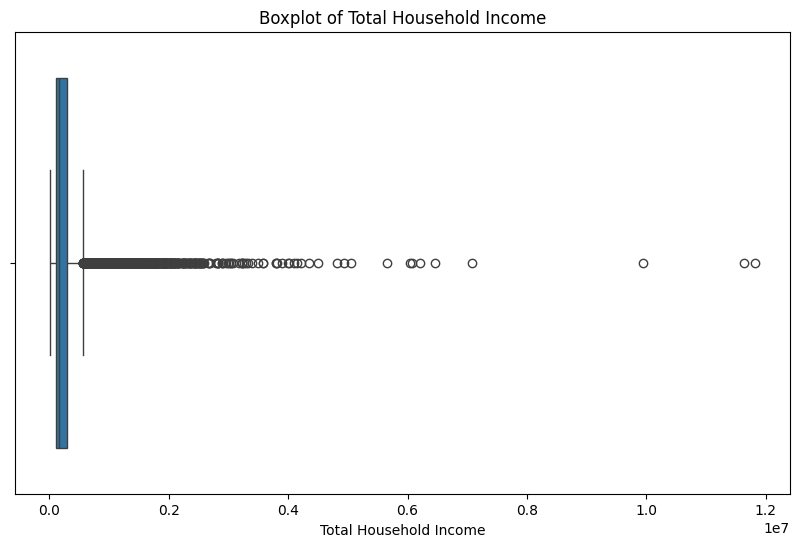

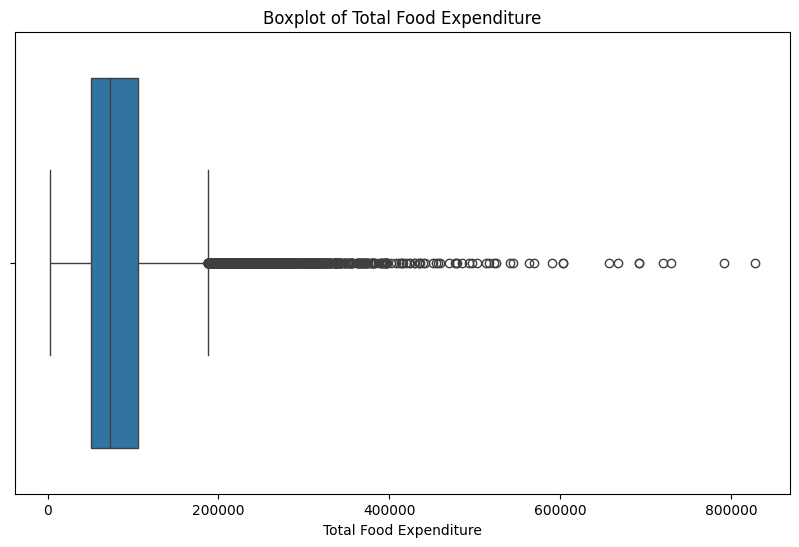

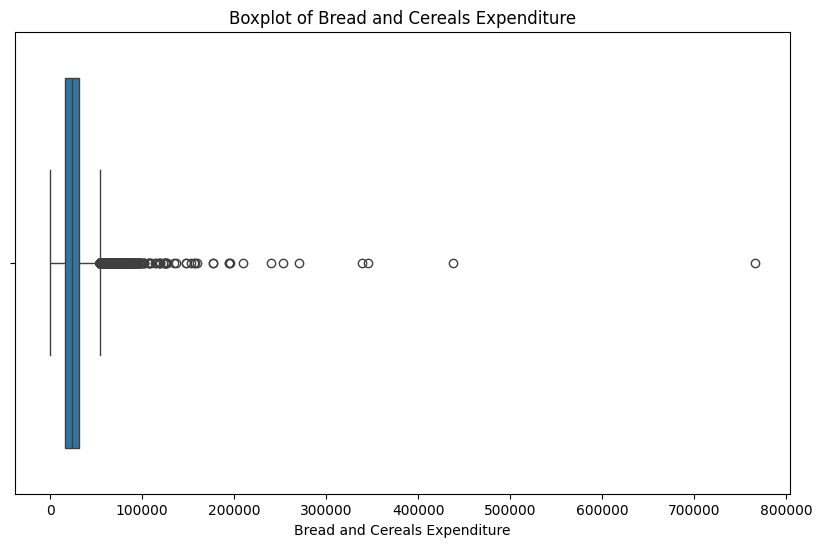

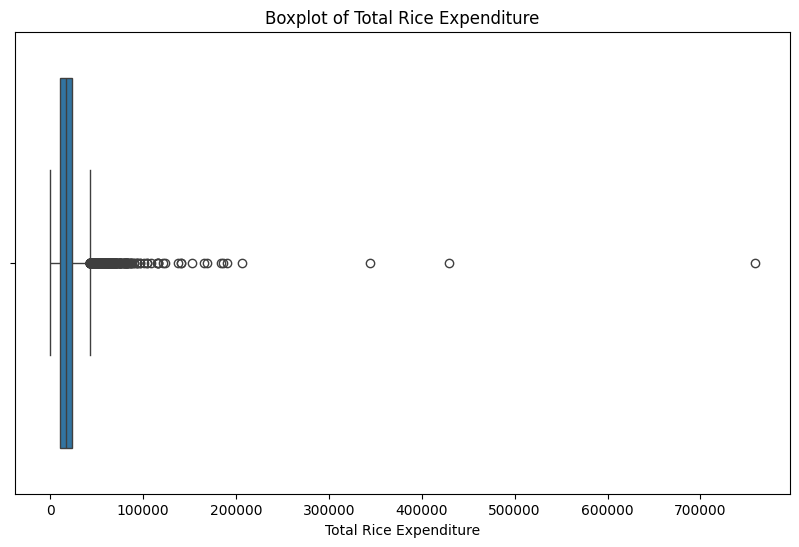

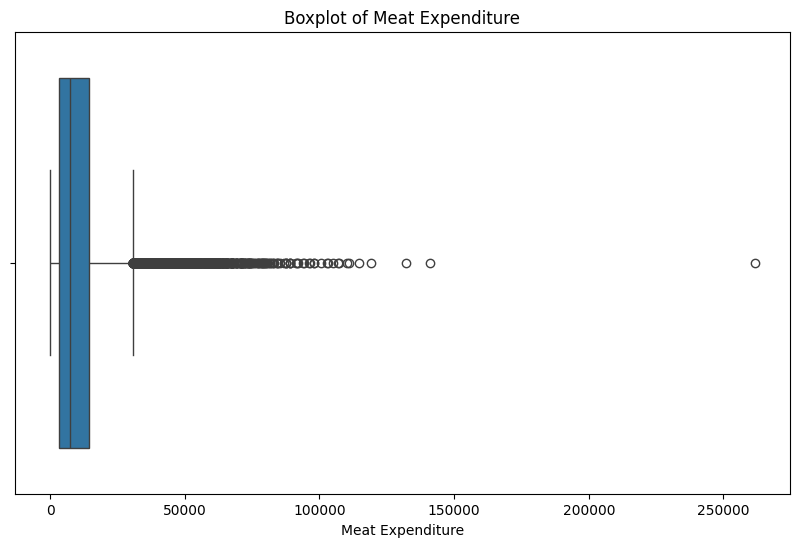

...

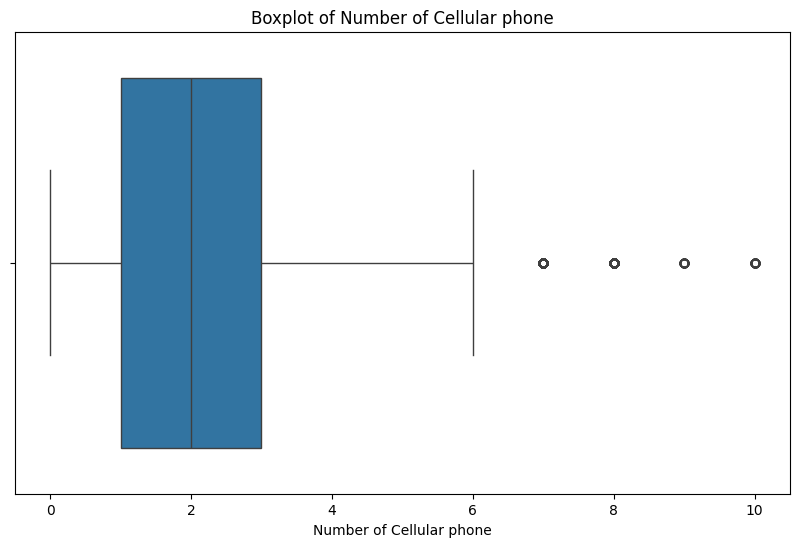

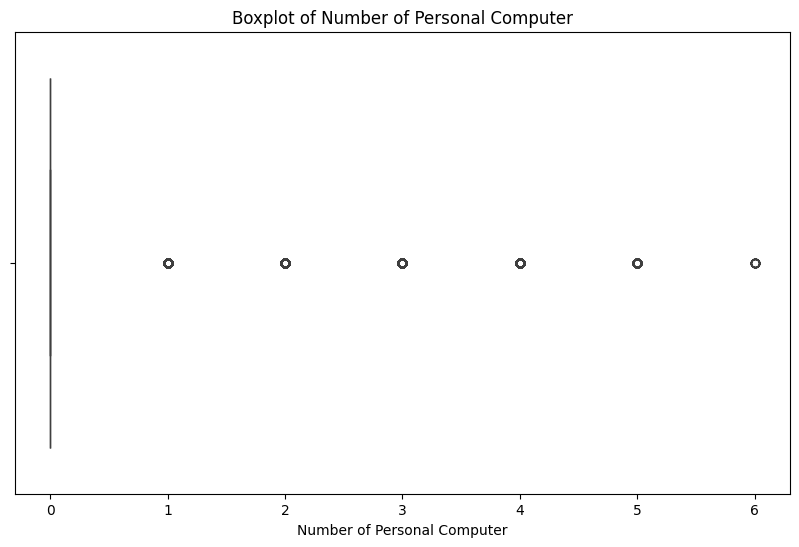

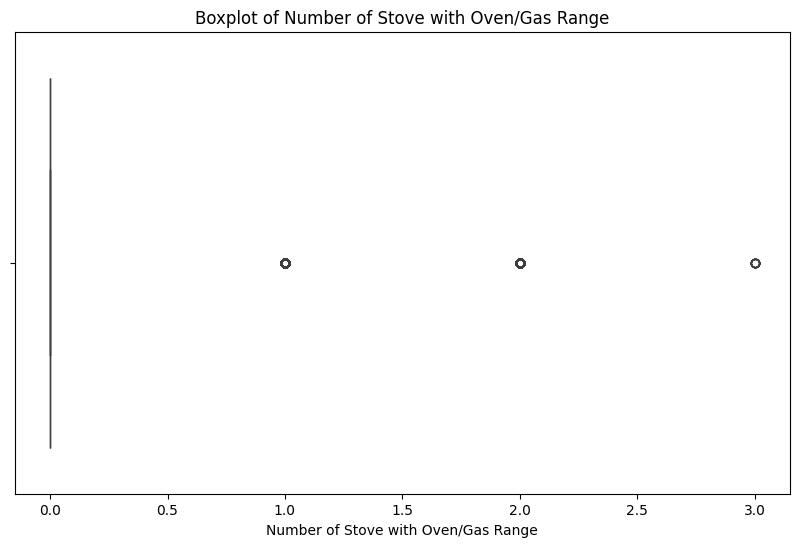

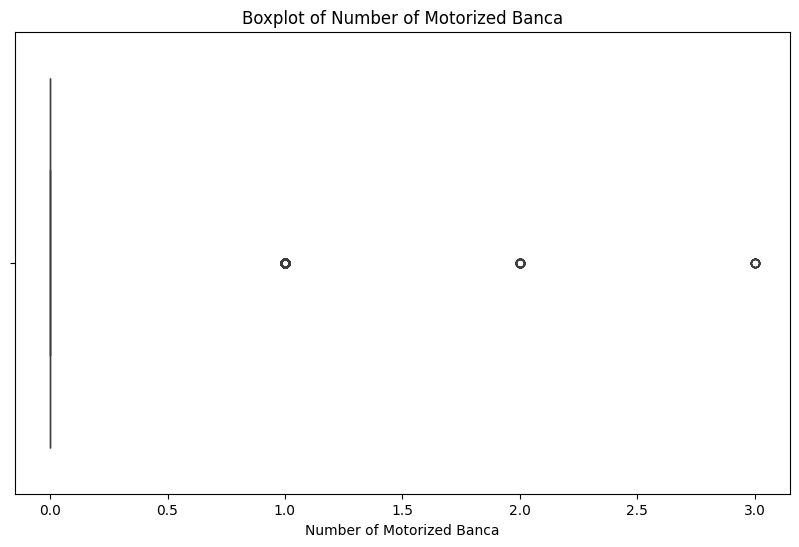

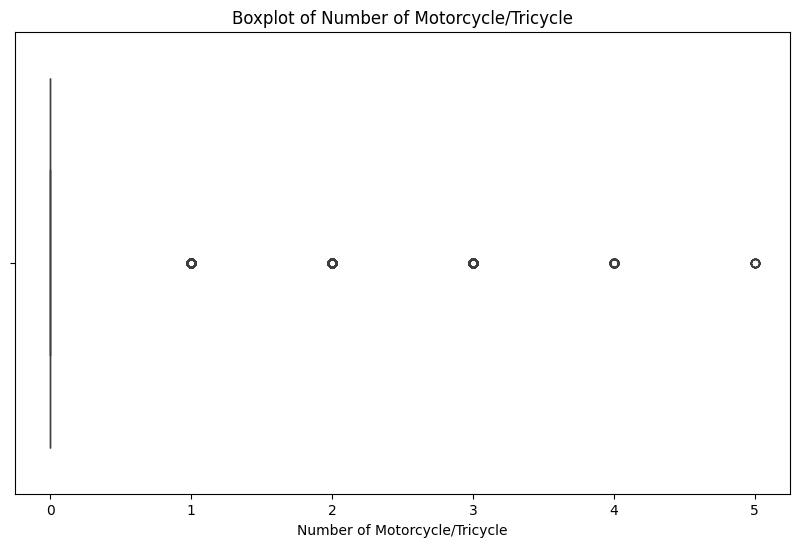

In [576]:
# Boxplot for Numerical Columns
for col in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x=col)
    plt.title(f'Boxplot of {col}')
    plt.show()

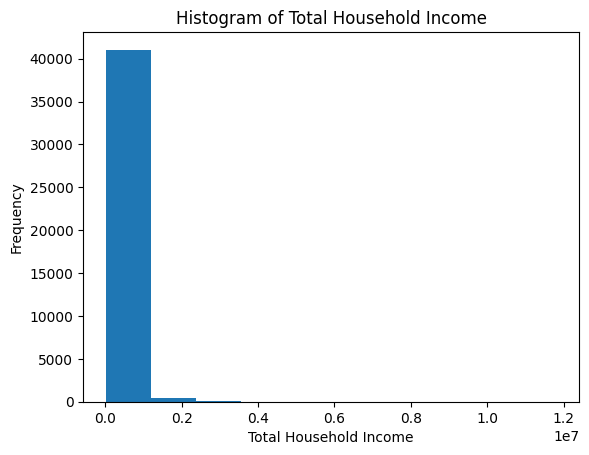

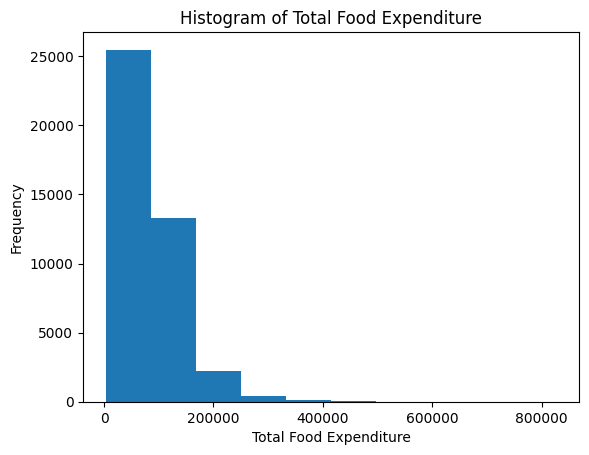

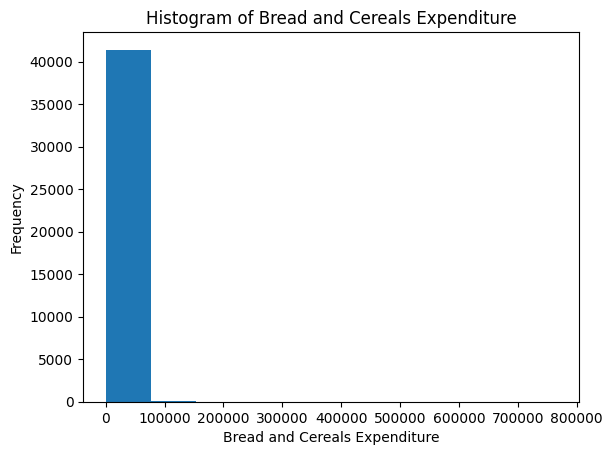

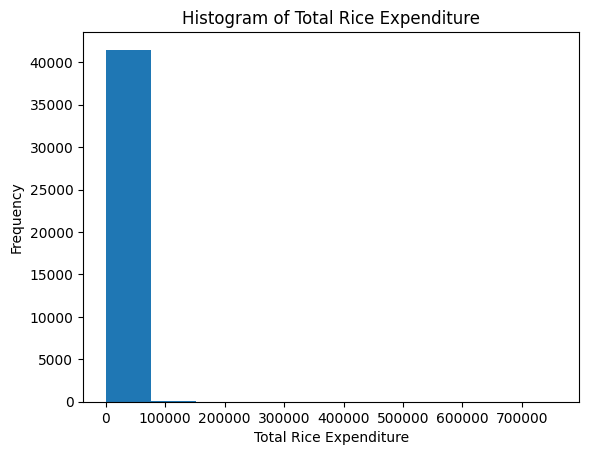

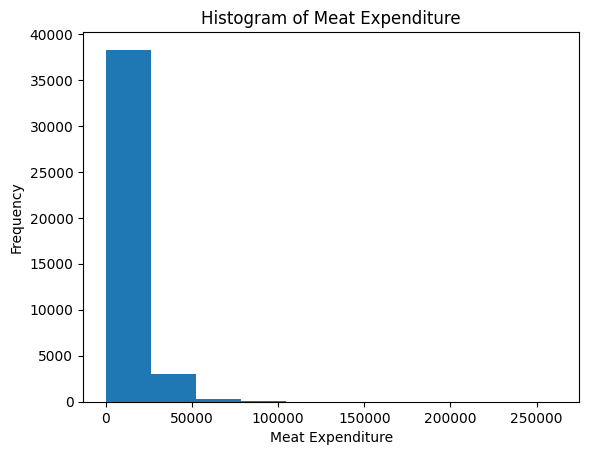

...

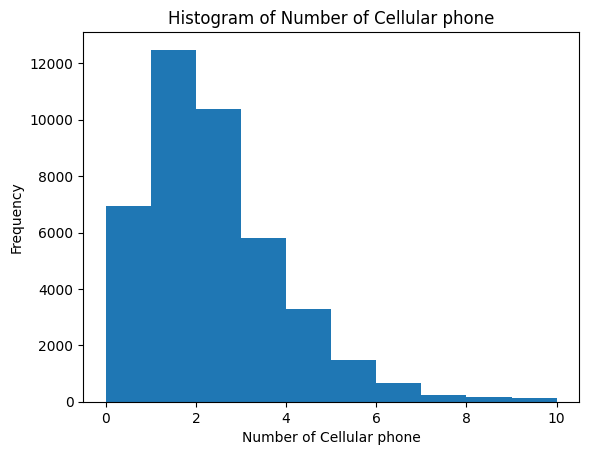

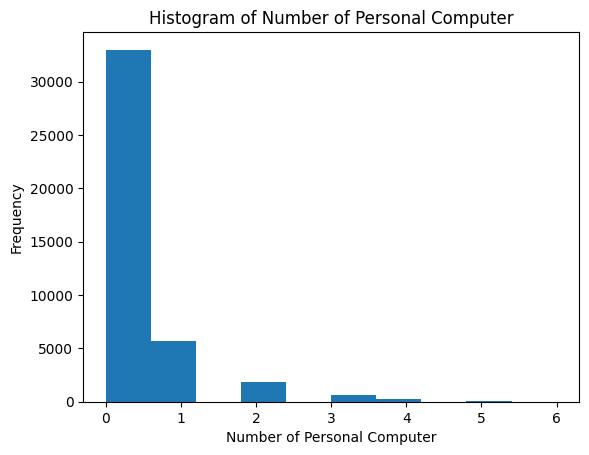

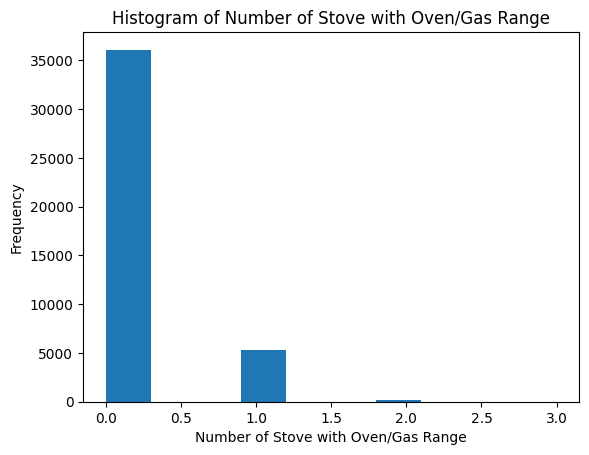

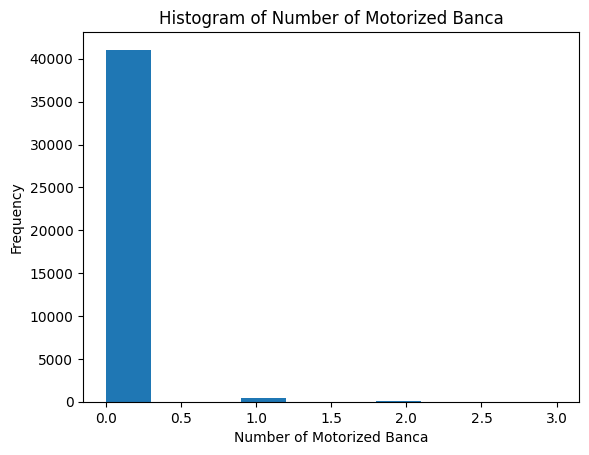

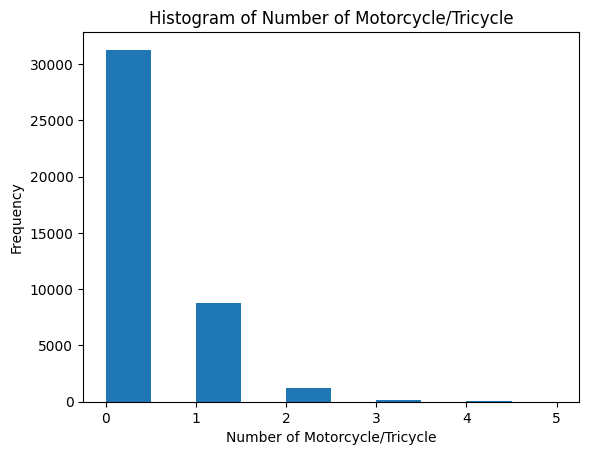

In [577]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [578]:
# Average Total Household Income per Region
average_income_per_region = df.groupby('Region')['Total Household Income'].mean().sort_values(ascending=False)
average_income_per_region

,Total Household Income
Region,
NCR,420861.861501
IVA - CALABARZON,303360.536040
III - Central Luzon,292965.181650
CAR,269540.484638
XI - Davao Region,238115.891251
I - Ilocos Region,238110.084327
II - Cagayan Valley,236778.221721
VII - Central Visayas,234909.314050
VI - Western Visayas,220481.260260


> Key Insights from numerical columns
- Too many outliers for all numerical values due to extreme household income values
- Zero values and positive skew for all numerical values
- The Greater Manila Area (NCR and neighboring provinces) have the most share of the income across the Philippines.
- Average Total Household Income comes around 250K
- Transformation and Outlier Detection is vital to cap extreme values and normalize the distribution


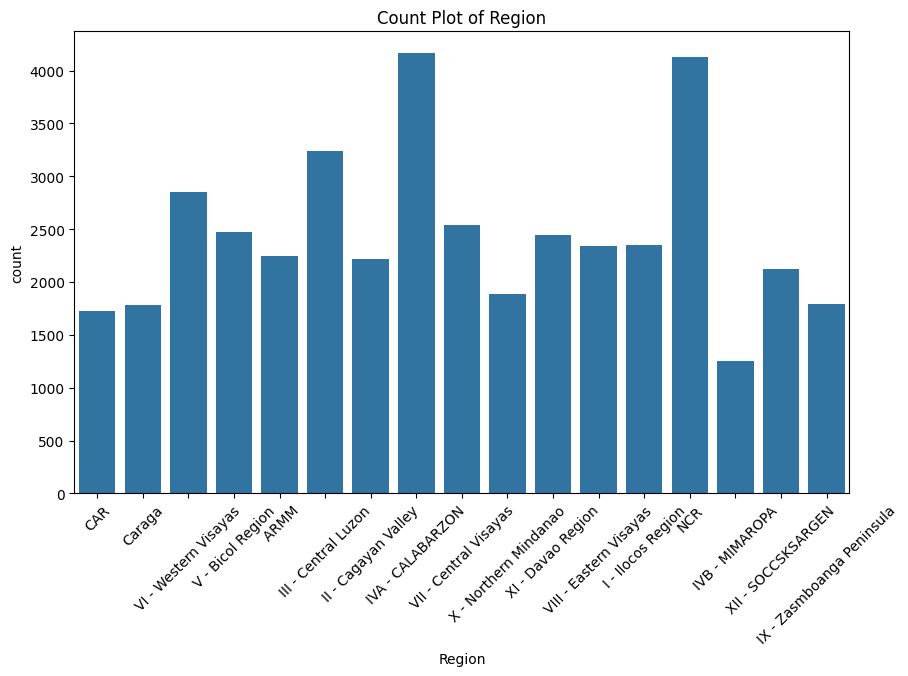

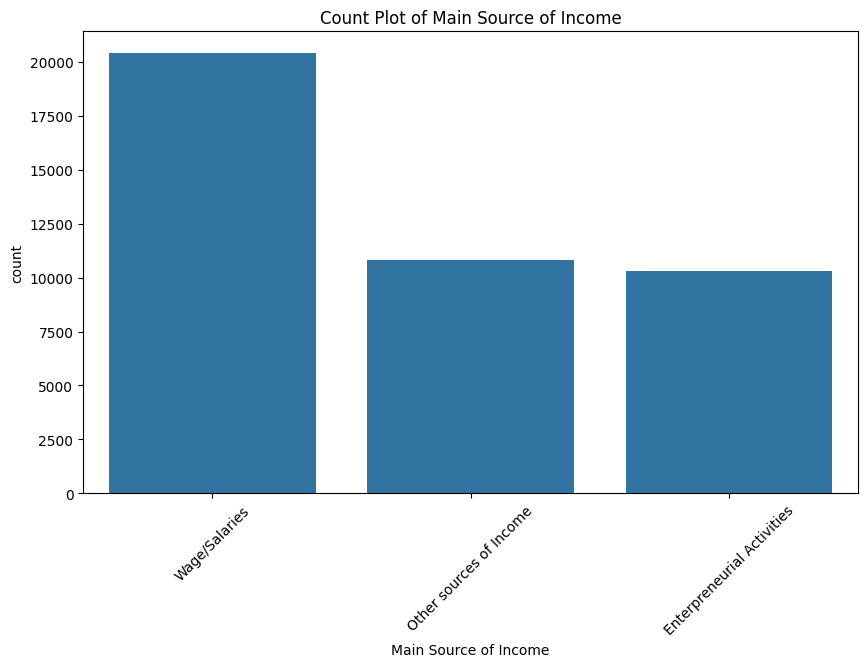

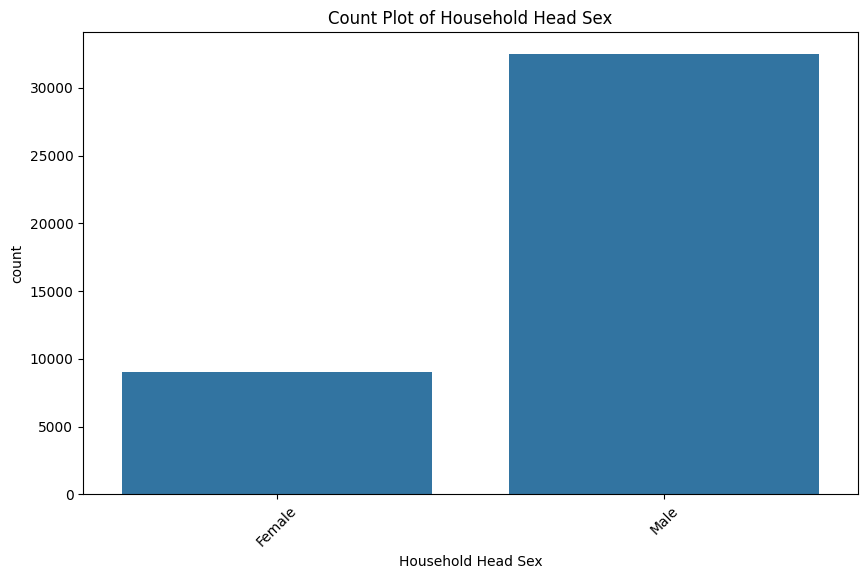

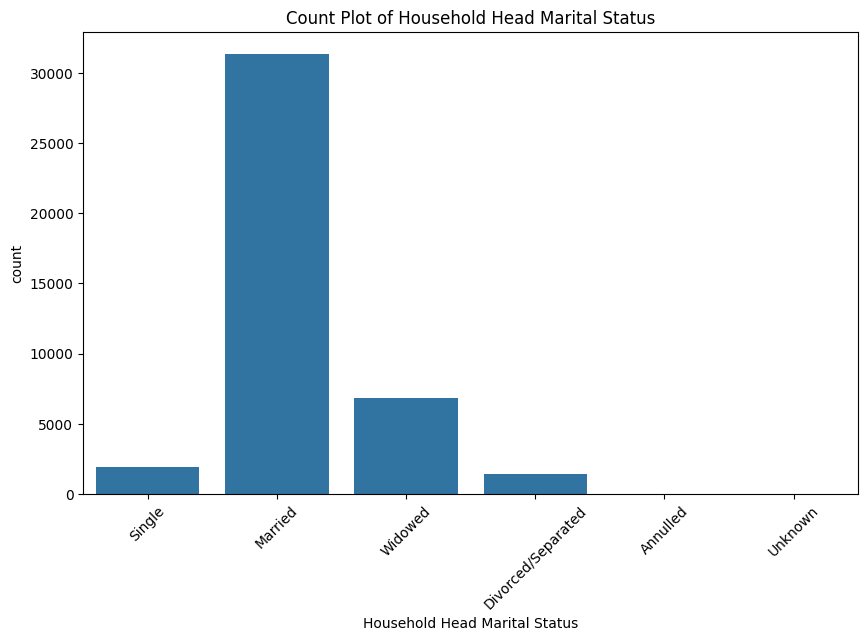

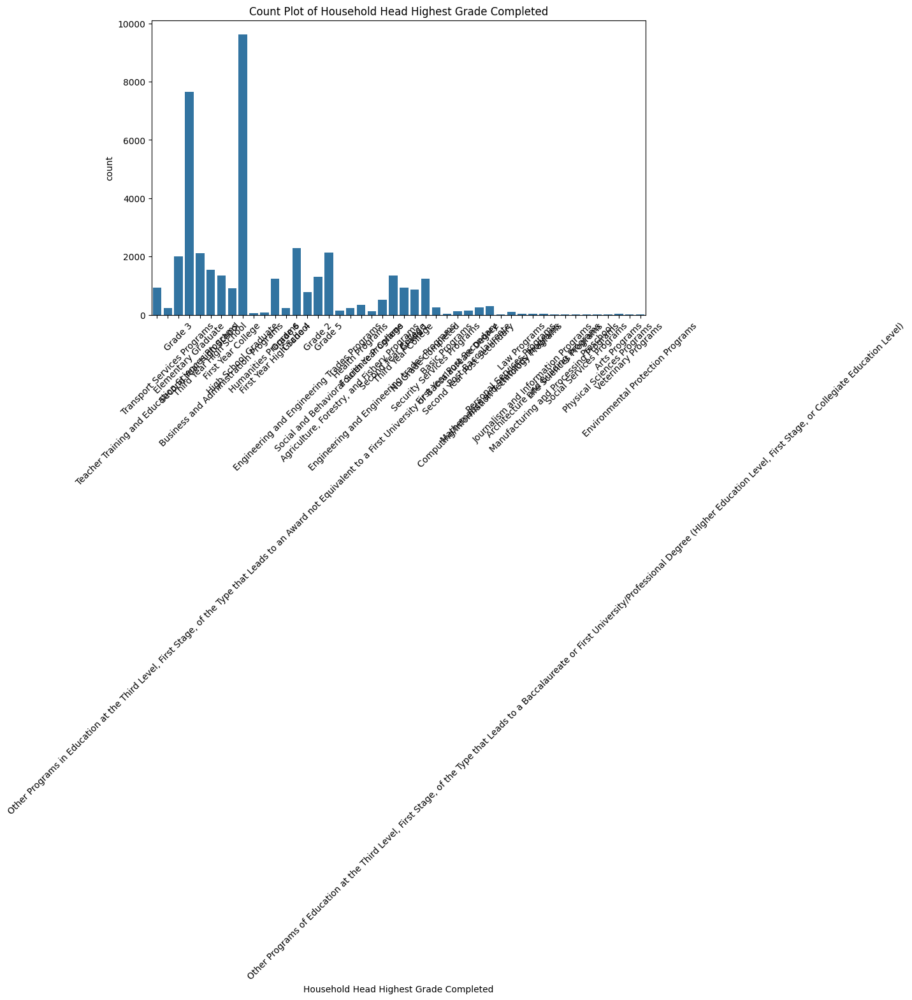

...

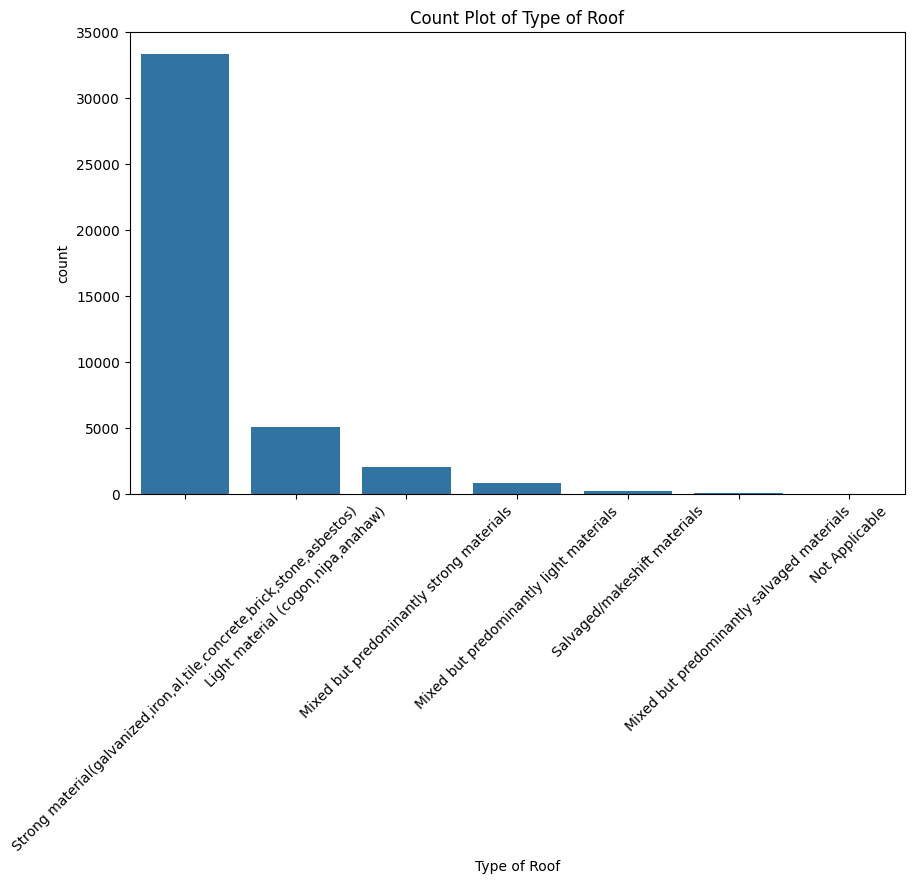

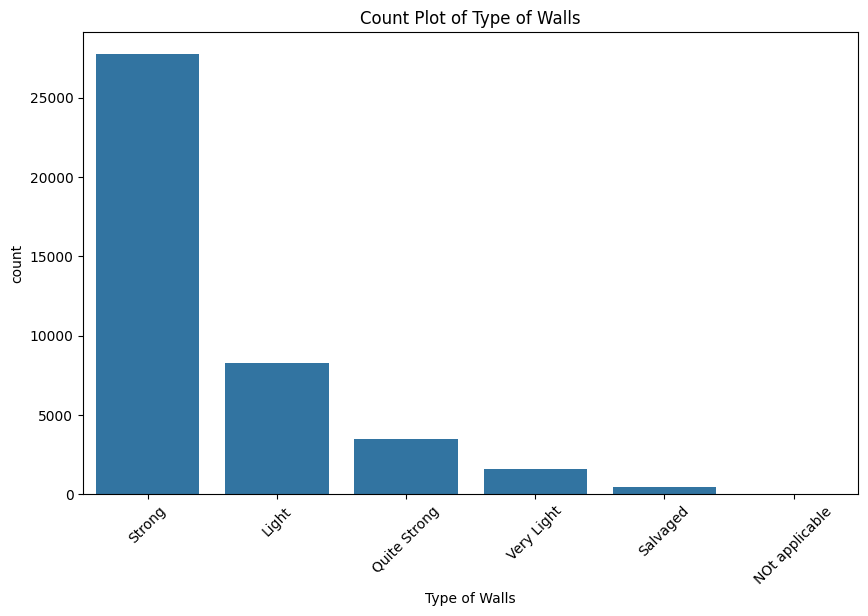

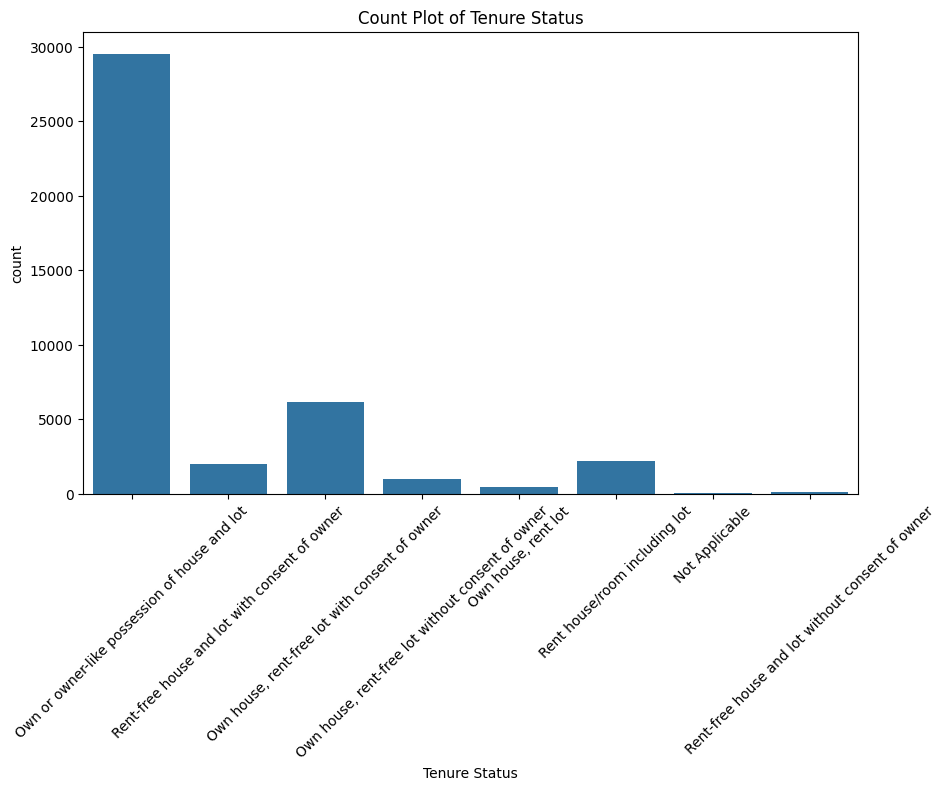

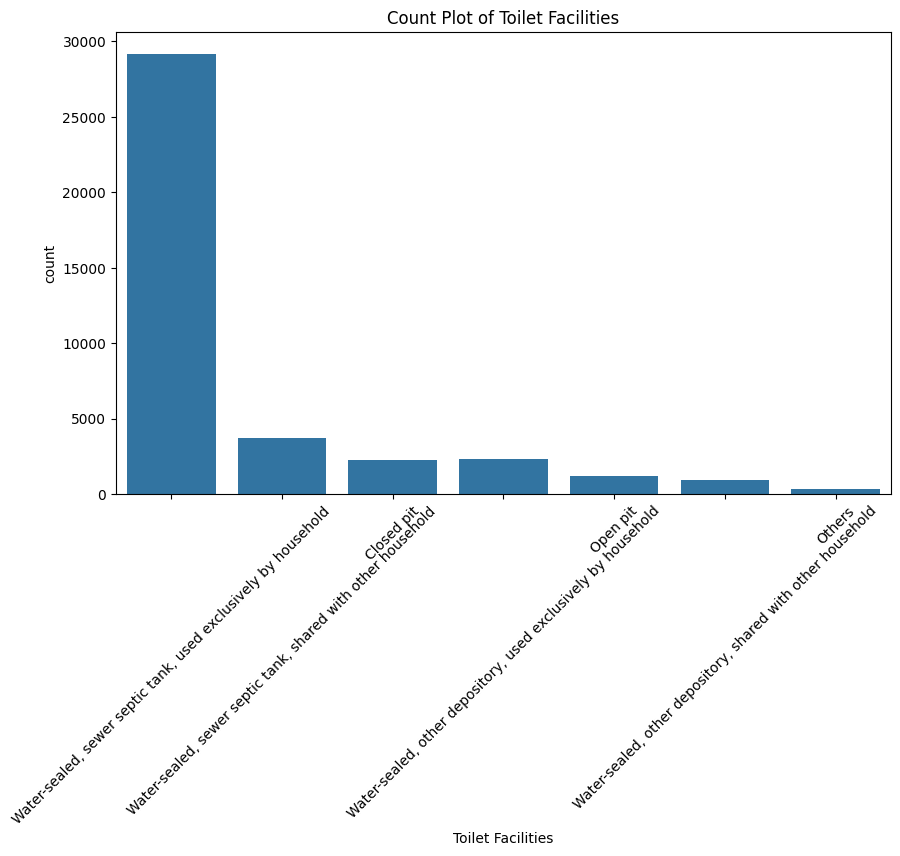

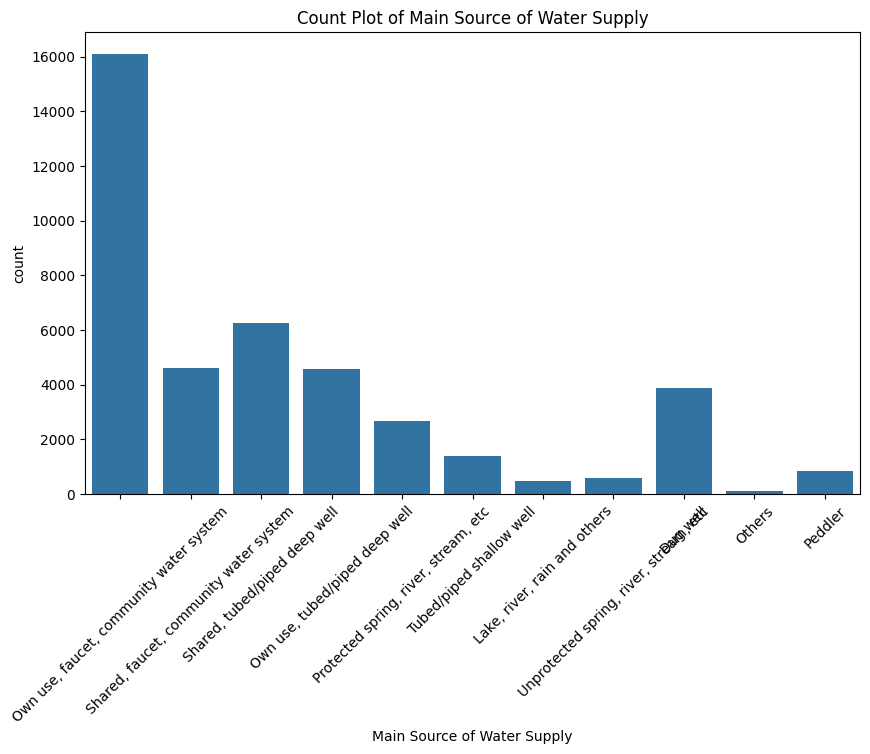

In [579]:
# Plot categorical columns. Tilt x values
for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.xticks(rotation=45)
    plt.title(f'Count Plot of {col}')

In [580]:
# Unique Values of Null Columns : Household Head Occupation, Household Head Class of Worker, Toilet Facilities
null_columns = df.columns[df.isna().any()]
null_columns

Index(['Household Head Occupation', 'Household Head Class of Worker',
       'Toilet Facilities'],
      dtype='object')

In [581]:
# Print unique values for each null column
for column in null_columns:
    unique_values = df[column].unique()
    print(f"Unique values for {column}: {unique_values}")

Unique values for Household Head Occupation: ['General elementary education teaching professionals'
 'Transport conductors' 'Farmhands and laborers' 'Rice farmers'
 'General managers/managing proprietors in transportation, storage and communications'
 'Heavy truck and lorry drivers' nan 'Hog raising farmers'
 'Vegetable farmers'
 'General managers/managing proprietors in wholesale and retail trade'
 'Stocks clerks' 'Justices' 'Other social science professionals'
 'Protective services workers n. e. c.' 'Secretaries'
 'Electronics mechanics and servicers' 'Foresters and related scientists'
 'Shop salespersons and demonstrators'
 'College, university and higher education teaching professionals'
 'General managers/managing proprietors of restaurants and hotels'
 'Welders and flamecutters' 'Car, taxi and van drivers'
 'Motor vehicle mechanics and related trades workers'
 'Traditional chiefs and heads of villages' 'Motorcycle drivers'
 'Statistical, mathematical and related associate profess

In [582]:
df['Household Head Occupation'].value_counts()

,count
Household Head Occupation,
Farmhands and laborers,3478
Rice farmers,2849
General managers/managing proprietors in wholesale and retail trade,2028
"General managers/managing proprietors in transportation, storage and communications",1932
Corn farmers,1724
...,...
Petroleum and natural gas refining plant operators,1
Builders (traditional materials),1
"Personal care and related workers, n. e. c.",1


In [583]:
df['Household Head Highest Grade Completed'].value_counts()

,count
Household Head Highest Grade Completed,
High School Graduate,9628
Elementary Graduate,7640
Grade 4,2282
Grade 5,2123
Second Year High School,2104
Grade 3,1994
Third Year High School,1545
Business and Administration Programs,1344
Second Year College,1343


In [584]:
df['Household Head Class of Worker'].value_counts()

,count
Household Head Class of Worker,
Self-employed wihout any employee,13766
Worked for private establishment,13731
Worked for government/government corporation,2820
Employer in own family-operated farm or business,2581
Worked for private household,811
Worked without pay in own family-operated farm or business,285
Worked with pay in own family-operated farm or business,14


In [585]:
# Regions of Rows with Null Columns
df[df['Household Head Occupation'].isna()]['Region'].value_counts() # 7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [586]:
df[df['Household Head Class of Worker'].isna()]['Region'].value_counts() #7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [587]:
# Regions of Rows with Null 'Household Head Occupation' and 'Household Head Class of Worker'
df[(df['Household Head Occupation'].isna()) & (df['Household Head Class of Worker'].isna())]['Region'].value_counts() # 7536 Null Values

,count
Region,
NCR,1021
IVA - CALABARZON,924
III - Central Luzon,804
I - Ilocos Region,553
VI - Western Visayas,548
VII - Central Visayas,449
V - Bicol Region,411
VIII - Eastern Visayas,370
XI - Davao Region,366


In [588]:
df[df['Toilet Facilities'].isna()]['Region'].value_counts() # 1580 Null Values

,count
Region,
V - Bicol Region,277
VI - Western Visayas,224
VIII - Eastern Visayas,210
VII - Central Visayas,193
ARMM,144
IVA - CALABARZON,112
XII - SOCCSKSARGEN,86
IVB - MIMAROPA,76
Caraga,74


> Key Insights from numerical columns
- Occupation and Educational Attainment contains too many values for model training and may introduce noise
- Null Values (n = 7536) is too many to be dropped. Impute with "Unknown"
- Repetitive values could be further simplified in some categories (e.g. Tenure Status, Source of Water)


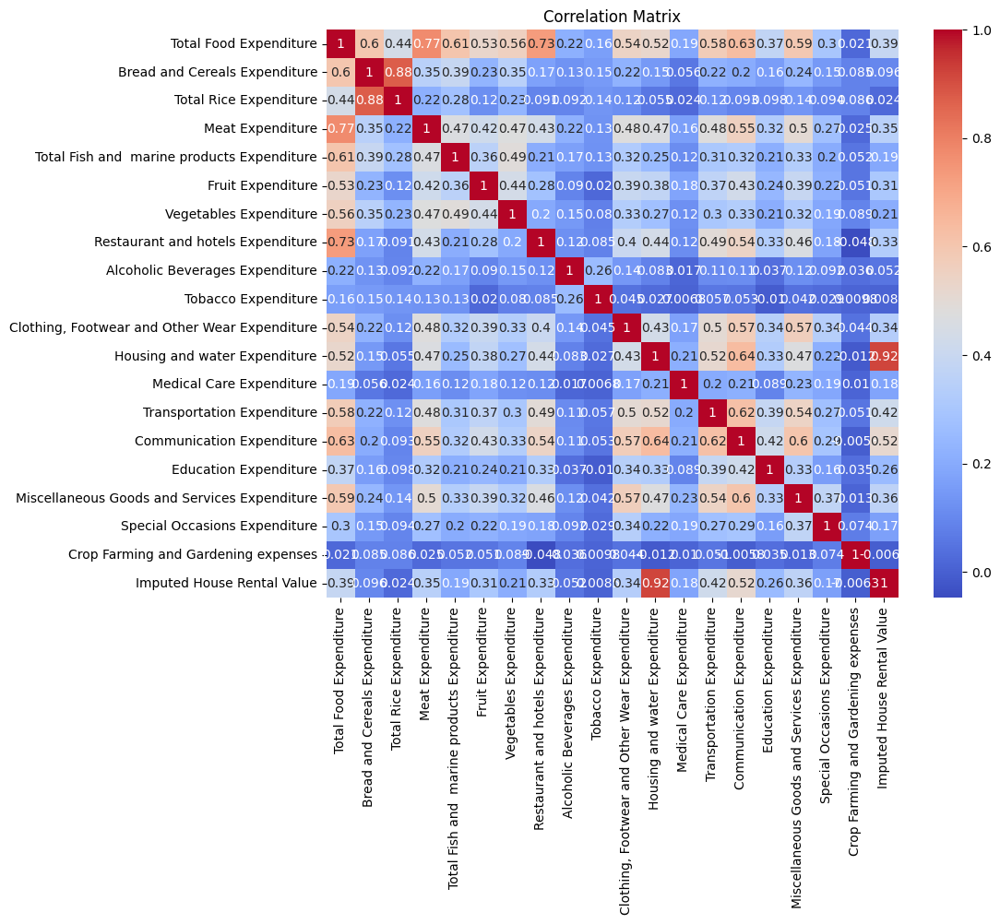

In [589]:
# Plot Correlation Matrix for Numerical Values
plt.figure(figsize=(10, 8))
sns.heatmap(df[expenditure_columns].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Feature Engineering

In [590]:
# Get Unaccounted Bread and Cereals Expenditure by Subtracting Total Rice Expenditure from Bread and Cereals Expenditure
df['Other Bread and Cereals Expenditure'] = df['Bread and Cereals Expenditure'] - df['Total Rice Expenditure']

In [591]:
# Include Other Bread and Cereals Expenditure
expenditure_columns = np.append(expenditure_columns, 'Other Bread and Cereals Expenditure')

In [592]:
expenditure_columns

array(['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure'], dtype=object)

In [593]:
# Aggregate Essential Spending
essential_cols = ['Total Food Expenditure', 'Housing and water Expenditure',
                  'Medical Care Expenditure', 'Education Expenditure',
                  'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses']

df['Total_Essential_Spending'] = df[essential_cols].sum(axis=1)

In [594]:
# Aggregate Non-Essential Spending
non_essential_cols = [
    'Restaurant and hotels Expenditure', 'Alcoholic Beverages Expenditure',
    'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
    'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure'
]

df['Total_NonEssential_Spending'] = df[non_essential_cols].sum(axis=1)

In [595]:
df['Total Expenditure'] = df['Total_Essential_Spending'] + df['Total_NonEssential_Spending']

In [596]:
# Create Ratios to Normalize and Understand Expenditure Distribution per Household
ratio_list = []

In [597]:
# Food Ratios
df['Meat Ratio'] = df['Meat Expenditure'] / df['Total Food Expenditure']
df['Fish Ratio'] = df['Total Fish and  marine products Expenditure'] / df['Total Food Expenditure']
df['Fruit Ratio'] = df['Fruit Expenditure'] / df['Total Food Expenditure']
df['Vegetables Ratio'] = df['Vegetables Expenditure'] / df['Total Food Expenditure']
df['Bread and Cereals Ratio'] = df['Bread and Cereals Expenditure'] / df['Total Food Expenditure']
df['Rice Ratio'] = df['Total Rice Expenditure'] / df['Total Food Expenditure']
df['Other Bread and Cereals Ratio'] = df['Other Bread and Cereals Expenditure'] / df['Total Food Expenditure']

In [598]:
ratio_list.append('Meat Ratio')
ratio_list.append('Fish Ratio')
ratio_list.append('Fruit Ratio')
ratio_list.append('Vegetables Ratio')
ratio_list.append('Bread and Cereals Ratio')
ratio_list.append('Rice Ratio')
ratio_list.append('Other Food Ratio')

In [600]:
# Non-Food Ratios to Total Expenditure
df['Food Ratio'] = df['Total Food Expenditure'] / df['Total Expenditure']
df['Housing and water Ratio'] = df['Housing and water Expenditure'] / df['Total Expenditure']
df['Alcoholic Beverages Ratio'] = df['Alcoholic Beverages Expenditure'] / df['Total Expenditure']
df['Tobacco Ratio'] = df['Tobacco Expenditure'] / df['Total Expenditure']
df['Clothing and Footwear Ratio'] = df['Clothing, Footwear and Other Wear Expenditure'] / df['Total Expenditure']
df['Miscellaneous Goods and Services Ratio'] = df['Miscellaneous Goods and Services Expenditure'] / df['Total Expenditure']
df['Special Occasions Ratio'] = df['Special Occasions Expenditure'] / df['Total Expenditure']
df['Restaurant and hotels Ratio'] = df['Restaurant and hotels Expenditure'] / df['Total Expenditure']
df['Crop Farming and Gardening Ratio'] = df['Crop Farming and Gardening expenses'] / df['Total Expenditure']
df['Medical Care Ratio'] = df['Medical Care Expenditure'] / df['Total Expenditure']
df['Education Ratio'] = df['Education Expenditure'] / df['Total Expenditure']
df['Communication Ratio'] = df['Communication Expenditure'] / df['Total Expenditure']
df['Transportation Ratio'] = df['Transportation Expenditure'] / df['Total Expenditure']
df['House Rental Ratio'] = df['Imputed House Rental Value'] / df['Total Expenditure']

In [601]:
ratio_list.append('Food Ratio')
ratio_list.append('Housing and water Ratio')
ratio_list.append('Alcoholic Beverages Ratio')
ratio_list.append('Tobacco Ratio')
ratio_list.append('Clothing and Footwear Ratio')
ratio_list.append('Miscellaneous Goods and Services Ratio')
ratio_list.append('Special Occasions Ratio')
ratio_list.append('Restaurant and hotels Ratio')
ratio_list.append('Crop Farming and Gardening Ratio')
ratio_list.append('Medical Care Ratio')
ratio_list.append('Education Ratio')
ratio_list.append('Communication Ratio')
ratio_list.append('Transportation Ratio')
ratio_list.append('House Rental Ratio')

In [602]:
# Aggregate Non-Food Spending
non_food_expenditure_cols = ['Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                             'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                             'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure',
                             'Restaurant and hotels Expenditure', 'Crop Farming and Gardening expenses',
                             'Medical Care Expenditure', 'Education Expenditure',
                             'Communication Expenditure', 'Transportation Expenditure']

In [603]:
specific_food_expenditure_cols = ['Bread and Cereals Expenditure', 'Other Bread and Cereals Expenditure', 'Total Rice Expenditure', 'Meat Expenditure',
                                  'Total Fish and  marine products Expenditure', 'Fruit Expenditure', 'Vegetables Expenditure']

In [604]:
# Income minus Expenditure
df['Diff_Income_Expenditure'] = df['Total Household Income'] - df['Total Expenditure']

In [605]:
# Count rows where Diff_Income Expenditures > 0
df[df['Diff_Income_Expenditure'] > 0].shape

(24952, 86)

In [606]:
# Create Remaining_Income column where Diff_Income_Expenditure is greater than 0, else 0
df['Remaining_Income'] = np.where(df['Diff_Income_Expenditure'] > 0, df['Diff_Income_Expenditure'], 0)

In [607]:
# Create Amount_Outside_Income where Diff_Income_Expenditure is less than 0, else 0
df['Amount_Outside_Income'] = np.where(df['Diff_Income_Expenditure'] < 0, df['Diff_Income_Expenditure'], 0)

In [608]:
# Convert to Positive Value 'Amount_Outside_Income'
df['Amount_Outside_Income'] = df['Amount_Outside_Income'].abs()

In [609]:
df['Debt to Income Ratio'] = df['Amount_Outside_Income'] / df['Total Household Income']
df['Savings to Income Ratio'] = df['Remaining_Income'] / df['Total Household Income']

In [610]:
df["Per Capita Income"] = df["Total Household Income"] / df["Total Number of Family members"]
df["Per Capita Expenditure"] = df["Total Expenditure"] / df["Total Number of Family members"]

In [611]:
df['Expenditure to Income Ratio'] = df['Total Expenditure'] / df['Total Household Income']
df['Essential_Spending_Ratio'] = df['Total_Essential_Spending'] / df['Total Expenditure']
df['NonEssential_Spending_Ratio'] = df['Total_NonEssential_Spending'] / df['Total Expenditure']

In [612]:
ratio_list.append('Expenditure to Income Ratio')
ratio_list.append('Essential_Spending_Ratio')
ratio_list.append('NonEssential_Spending_Ratio')
ratio_list.append('Per Capita Income')
ratio_list.append('Per Capita Expenditure')

In [613]:
ratio_list.append('Debt to Income Ratio')
ratio_list.append('Savings to Income Ratio')

In [614]:
# Drop Diff_Income_Expenditure
df.drop(columns=['Diff_Income_Expenditure'], inplace=True)

Include Binary Indicators for Zero-Inflated Expenditure/Income (Observation after PowerTransformer and Standardization)
- Alcoholic Beverages Expenditure
- Tobacco Expenditure
- Education Expenditure
- Special Occasions Expenditure
- Crop Farming and Gardening Expenses
- Remaining Income
- Amount Outside Income

In [615]:
df['Is_Consuming_Alcohol'] = np.where(df['Alcoholic Beverages Expenditure'] > 0, 1, 0)
df['Is_Tobacco_User'] = np.where(df['Tobacco Expenditure'] > 0, 1, 0)
df['Have_Kids_in_School'] = np.where(df['Education Expenditure'] > 0, 1, 0)
df['Is_Spending_For_Occasions'] = np.where(df['Special Occasions Expenditure'] > 0, 1, 0)
df['Is_Farmer'] = np.where(df['Crop Farming and Gardening expenses'] > 0, 1, 0)
df['Saves_Money'] = np.where(df['Remaining_Income'] > 0, 1, 0)
df['Is_Spending_Above_Income'] = np.where(df['Amount_Outside_Income'] > 0, 1, 0)

In [616]:
# Add Essential and Non-Essential Spending to expenditure columns
expenditure_columns = np.append(expenditure_columns, 'Total_Essential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total_NonEssential_Spending')
expenditure_columns = np.append(expenditure_columns, 'Total Expenditure')
expenditure_columns

array(['Total Food Expenditure', 'Bread and Cereals Expenditure',
       'Total Rice Expenditure', 'Meat Expenditure',
       'Total Fish and  marine products Expenditure', 'Fruit Expenditure',
       'Vegetables Expenditure', 'Restaurant and hotels Expenditure',
       'Alcoholic Beverages Expenditure', 'Tobacco Expenditure',
       'Clothing, Footwear and Other Wear Expenditure',
       'Housing and water Expenditure', 'Medical Care Expenditure',
       'Transportation Expenditure', 'Communication Expenditure',
       'Education Expenditure',
       'Miscellaneous Goods and Services Expenditure',
       'Special Occasions Expenditure',
       'Crop Farming and Gardening expenses',
       'Imputed House Rental Value',
       'Other Bread and Cereals Expenditure', 'Total_Essential_Spending',
       'Total_NonEssential_Spending', 'Total Expenditure'], dtype=object)

In [617]:
# Drop expenditure columns from df
df.drop(columns=expenditure_columns, inplace=True)

In [619]:
# Add Newly Created Income Columns to Income Columns
income_columns = np.append(income_columns, 'Remaining_Income')
income_columns = np.append(income_columns, 'Amount_Outside_Income')
income_columns

array(['Total Household Income',
       'Total Income from Entrepreneurial Acitivites', 'Remaining_Income',
       'Amount_Outside_Income'], dtype=object)

In [620]:
income_columns

array(['Total Household Income',
       'Total Income from Entrepreneurial Acitivites', 'Remaining_Income',
       'Amount_Outside_Income'], dtype=object)

In [621]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 77 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Total Household Income                        41544 non-null  int64  
 1   Region                                        41544 non-null  object 
 2   Main Source of Income                         41544 non-null  object 
 3   Agricultural Household indicator              41544 non-null  int64  
 4   Total Income from Entrepreneurial Acitivites  41544 non-null  int64  
 5   Household Head Sex                            41544 non-null  object 
 6   Household Head Age                            41544 non-null  int64  
 7   Household Head Marital Status                 41544 non-null  object 
 8   Household Head Highest Grade Completed        41544 non-null  object 
 9   Household Head Job or Business Indicator      41544 non-null 

In [622]:
essential_household_assets = ['Number of Refrigerator/Freezer',
                'Number of Stove with Oven/Gas Range',
                'Number of Washing Machine']

communication_and_connectivity_assets = ['Number of Cellular phone',
                 'Number of Landline/wireless telephones', 'Number of Personal Computer']

transporation_assets = ['Number of Car, Jeep, Van', 'Number of Motorcycle/Tricycle', 'Number of Motorized Banca']

entertainment_and_leisure_assets = ['Number of Television', 'Number of CD/VCD/DVD', 'Number of Component/Stereo set']

In [623]:
# Create Different Asset Counts columns based on the listed assets
df['Essential_Household_Assets'] = df[essential_household_assets].sum(axis=1)
df['Communication_and_Connectivity_Assets'] = df[communication_and_connectivity_assets].sum(axis=1)
df['Transporation_Assets'] = df[transporation_assets].sum(axis=1)
df['Entertainment_and_Leisure_Assets'] = df[entertainment_and_leisure_assets].sum(axis=1)

In [624]:
# Create binary indicator if a household has an Air conditioner based on Number of Airconditioner
df['Has_Air_Conditioner'] = np.where(df['Number of Airconditioner'] > 0, 1, 0)

In [625]:
# Compile in one List all created assets columns
household_assets = ['Essential_Household_Assets', 'Communication_and_Connectivity_Assets', 'Transporation_Assets', 'Entertainment_and_Leisure_Assets', 'Has_Air_Conditioner']

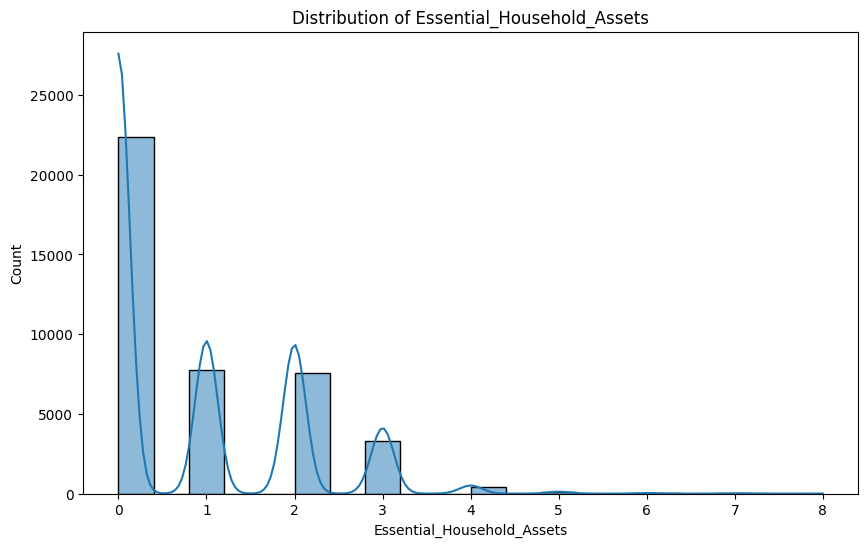

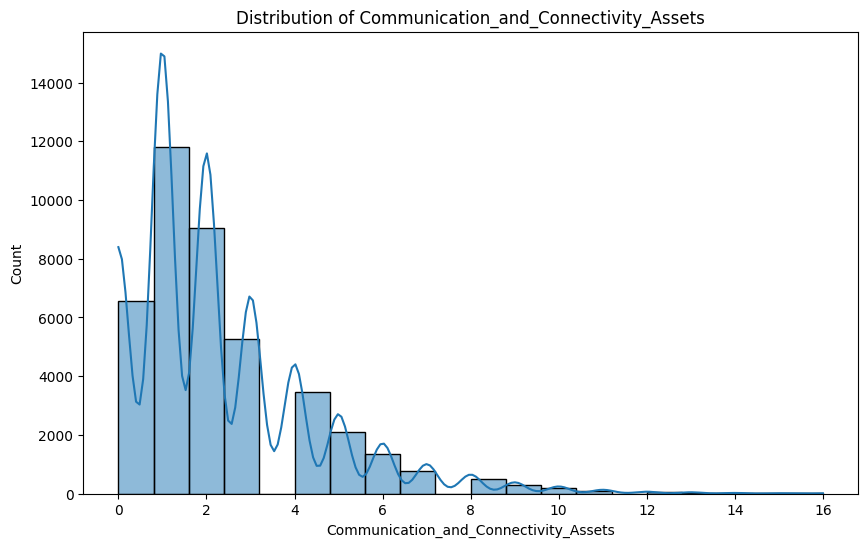

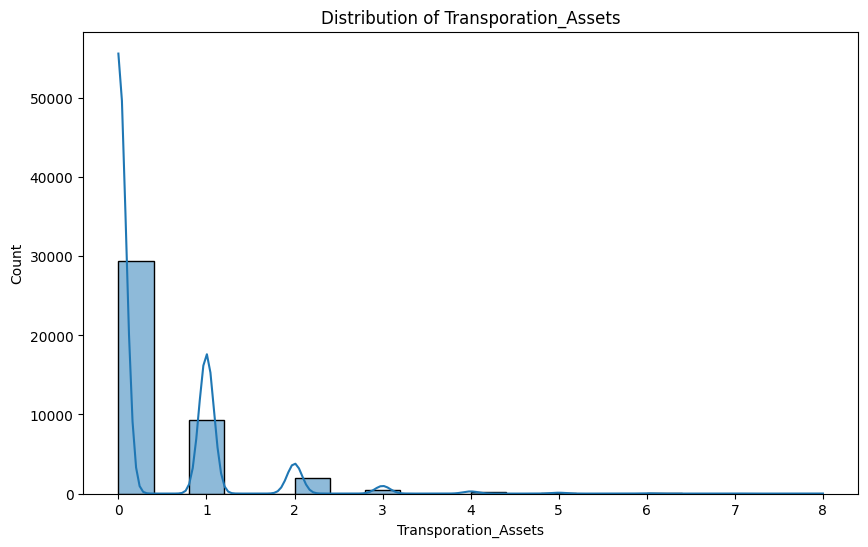

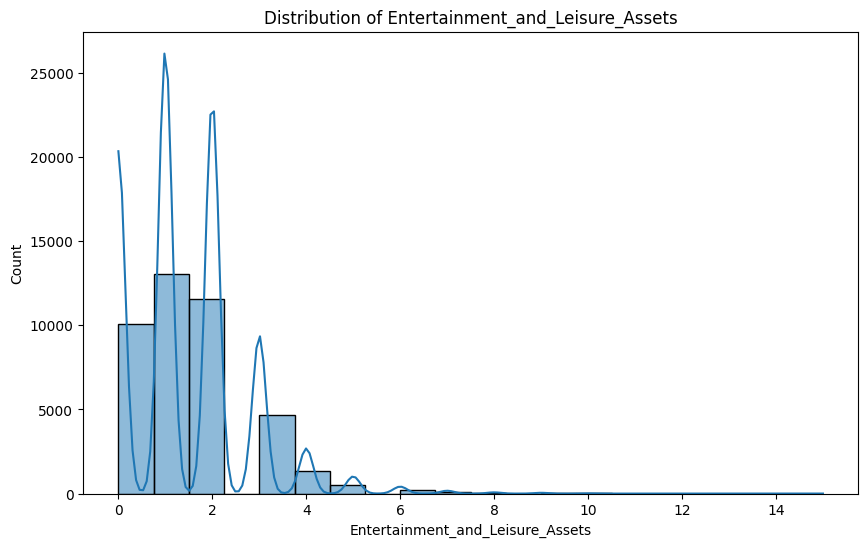

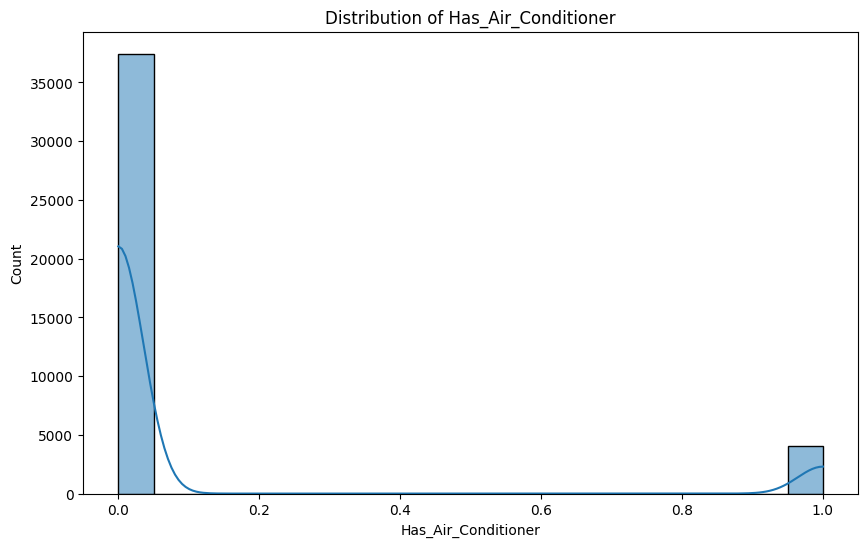

In [626]:
# Plot all columns in household_assets, individually
for col in household_assets:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[col], bins=20, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)

In [627]:
# Capture number of unemployed people
df['Number of Unemployed'] = df['Total Number of Family members'] - df['Total number of family members employed']

In [628]:
# If Number of Unemployed is Negative, change it to 0
df['Number of Unemployed'] = df['Number of Unemployed'].apply(lambda x: 0 if x < 0 else x)

In [629]:
# Capture number of Kids
df['Number of Kids'] = df['Members with age less than 5 year old'] + df['Members with age 5 - 17 years old']

In [630]:
# Capture number of dependencies
df['Number of Dependencies'] = df['Number of Kids'] + df['Number of Unemployed']

In [631]:
# Refresh numerical columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
numerical_columns

Index(['Total Household Income', 'Agricultural Household indicator',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
       'Total number of family members employed', 'House Floor Area',
       'House Age', 'Number of bedrooms', 'Electricity',
       'Number of Television', 'Number of CD/VCD/DVD',
       'Number of Component/Stereo set', 'Number of Refrigerator/Freezer',
       'Number of Washing Machine', 'Number of Airconditioner',
       'Number of Car, Jeep, Van', 'Number of Landline/wireless telephones',
       'Number of Cellular phone', 'Number of Personal Computer',
       'Number of Stove with Oven/Gas Range', 'Number of Motorized Banca',
       'Number of Motorcycle/Tricycle', 'Meat Ratio', 'Fish Ratio',
       'Fruit Ratio', 'Vegetables Ratio', 'Bread and Cereals Ratio',
       'Rice Ratio', 'Other Bread and Cereals

In [632]:
# Remove Binary Indicators from numerical columns
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Is_Consuming_Alcohol'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Is_Tobacco_User'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Have_Kids_in_School'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Is_Spending_For_Occasions'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Is_Farmer'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Saves_Money'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Is_Spending_Above_Income'))

In [633]:
# Remove Electricity and Agricultural Household Indicator
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Electricity'))
numerical_columns = np.delete(numerical_columns, np.where(numerical_columns == 'Agricultural Household indicator'))
numerical_columns

Index(['Total Household Income',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
       'Total number of family members employed', 'House Floor Area',
       'House Age', 'Number of bedrooms', 'Number of Television',
       'Number of CD/VCD/DVD', 'Number of Component/Stereo set',
       'Number of Refrigerator/Freezer', 'Number of Washing Machine',
       'Number of Airconditioner', 'Number of Car, Jeep, Van',
       'Number of Landline/wireless telephones', 'Number of Cellular phone',
       'Number of Personal Computer', 'Number of Stove with Oven/Gas Range',
       'Number of Motorized Banca', 'Number of Motorcycle/Tricycle',
       'Meat Ratio', 'Fish Ratio', 'Fruit Ratio', 'Vegetables Ratio',
       'Bread and Cereals Ratio', 'Rice Ratio',
       'Other Bread and Cereals Ratio', 'Food Ratio',
       'Housing and water Ra

In [634]:
# Fill Null Columns with 'Unknown'
df[null_columns] = df[null_columns].fillna('Unknown')

In [635]:
# Dictionary to map occupations to industry sectors
industry_categories = {
    "Managers":[
        'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors of restaurants and hotels', 'Traditional chiefs and heads of villages', 'General managers/managing proprietors in manufacturing', 'General managers/managing proprietors n. e. c.', 'Production and operations managers in agriculture, hunting, forestry and fishery', 'School supervisors and principals', 'General managers/managing proprietors of business services', 'School principals', 'Government administrators (including career executive service officers)', 'Production supervisors and general foremen', 'Production and operations managers in restaurant and hotels', 'General managers/managing proprietors in agriculture, hunting, forestry and fishing', 'General managers/managing proprietors in personal care, cleaning and relative services', 'Directors and chief executives of corporations', 'General managers/managing proprietors in construction', 'Personnel and industrial relations managers', 'Production and operations managers in transport, storage and communications', 'Sales and marketing managers', 'Production and operations managers in manufacturing', 'Research and development managers', 'Production and operations managers in personal care, cleaning and relative services', 'Other specialized managers', 'Production and operations managers in wholesale and retail trade', 'Staff officers', 'Finance and administration managers', 'Commanding officers', 'Production and operations managers in construction', 'Senior officials of humanitarian and other special-interest organizations', 'Production and operations managers in business services', 'Supply and distribution managers', 'Officers, n. e. c.', 'Advertising and public relations managers'
    ],
    "Professionals":[
        'General elementary education teaching professionals', 'Justices', 'Other social science professionals', 'Foresters and related scientists', 'College, university and higher education teaching professionals', 'Legislative officials', 'Medical technologists', 'Civil engineers', 'Religious professionals', 'General secondary education teaching professionals', 'Vocational education teaching professionals', 'Choreographers and dancers', 'Accountants and auditors', 'Mechanical engineers', 'Agronomists and related scientists', 'Other computer professionals', 'Professional nurses', 'Professional, technical and related officers', 'Athletes and related workers', 'Decorators and commercial designers', 'Computer programmers', 'Pharmacists', 'Architects', 'Nutritionists-dietitians', 'Professional midwives', 'Street, nightclub and related musicians, singers and dancers', 'Electrical Engineers', 'Computer engineers and related professionals', 'Other business professionals', 'Economists', 'Chemists', 'Composers, musicians and singers', 'Photographers and image and sound recording equipment operators', 'Statisticians', 'Electronics and communications engineers', 'Fashion and other models', 'Personnel and human resource development professionals', 'Systems analysts and designers', 'Librarians, archivists and curators', 'Town planners and related professionals', 'Education methods specialists', 'Sculptors, painters and related artists', 'Medical doctors', 'Industrial engineers', 'Lawyers', 'Dentists', 'Pre-elementary education teaching professionals', 'Social work professionals', 'Technical and vocational instructors/trainors', 'Radio, television and other announcers', 'Other health professionals (except nursing)', 'Nonformal education teaching professionals other than technical and vocational trainors/instructors', 'Authors, journalists and other writers', 'Chemical engineers', 'Science and mathematics teaching professionals', 'Science and mathematics elementary education teaching professionals', 'Geodetic engineers and related professionals', 'Other creative or performing artists', 'Other teaching professionals', 'Other engineers and related professionals', 'Physiotherapists', 'Optometrists and opticians', 'Veterinarians'
    ],
    "Technicians and associate professionals" : [
        'Statistical, mathematical and related associate professionals', 'Social work associate professionals', 'Mechanical engineering technicians', 'Statistical and finance clerks', 'Non-ordained religious associate professionals', 'Other administrative associate professionals', 'Bookkeepers', 'Midwifery associate professionals', 'Safety, health and quality inspectors (vehicles, processes and products)', 'Veterinary assistants', 'Administrative secretaries and related associate professionals', 'Teaching associate professionals', 'Mining and metallurgical engineering technicians', 'Draftsmen', 'Other life science technicians', 'Legal and related business associate professionals', 'Farm technicians', 'Civil engineering technicians', 'Other health associate professionals (except nursing)', 'Medical assistants', 'Electronics and communications engineering technicians', 'Ship and aircraft controllers and technicians', 'Air traffic safety technicians', 'Other physical science and engineering technicians', 'Building and fire inspectors', 'Dental assistants', 'Other government associate professionals', 'Other finance and sales associate professionals', 'Life science technicians', 'Pharmaceutical assistants', 'Medical equipment operators', 'Nursing associate professionals', 'Electrical engineering technicians'
    ],
    "Clerical support workers" : [
        'Stocks clerks', 'Secretaries', 'Other office clerks', 'Tellers and other counter clerks', 'Accounting and bookkeeping clerks', 'Data entry operators', 'Transport clerks', 'Library and filing clerks', 'Receptionists and information clerks', 'Government tax and excise officials', 'Mail carriers and sorting clerks', 'Word processor and related operators', 'Production clerks', 'Customs and immigration inspectors', 'Government licensing officials', 'Stenographers and typists', 'Computer assistants', 'Coding, proof-reading and related clerks', 'Telephone switchboard operators', 'Government social benefits officials'
    ],
    "Service and sales workers" : [
        'Transport conductors', 'Protective services workers n. e. c.', 'Shop salespersons and demonstrators', 'Door-to-door and telephone salespersons', 'Police inspectors and detectives', 'Prison guards', 'Street ambulant vendors', 'Other supervisors, n. e. c.', 'Doorkeepers, watchpersons and related workers', 'Waiters, waitresses and bartenders', 'Child care workers', 'Police officers', 'Bet bookmakers and croupiers', 'Institution-based personal care workers', 'Market and sidewalk stall vendors', 'Debt collectors and related workers', 'Pawnbrokers and money lenders', 'Stall and market salespersons', 'Firefighters', 'Undertakers and embalmers', 'Hairdressers, barbers, beauticians and related workers', 'Cashiers and ticket clerks', 'Personal care and related workers, n. e. c.', 'Labor contractors and employment agents', 'Transport and communications service supervisors n. e. c.', 'Estate agents', 'Technical and commercial sales representatives', 'Housekeepers and related workers', 'Appraisers and valuers', 'Insurance representatives', 'Other personal services workers, n. e. c.', 'Sales supervisors in retail trade', 'Home-based personal care workers', 'Buyers', 'Faith healers', 'Travel consultants and organizers', 'Air transport service supervisors', 'Companions and valets', 'Travel guides', 'Trade brokers', 'Sales supervisors in wholesale trade', 'Other sales supervisors', 'Postal service supervisors', 'Maritime transport service supervisors', 'Service and related workers', 'Other business services and trade brokers'
    ],
    "Skilled agricultural, forestry and fishery workers" : [
        'Rice farmers', 'Hog raising farmers', 'Vegetable farmers', 'Inland and coastal waters fishermen', 'Corn farmers', 'Coconut farmers', 'Root crops farmers', 'Fruit tree farmers', 'Coffee and cacao farmers', 'Other orchard farmers', 'Duck raisers', 'Cotton and fiber crops farmers', 'Forest tree planters', 'Concessionaires and loggers', 'Minor forest products gatherers', 'Chicken farmers', 'Fish-farm cultivators (excluding prawns)', 'Ornamental plant growers', 'Cattle and dairy farmers', 'Other livestock farmers', 'Deep-sea fishermen', 'Other field crop farmers', 'Sugarcane farmers', 'Other poultry farmers', 'Field legumes farmers', 'Other plant growers', 'Seaweeds cultivators', 'Fishermen n. e. c.', 'Other animal raisers', 'Hunters and trappers', 'Other aqua products cultivators', 'Tree nut farmers'
    ],
    "Craft and related trades workers" : [
        'Electronics mechanics and servicers', 'Welders and flamecutters', 'Motor vehicle mechanics and related trades workers', 'Lineman, line installers and cable splicers', 'Carpenters and joiners', 'Masons and related concrete finishers', 'Painters and related workers', 'Cooks', 'Tailors, dressmakers and hatters', 'Wood and related products assemblers', 'Plumbers, pipe fitters and other related workers', 'Food preservers', 'Basketry weavers, brush makers and related workers', 'Wood products machine operators', 'Building and related electricians', 'Cabinet/furniture makers and related workers', 'Blacksmiths, hammersmiths, and forging-press workers', 'Butchers, fishmongers and related food preparers', 'Bakers, pastry cooks and confectionery makers', 'Rattan, bamboo and other wicker furniture makers', 'Sheet-metal workers', 'Handicraft workers in wood and related materials', 'Weavers, knitters and related workers', 'Traditional medicine practitioners', 'Silk-screen, block and textile printers', 'Varnishers and related painters', 'Structural-metal preparers, erectors and related workers', 'Sewers, Embroiderers and related workers', 'Electronic equipment assemblers', 'Textile, leather and related patternmakers and cutters', 'Roofers', 'Metal-wheel grinders, polishers and tool sharpeners', 'Electrical mechanics and fitters', 'Glass makers, cutters, grinders and finishers', 'Tool-makers and related workers', 'Riggers and cable splicers', 'Dairy products makers', 'Building frame and related trades workers n. e. c.', 'Mechanical machinery assemblers', 'Metal drawers and extruders', 'Floor layers and tile setters', 'Precision instrument makers and repairers', 'Compositors, typesetters and related workers', 'Electrical equipment assemblers', 'Metal, rubber and plastic products assemblers', 'Metal molders and coremakers', 'Marine craft mechanics', 'Bookbinders and related workers', 'Jewelry and precious metal workers', 'Musical instrument makers and tuners', 'Machine-tool setters and setter operators', 'Stone splitters, cutters and carvers', 'Photographic and related workers', 'Aircraft engine mechanics and fitters', 'Woodworking machine setters and setter-operators', 'Food and beverage tasters and graders', 'Pressman letterpresses and related workers', 'Shoemakers and related workers', 'Agricultural or industrial machinery mechanics and fitters', 'Upholsterers and related workers', 'Insulation workers', 'Machine tool operators', 'Technician, skilled, semi-skilled workers', 'Tobacco preparers and tobacco products makers', 'Paperboard, textile and related products assemblers', 'Telecommunication equipment installers and repairers', 'Business machines mechanics and repairers', 'Builders (traditional materials)', 'Electronics fitters', 'Potters and related clay and abrasive formers', 'Fiber preparers', 'Tanners', 'Wood treaters'
    ],
    "Plant and machine operators and assemblers" : [
        'Heavy truck and lorry drivers', 'Car, taxi and van drivers', 'Motorcycle drivers', "Ship's deck crews and related workers", "Ships' deck officers and pilots", 'Earth-moving and related plant operators', 'Motorized farm and forestry plant operators', 'Broadcasting and telecommunications equipment operators', 'Chemical processing plant operators n. e. c.', 'Wood processing plant operators', 'Fruit, vegetable and nut processing machine operators', 'Lifting truck operators', 'Photographic products machine operators', 'Mining-plant operators', 'Rubber products machine operators', 'Cement and other mineral products machine operators', 'Grain and spice milling machine operators', 'Computer equipment operators', 'Other machine operators and assemblers', 'Power production plant operators', 'Metal finishing, plating and coating machine operators', 'Automated assembly-line operators', 'Sugar production machine operators', 'Bus drivers', 'Meat and fish processing machine operators', 'Crane, hoist and related plant operators', 'Hand or pedal vehicle drivers', 'Metal melters, caster and rolling mill operators', 'Weaving and knitting machine operators', 'Incinerator, water treatment and related plant operators', 'Baked goods and cereal and chocolate products machine operators', 'Mineral ore and stone-processing plant operators', 'Brewers and wine and other beverage machine operators', 'Papermaking plant operators', 'Pharmaceutical and toiletry products machine operators', 'Plastic products machine operators', 'Industrial robot operators', 'Dairy products machine operators', 'Drivers of animal-drawn vehicles and machinery', 'Bleaching, dyeing and cleaning machine operators', 'Petroleum and natural gas refining plant operators', 'Fiber preparing, spinning and winding machine operators', 'Shoemaking and related machine operators', 'Glass and ceramics kiln and related machine operators', 'Textile and leather products machine operators n. e. c.', 'Locomotive engine drivers', 'Chemical products machine operators n. e. c.', 'Paper pulp plant operators', 'Sewing machine operators', 'Aircraft pilots, navigators and flight engineers', 'Glass, ceramics and related plant operators n. e. c.'
    ],
    "Elementary occupations" : [
        'Farmhands and laborers', 'Building construction laborers', 'Construction and maintenance laborers: roads, dams and similar constructions', 'Helpers and cleaners in offices, hotels and other establishments', 'Messengers, package and luggage porters and deliverers', 'Hand packers and other manufacturing laborers', 'Hand launderers and pressers', 'Sweepers and related laborers', 'Forestry laborers', 'Assembling laborers', 'Building caretakers', 'Mining and quarrying laborers', 'Domestic helpers and cleaners', 'Freight handlers', 'Fishery laborers and helpers', 'Miners and quarry workers', 'Shotfirers and blasters', 'Shoe cleaning and other street services elementary occupations', 'Garbage collectors', 'Charcoal makers and related workers', 'Well drillers and borers and related workers', 'Workers reporting occupations unidentifiable or inadequately defined', 'Hunting and trapping laborers', 'Vehicle, window and related cleaners'
    ],
    "Armed forces occupations" : [
        'Enlisted personnel n. e. c.', 'Combat soldiers'
    ]
}

In [636]:
# Reverse mapping for faster lookup
occupation_to_industry = {}
for industry, occupations in industry_categories.items():
    for occupation in occupations:
        occupation_to_industry[occupation] = industry

In [637]:
# Categorizing the jobs
categorized_jobs = {industry: [] for industry in industry_categories}
for job in df['Household Head Occupation']:
    category = occupation_to_industry.get(job, 'Uncategorized')
    if category in categorized_jobs:
        categorized_jobs[category].append(job)
    else:
        categorized_jobs['Uncategorized'] = [job]

In [638]:
# Printing the categorized jobs before applying to DataFrame
for category, jobs in categorized_jobs.items():
    print(f"{category}:")
    print(jobs)
    print('-' * 40)

Managers:
['General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors in wholesale and retail trade', 'General managers/managing proprietors of restaurants and hotels', 'Traditional chiefs and heads of villages', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in transportation, storage and communications', 'General managers/managing proprietors in wholesale and 

In [639]:
# Define function 'categorize_occupation'
def categorize_occupation(occupation):
    for industry, occupations in industry_categories.items():
        if occupation in occupations:
            return industry
    return 'Uncategorized'

In [640]:
df['Household Head Occupation'] = df['Household Head Occupation'].apply(categorize_occupation)

In [641]:
df['Household Head Occupation'].value_counts()

,count
Household Head Occupation,
"Skilled agricultural, forestry and fishery workers",9042
Uncategorized,7536
Elementary occupations,7177
Managers,6963
Service and sales workers,3555
Craft and related trades workers,3085
Plant and machine operators and assemblers,2172
Professionals,971
Clerical support workers,564


In [642]:
highest_educational_attainment = {
    0 : [
        'No Grade Completed'
    ],
    1 : [
        'Preschool'
    ],
    2 :[
        'Grade 4','Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'
    ],
    3 :[
        'Elementary Graduate'
    ],
    4 :[
        'Second Year High School', 'Third Year High School', 'First Year High School'
    ],
    5 :[
        'High School Graduate'
    ],
    6 :[
        'Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary',
        'Second Year Post Secondary', 'Fourth Year College',
        'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree',
        'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'
    ],
    7 : [
        'Business and Administration Programs', 'Teacher Training and Education Sciences Programs',
        'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs',
        'Health Programs', 'Computing/Information Technology Programs', 'Security Services Programs',
        'Agriculture, Forestry, and Fishery Programs', 'Transport Services Programs',
        'Social and Behavioral Science Programs', 'Personal Services Programs', 'Humanities Programs',
        'Law Programs', 'Basic Programs', 'Architecture and Building Programs', 'Journalism and Information Programs',
        'Arts Programs', 'Life Sciences Programs', 'Manufacturing and Processing Programs', 'Mathematics and Statistics Programs',
        'Social Services Programs', 'Physical Sciences Programs', 'Veterinary Programs', 'Environmental Protection Programs'
    ],
    8 : [
        'Post Baccalaureate'
    ]
}

In [643]:
print(type(highest_educational_attainment))  # Should be <class 'dict'>
print(highest_educational_attainment)        # Check its contents

<class 'dict'>
{0: ['No Grade Completed'], 1: ['Preschool'], 2: ['Grade 4', 'Grade 5', 'Grade 3', 'Grade 2', 'Grade 1', 'Grade 6'], 3: ['Elementary Graduate'], 4: ['Second Year High School', 'Third Year High School', 'First Year High School'], 5: ['High School Graduate'], 6: ['Third Year College', 'First Year College', 'Second Year College', 'First Year Post Secondary', 'Second Year Post Secondary', 'Fourth Year College', 'Other Programs in Education at the Third Level, First Stage, of the Type that Leads to an Award not Equivalent to a First University or Baccalaureate Degree', 'Other Programs of Education at the Third Level, First Stage, of the Type that Leads to a Baccalaureate or First University/Professional Degree (HIgher Education Level, First Stage, or Collegiate Education Level)'], 7: ['Business and Administration Programs', 'Teacher Training and Education Sciences Programs', 'Engineering and Engineering Trades Programs', 'Engineering and Engineering trades Programs', 'Health 

In [644]:
def check_education_categorization(df, column_name, highest_educational_attainment):
    # Reverse mapping: Create a lookup dictionary for fast categorization
    education_to_category = {}
    for category, levels in highest_educational_attainment.items():
        for level in levels:
            education_to_category[level] = category

    # Dictionary to store categorized entries
    categorized_levels = {category: [] for category in highest_educational_attainment}
    categorized_levels["Uncategorized"] = []  # To capture unmatched entries

    # Categorize each entry in the DataFrame
    for edu in df[column_name]:
        category = education_to_category.get(edu, "Uncategorized")
        categorized_levels[category].append(edu)

    # Print categorized results for validation
    for category, levels in categorized_levels.items():
        print(f"{category} ({len(levels)} entries):")
        print(levels[:10])  # Show a sample of 10 for readability
        print('-' * 50)

    # Return categorized results (optional)
    return categorized_levels

In [645]:
categorized_results = check_education_categorization(df, 'Household Head Highest Grade Completed', highest_educational_attainment)

0 (1228 entries):
['No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed', 'No Grade Completed']
--------------------------------------------------
1 (15 entries):
['Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool', 'Preschool']
--------------------------------------------------
2 (8821 entries):
['Grade 3', 'Grade 6', 'Grade 4', 'Grade 3', 'Grade 2', 'Grade 5', 'Grade 3', 'Grade 4', 'Grade 4', 'Grade 4']
--------------------------------------------------
3 (7640 entries):
['Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate', 'Elementary Graduate']
--------------------------------------------------
4 (4896 entries):
['Second Year 

In [646]:
# Define function 'Household Highest Educational Attaintment'
def categorize_highest_educational_attainment(education):
    for category, educational_levels in highest_educational_attainment.items():
        if education in educational_levels:
            return category
    return 'Uncategorized'

In [647]:
# Apply to 'Household Head Highest Grade Completed'
df['Household Head Highest Grade Completed'] = df['Household Head Highest Grade Completed'].apply(categorize_highest_educational_attainment)

In [648]:
df['Household Head Highest Grade Completed'].value_counts()

,count
Household Head Highest Grade Completed,
5,9628
2,8821
3,7640
7,5441
4,4896
6,3628
0,1228
8,247
1,15


In [649]:
df['Self_Employed'] = df['Household Head Class of Worker'].apply(lambda x: 1 if x in [
    'Employer in own family-operated farm or business',
    'Self-employed wihout any employee'
] else 0)

In [650]:
worker_class_mapping = {
    "Formal Employment":[
        'Worked for government/government corporation', 'Worked for private establishment'
    ],
    "Entrepreneurial":[
        'Self-employed wihout any employee', 'Employer in own family-operated farm or business'
    ],
    "Informal Employment":[
        'Worked for private household', 'Worked with pay in own family-operated farm or business'
    ],
    "Unpaid Worker":[
        'Worked without pay in own family-operated farm or business'
    ]
}

In [651]:
def categorize_worker_class(worker_class):
    for category, worker_classes in worker_class_mapping.items():
        if worker_class in worker_classes:
            return category
    return 'Uncategorized'

In [652]:
df['Household Head Class of Worker'] = df['Household Head Class of Worker'].apply(categorize_worker_class)

In [653]:
df['Household Head Class of Worker'].value_counts()

,count
Household Head Class of Worker,
Formal Employment,16551
Entrepreneurial,16347
Uncategorized,7536
Informal Employment,825
Unpaid Worker,285


In [654]:
type_of_roof_classification = {
    0 : [
        'Not Applicable', 'Salvaged/makeshift materials',
        'Mixed but predominantly salvaged materials',
        'Mixed but predominantly light materials',
        'Light material (cogon,nipa,anahaw)'
    ],
    1 :[
        'Mixed but predominantly strong materials',
        'Strong material(galvanized,iron,al,tile,concrete,brick,stone,asbestos)'
    ]
}

In [655]:
# Function to categorize_roof_classification
def categorize_roof_classification(roof_classification):
    for category, roof_levels in type_of_roof_classification.items():
        if roof_classification in roof_levels:
            return category
    return 'Uncategorized'

In [656]:
# Apply classification to type of roof
df['Type of Roof'] = df['Type of Roof'].apply(categorize_roof_classification)

In [657]:
df['Type of Roof'].value_counts()

,count
Type of Roof,
1,35344
0,6200


In [658]:
wall_mapping = {
    'Very Light': 0,
    'Light': 0,
    'Salvaged': 0,
    'Quite Strong': 1,
    'Strong': 1,
    'NOt applicable': 0
}

In [659]:
# Map Type of Wall
df['Type of Walls'] = df['Type of Walls'].map(wall_mapping)

In [660]:
df['Type of Walls'].value_counts()

,count
Type of Walls,
1,31226
0,10318


In [661]:
toilet_mapping = {
    0: [
        'Water-sealed, other depository, shared with other household',
        'Water-sealed, other depository, used exclusively by household',
        'Closed pit', 'Open pit', 'Others', 'Unknown'
    ],
    1: [
        'Water-sealed, sewer septic tank, shared with other household',
        'Water-sealed, sewer septic tank, used exclusively by household'
    ]
}

In [662]:
# Function to categorize_toilet_classification
def categorize_toilet_classification(toilet_classification):
    for category, toilet_levels in toilet_mapping.items():
        if toilet_classification in toilet_levels:
            return category
    return 'Uncategorized'

In [663]:
# Map Toilet Facilities
df['Toilet Facilities'] = df['Toilet Facilities'].apply(categorize_toilet_classification)

In [664]:
df['Toilet Facilities'].value_counts()

,count
Toilet Facilities,
1,32856
0,8688


In [665]:
water_mapping = {
    0: [
        'Dug well', 'Protected spring, river, stream, etc',
        'Unprotected spring, river, stream, etc',
        'Lake, river, rain and others', 'Others', 'Peddler'
    ],
    1: [
        'Shared, tubed/piped deep well', 'Own use, tubed/piped deep well',
        'Tubed/piped shallow well'
    ],
    2: [
        'Shared, faucet, community water system', 'Own use, faucet, community water system'
    ]
}

In [666]:
# Function to categorize_water_classification
def categorize_water_classification(water_classification):
    for category, water_levels in water_mapping.items():
        if water_classification in water_levels:
            return category
    return 'Uncategorized'

In [667]:
# Map Main Source of Water Supply
df['Main Source of Water Supply'] = df['Main Source of Water Supply'].apply(categorize_water_classification)

In [668]:
df['Main Source of Water Supply'].value_counts()

,count
Main Source of Water Supply,
2,20707
1,12223
0,8614


In [669]:
df['Tenure Status'].value_counts()

,count
Tenure Status,
Own or owner-like possession of house and lot,29541
"Own house, rent-free lot with consent of owner",6165
Rent house/room including lot,2203
Rent-free house and lot with consent of owner,2014
"Own house, rent-free lot without consent of owner",995
"Own house, rent lot",425
Rent-free house and lot without consent of owner,128
Not Applicable,73


In [670]:
tenure_status_mapping = {
    0: [
        'Not Applicable', 'Own house, rent-free lot with consent of owner',
        'Rent-free house and lot with consent of owner',
        'Own house, rent-free lot without consent of owner',
        'Rent-free house and lot without consent of owner',
        'Rent house/room including lot', 'Own house, rent lot'
    ],
    1: [
        'Own or owner-like possession of house and lot'
    ]
}

In [671]:
# Function to categorize_tenure_status_classification
def categorize_tenure_status_classification(tenure_status_classification):
    for category, tenure_status_levels in tenure_status_mapping.items():
        if tenure_status_classification in tenure_status_levels:
            return category
    return 'Uncategorized'

In [672]:
# Map Tenure Status
df['Tenure Status'] = df['Tenure Status'].apply(categorize_tenure_status_classification)

In [673]:
df['Tenure Status'].value_counts()

,count
Tenure Status,
1,29541
0,12003


In [674]:
df_copy = df.copy()

In [675]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 86 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Total Household Income                        41544 non-null  int64  
 1   Region                                        41544 non-null  object 
 2   Main Source of Income                         41544 non-null  object 
 3   Agricultural Household indicator              41544 non-null  int64  
 4   Total Income from Entrepreneurial Acitivites  41544 non-null  int64  
 5   Household Head Sex                            41544 non-null  object 
 6   Household Head Age                            41544 non-null  int64  
 7   Household Head Marital Status                 41544 non-null  object 
 8   Household Head Highest Grade Completed        41544 non-null  int64  
 9   Household Head Job or Business Indicator      41544 non-null 

In [676]:
# One Hot Selected Columns
df_copy = pd.get_dummies(df_copy, columns=['Main Source of Income',
                                           'Household Head Sex',
                                           'Household Head Job or Business Indicator',
                                           'Type of Household'], drop_first=True)

In [677]:
''' Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',
                                           'Household Head Class of Worker' '''

" Label Encode Selected Columns :'Region', 'Household Head Occupation ''Household Head Marital Status', 'Tenure Status', 'Type of Building/House',\n                                           'Household Head Class of Worker' "

In [678]:
label_encoder = LabelEncoder()
df_copy['Household Head Marital Status'] = label_encoder.fit_transform(df_copy['Household Head Marital Status'])
df_copy['Household Head Class of Worker'] = label_encoder.fit_transform(df_copy['Household Head Class of Worker'])
df_copy['Region'] = label_encoder.fit_transform(df_copy['Region'])
df_copy['Type of Building/House'] = label_encoder.fit_transform(df_copy['Type of Building/House'])
df_copy['Household Head Occupation'] = label_encoder.fit_transform(df_copy['Household Head Occupation'])

In [679]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41544 entries, 0 to 41543
Data columns (total 88 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Total Household Income                                      41544 non-null  int64  
 1   Region                                                      41544 non-null  int64  
 2   Agricultural Household indicator                            41544 non-null  int64  
 3   Total Income from Entrepreneurial Acitivites                41544 non-null  int64  
 4   Household Head Age                                          41544 non-null  int64  
 5   Household Head Marital Status                               41544 non-null  int64  
 6   Household Head Highest Grade Completed                      41544 non-null  int64  
 7   Household Head Occupation                                   41544 non-null  int64  
 

# Dataset Treatments

*   Original Dataset with Manual feature selection
*   Original Dataset with Automated feature selection
*   Original Dataset with PCA and manual feature selection
*   Original Dataset with Feature Selection and PCA

*   Extract Non-Outliers with Manual Feature Selection
*   Extract Non-Outliers with Automated Feature Selection
*   Extract Non-Outliers with PCA and Manual Feature Selection
*   Extract Non-Outliers with PCA and Automated Feature Selection


In [680]:
df_orig = df_copy.copy()

# Outlier Detection

In [681]:
# import counter
def IQR_method(df, n, features):
    """
    Takes a dataframe and returns an index list corresponding to the observations
    containing more than n outliers according to the Tukey IQR method.
    """
    outlier_list = []

    for column in features:  # Iterate over numerical columns only

        # 1st quartile (25%)
        Q1 = np.percentile(df[column], 25)
        # 3rd quartile (75%)
        Q3 = np.percentile(df[column], 75)

        # Interquartile range (IQR)
        IQR = Q3 - Q1

        # outlier step
        outlier_step = 1.5 * IQR

        # Determining a list of indices of outliers
        outlier_list_column = df[(df[column] < Q1 - outlier_step) | (df[column] > Q3 + outlier_step)].index

        # appending the list of outliers
        outlier_list.extend(outlier_list_column)

    # selecting observations containing more than x outliers
    outlier_list = Counter(outlier_list)
    multiple_outliers = list(k for k, v in outlier_list.items() if v > n)

    # Calculate the number of records below and above lower and above bound value respectively
    df1 = df[df[column] < Q1 - outlier_step]
    df2 = df[df[column] > Q3 + outlier_step]

    print('Total number of outliers is:', df1.shape[0] + df2.shape[0])

    return multiple_outliers

In [682]:
outlier_detection_column = ['Total Household Income']

In [683]:
Outliers_IQR = IQR_method(df_copy, 0, outlier_detection_column)

Total number of outliers is: 3151


In [684]:
# Store non-outliers detected in IQR by dropping outliers from Outliers_IQR, not in place
df_non_outliers_IQR = df_copy.drop(Outliers_IQR, axis=0).reset_index(drop=True)

In [685]:
# Store outliers detected by keeping outliers from Outliers_IQR
df_outliers_IQR = df_copy.loc[df_copy.index.isin(Outliers_IQR)]

In [686]:
model=IsolationForest(n_estimators=200, max_samples='auto', contamination=float(0.1), max_features=1.0)
model.fit(df_copy)

IsolationForest(contamination=0.1, n_estimators=200)

In [687]:
scores=model.decision_function(df_copy)
anomaly=model.predict(df_copy)

df_copy['scores']=scores
df_copy['anomaly']=anomaly

In [688]:
anomaly = df_copy.loc[df_copy['anomaly']==-1]
anomaly_index = list(anomaly.index)
print('Total number of outliers is:', len(anomaly))

Total number of outliers is: 4155


In [689]:
# Remove anomaly and scores
df_copy.drop(['scores', 'anomaly'], axis=1, inplace=True)

In [690]:
# Store non-outliers in Iso Forest
df_non_outliers_iso_forest = df_copy.drop(anomaly_index, axis = 0).reset_index(drop=True)

In [691]:
# Store outliers in Iso Forest
df_outliers_iso_forest = df_copy.loc[df_copy.index.isin(anomaly_index)]

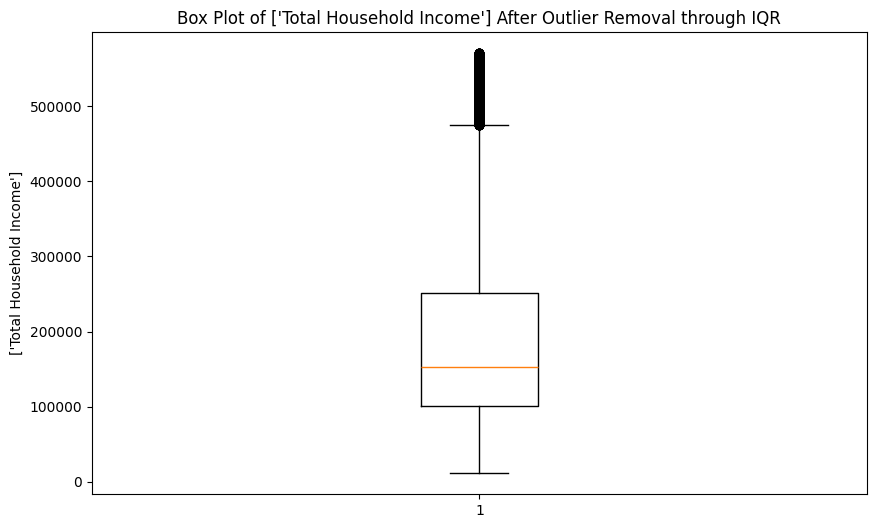

In [692]:
# Box Plot of the extracted non_outliers using matplotlib
plt.figure(figsize=(10, 6))
plt.boxplot(df_non_outliers_IQR[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} After Outlier Removal through IQR')
plt.ylabel(outlier_detection_column)
plt.show()

In [693]:
df_non_outliers_IQR['Total Household Income'].describe()

,Total Household Income
count,38393.000000
mean,189885.704556
std,120551.516456
min,11285.000000
25%,101150.000000
50%,153175.000000
75%,250795.000000
max,570492.000000


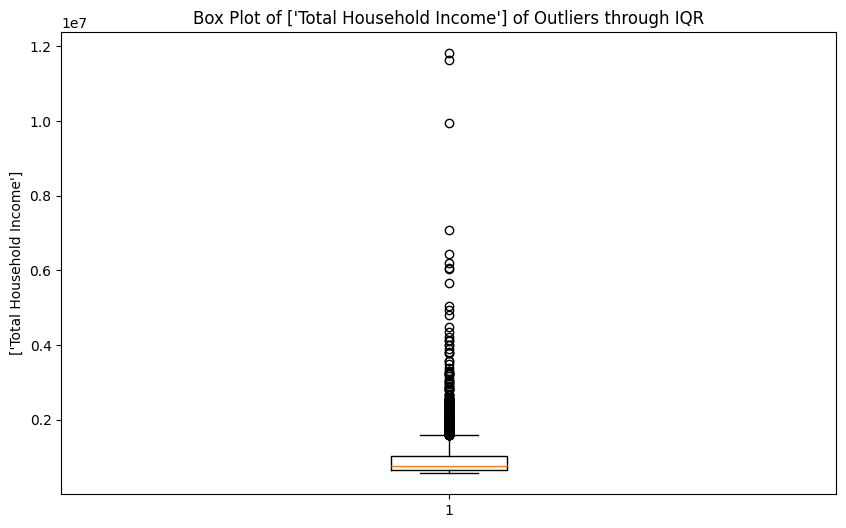

In [694]:
# Box Plot of the extracted outliers using matplotlib
plt.figure(figsize=(10, 6))
plt.boxplot(df_outliers_IQR[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} of Outliers through IQR')
plt.ylabel(outlier_detection_column)
plt.show()

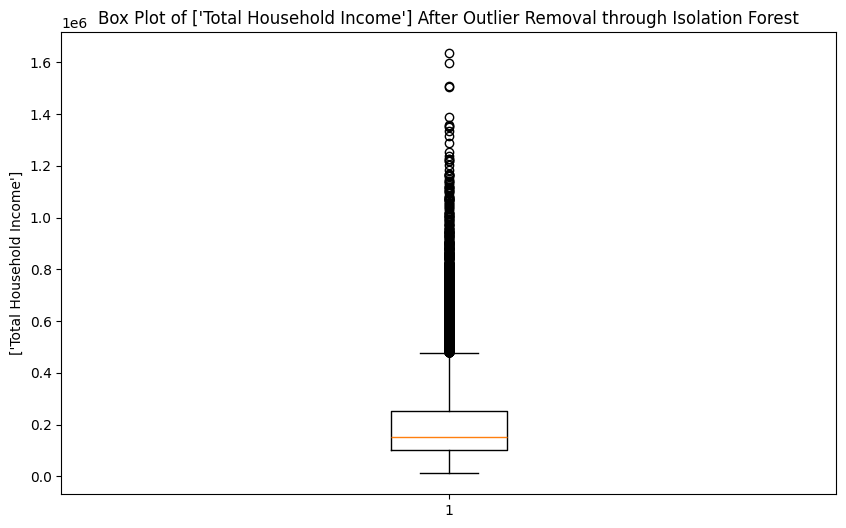

In [695]:
# Boxplot of Non_outliers detected in Isolation Forest
plt.figure(figsize=(10, 6))
plt.boxplot(df_non_outliers_iso_forest[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} After Outlier Removal through Isolation Forest')
plt.ylabel(outlier_detection_column)
plt.show()

In [696]:
df_non_outliers_iso_forest['Total Household Income'].describe()

,Total Household Income
count,3.738900e+04
mean,2.004304e+05
std,1.493268e+05
min,1.198800e+04
25%,1.016050e+05
50%,1.536200e+05
75%,2.524800e+05
max,1.634854e+06


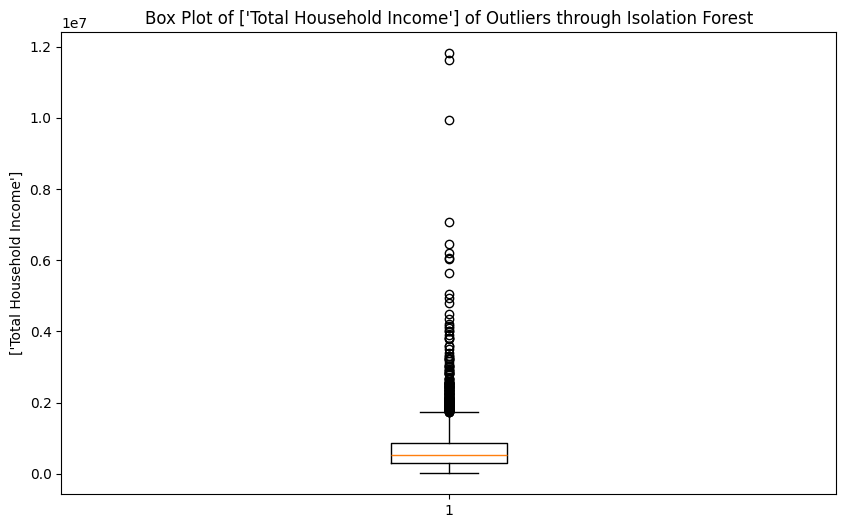

In [697]:
# Boxplot of Outliers detected in Isolation Forest
plt.figure(figsize=(10, 6))
plt.boxplot(df_outliers_iso_forest[outlier_detection_column])
plt.title(f'Box Plot of {outlier_detection_column} of Outliers through Isolation Forest')
plt.ylabel(outlier_detection_column)
plt.show()

> Key Insights from Outlier Detection
- IQR caps the income values to less than 600,000
- Isolation Forest has income values from 0 to 160,000
- IQR handles outlier better than Isolation Forest when it comes to covering more families from varying income levels that are not overly extreme.
- Final selected outlier removal step: IQR

## Data Scaling and Transformations

In [698]:
# Power Transform to Reduce Skewness
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')
df_orig[numerical_columns] = pt.fit_transform(df_orig[numerical_columns])
df_non_outliers_IQR[numerical_columns] = pt.fit_transform(df_non_outliers_IQR[numerical_columns])

In [699]:
# Scale numerical Features for clustering Analysis
scaler = StandardScaler()
# scaler = MinMaxScaler()
df_orig[numerical_columns] = scaler.fit_transform(df_orig[numerical_columns])
df_non_outliers_IQR[numerical_columns] = scaler.fit_transform(df_non_outliers_IQR[numerical_columns])

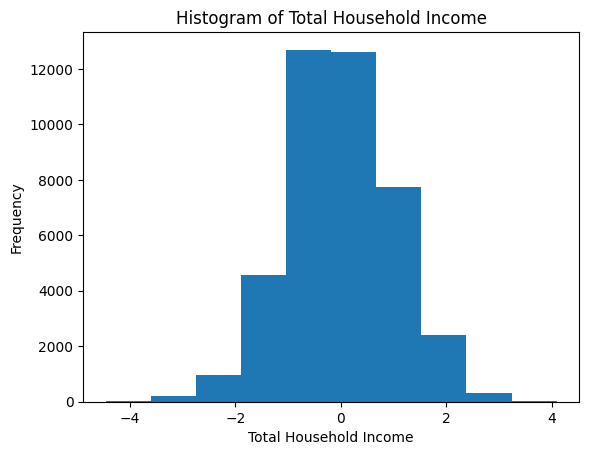

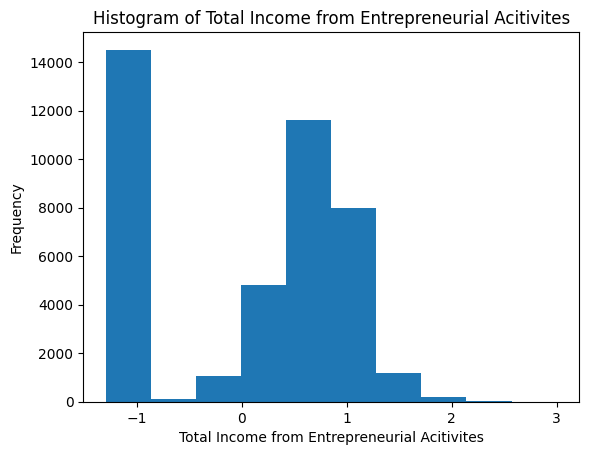

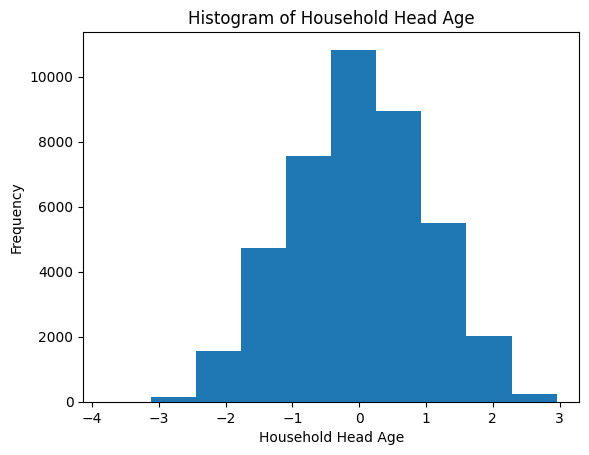

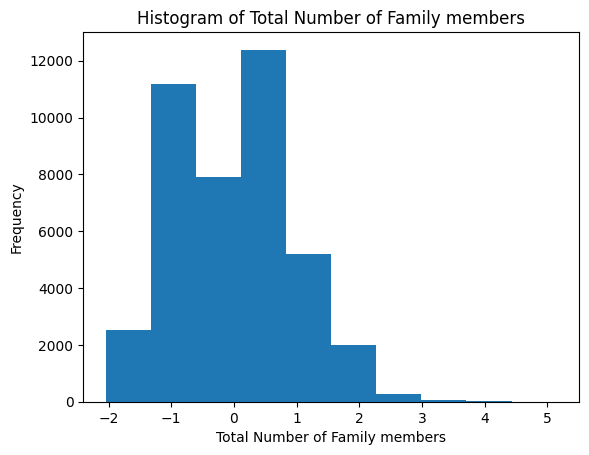

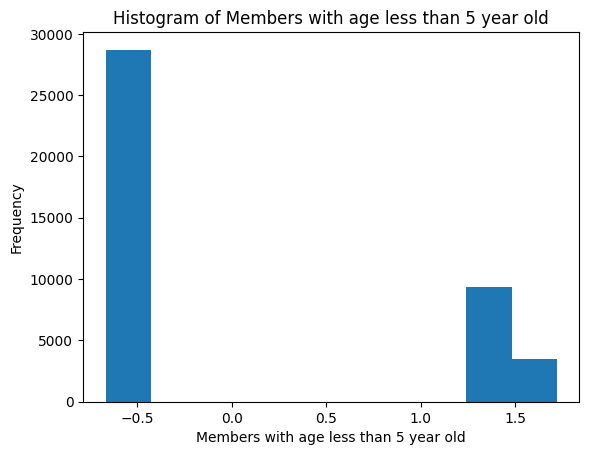

...

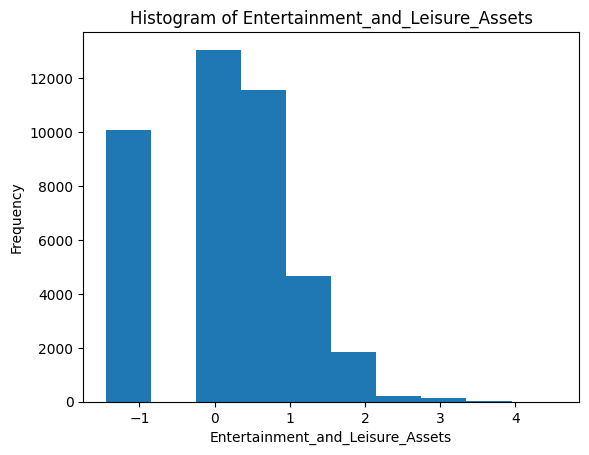

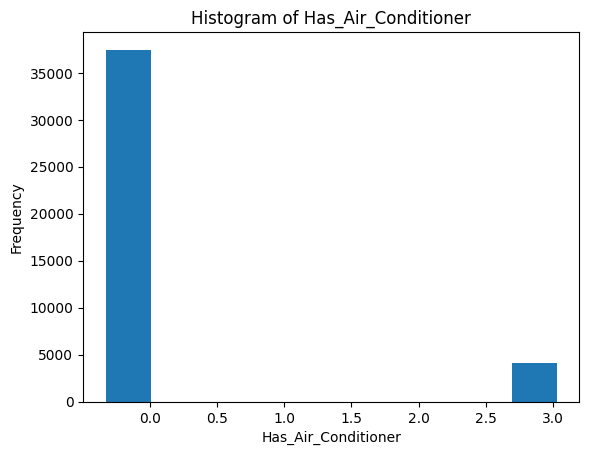

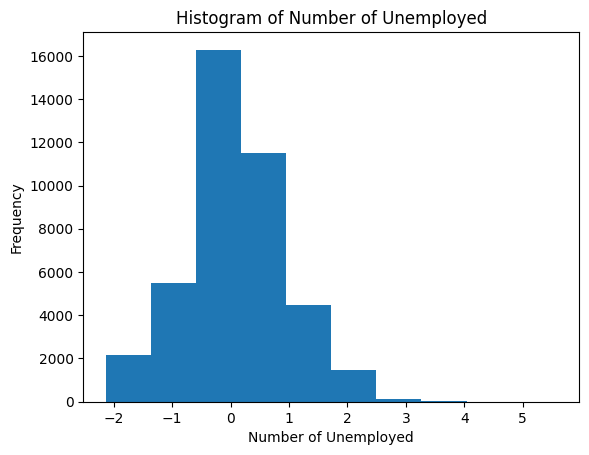

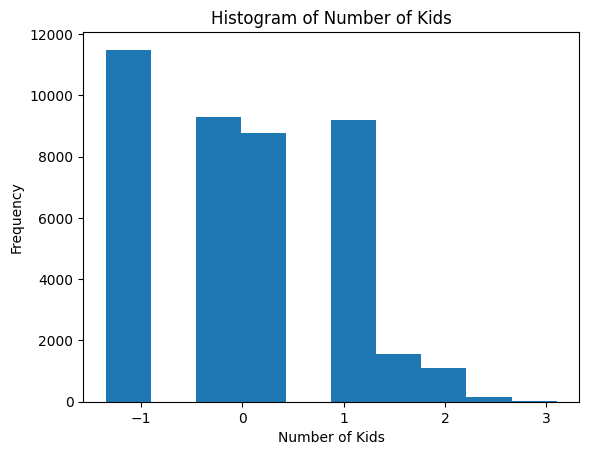

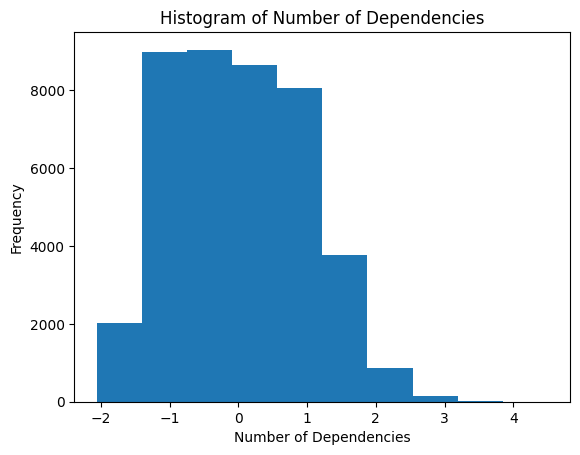

In [700]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_orig[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

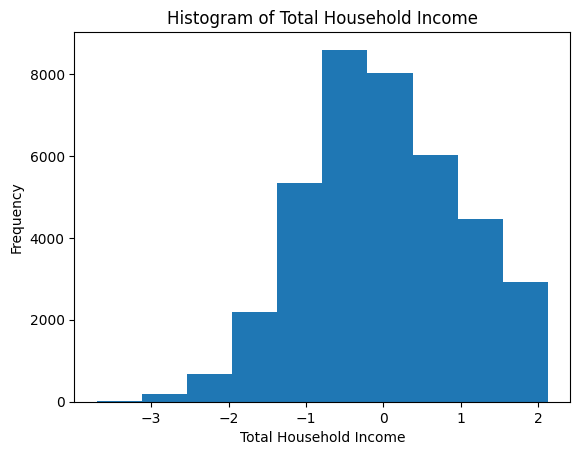

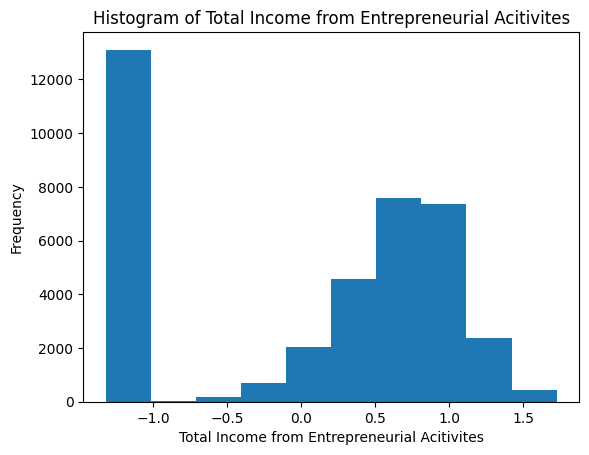

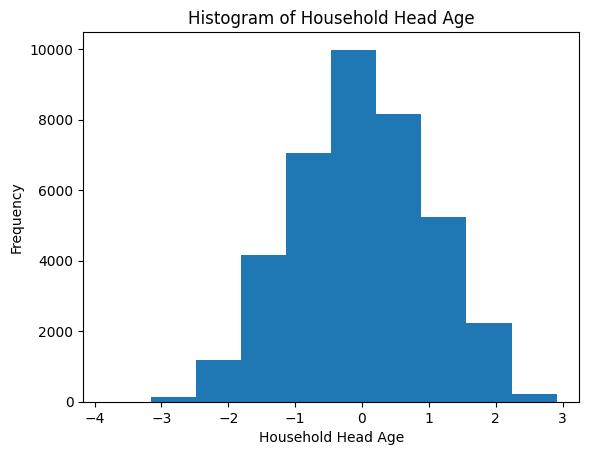

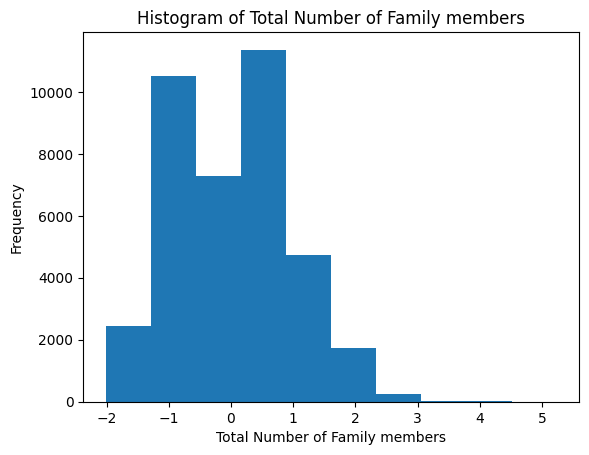

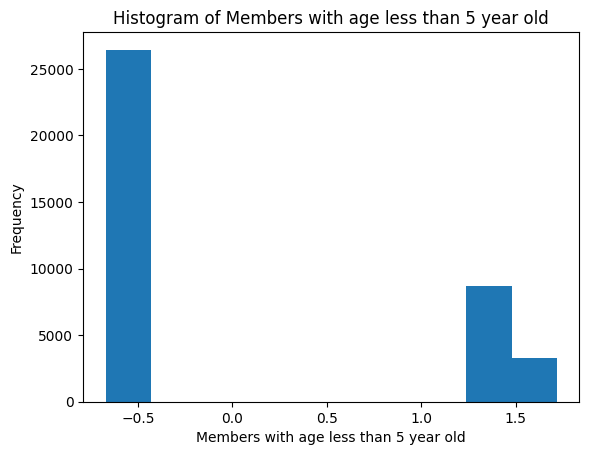

...

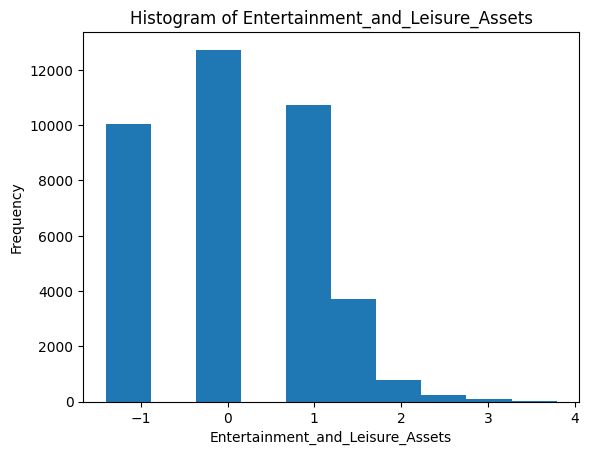

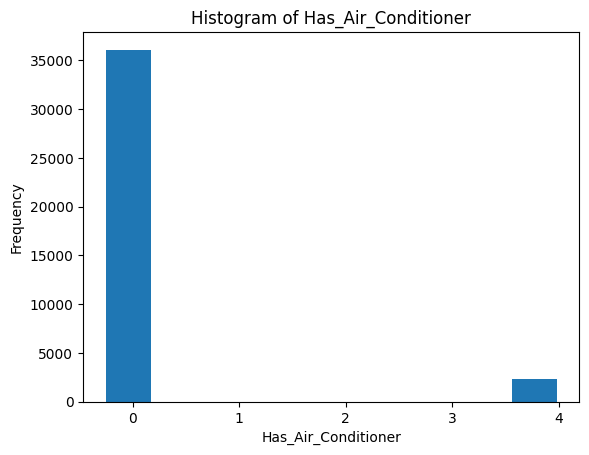

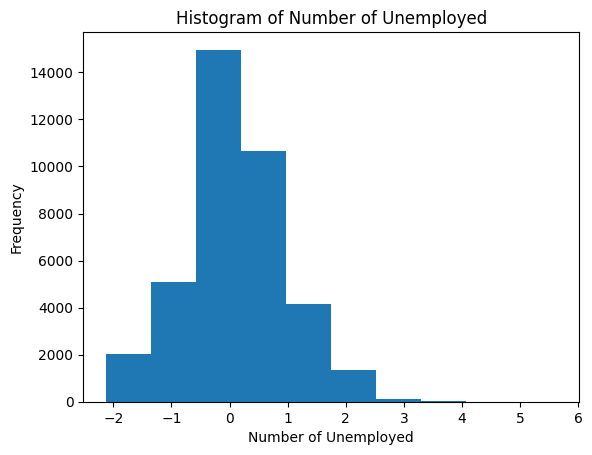

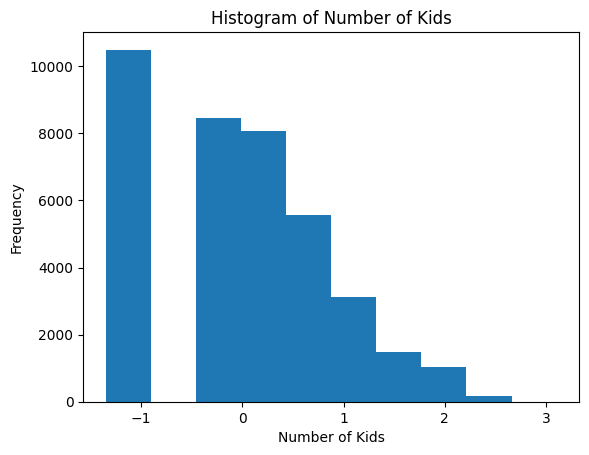

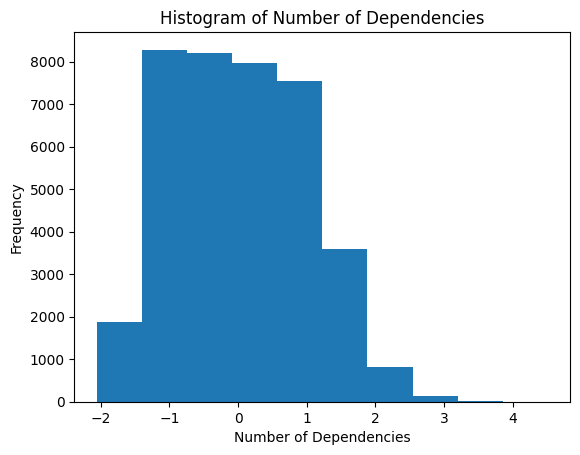

In [701]:
# Histogram for all Numerical Columns, individually
for col in numerical_columns:
    plt.hist(df_non_outliers_IQR[col])
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [702]:
categorical_columns

Index(['Region', 'Main Source of Income', 'Household Head Sex',
       'Household Head Marital Status',
       'Household Head Highest Grade Completed',
       'Household Head Job or Business Indicator', 'Household Head Occupation',
       'Household Head Class of Worker', 'Type of Household',
       'Type of Building/House', 'Type of Roof', 'Type of Walls',
       'Tenure Status', 'Toilet Facilities', 'Main Source of Water Supply'],
      dtype='object')

In [703]:
df_copy.columns

Index(['Total Household Income', 'Region', 'Agricultural Household indicator',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Household Head Marital Status',
       'Household Head Highest Grade Completed', 'Household Head Occupation',
       'Household Head Class of Worker', 'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
       'Total number of family members employed', 'Type of Building/House',
       'Type of Roof', 'Type of Walls', 'House Floor Area', 'House Age',
       'Number of bedrooms', 'Tenure Status', 'Toilet Facilities',
       'Electricity', 'Main Source of Water Supply', 'Number of Television',
       'Number of CD/VCD/DVD', 'Number of Component/Stereo set',
       'Number of Refrigerator/Freezer', 'Number of Washing Machine',
       'Number of Airconditioner', 'Number of Car, Jeep, Van',
       'Number of Landline/wireless telephones', 'Number of Cellular

In [704]:
# Fetch feature engineered cat columns. Include Binary Indicators
feature_engineered_cat_columns = ['Household Head Highest Grade Completed', 'Type of Roof', 'Type of Walls',
       'Tenure Status', 'Toilet Facilities', 'Main Source of Water Supply', 'Self_Employed',
      'Is_Consuming_Alcohol', 'Is_Tobacco_User', 'Have_Kids_in_School',
       'Is_Spending_For_Occasions', 'Is_Farmer', 'Saves_Money',
       'Is_Spending_Above_Income']

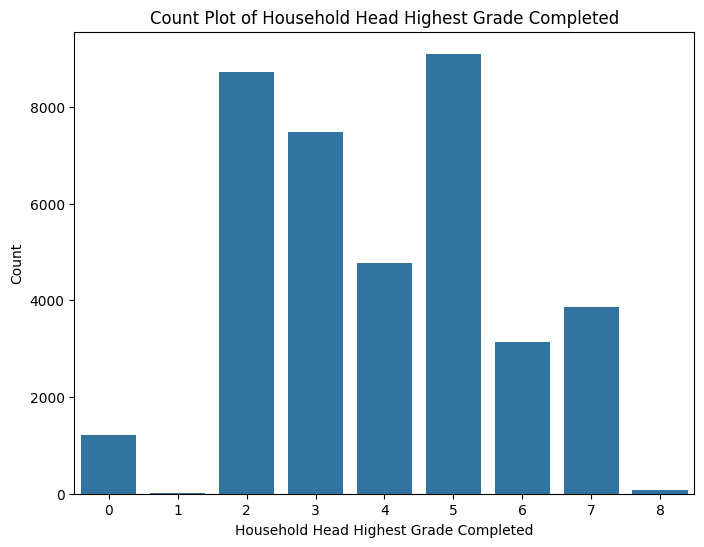

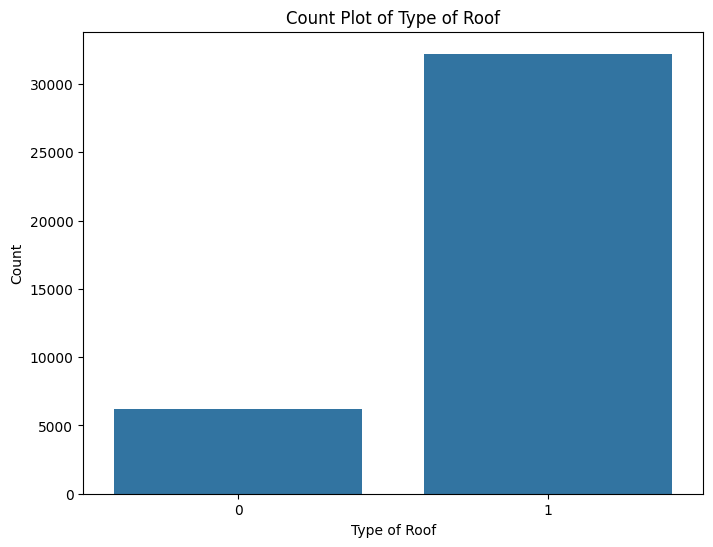

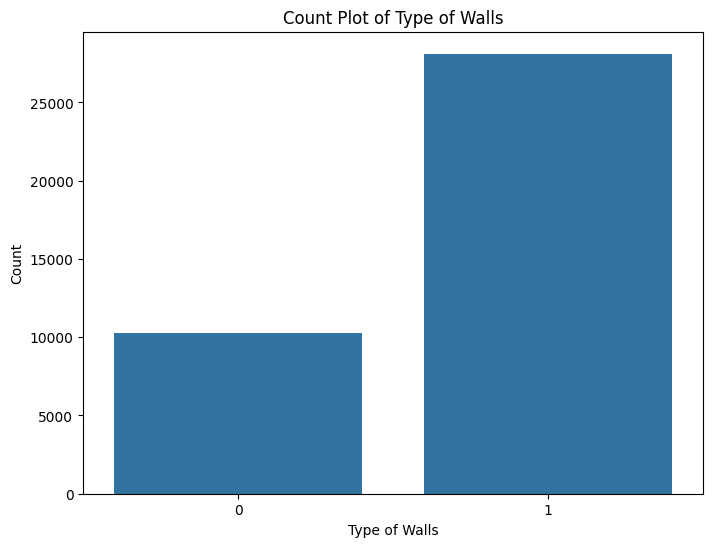

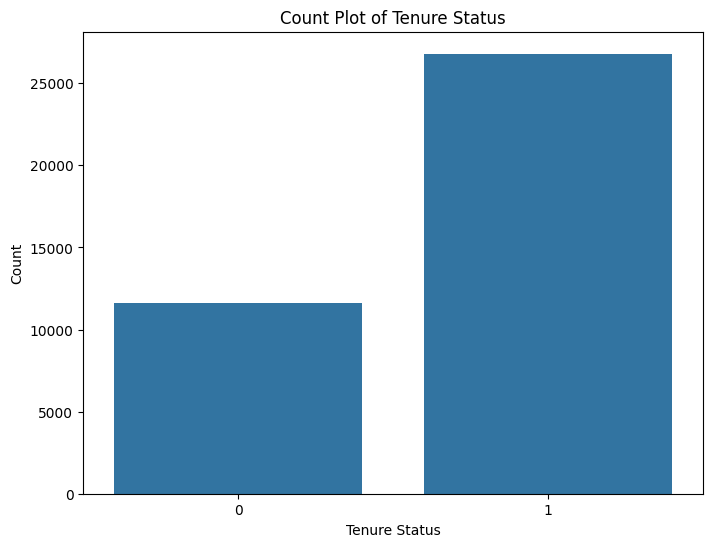

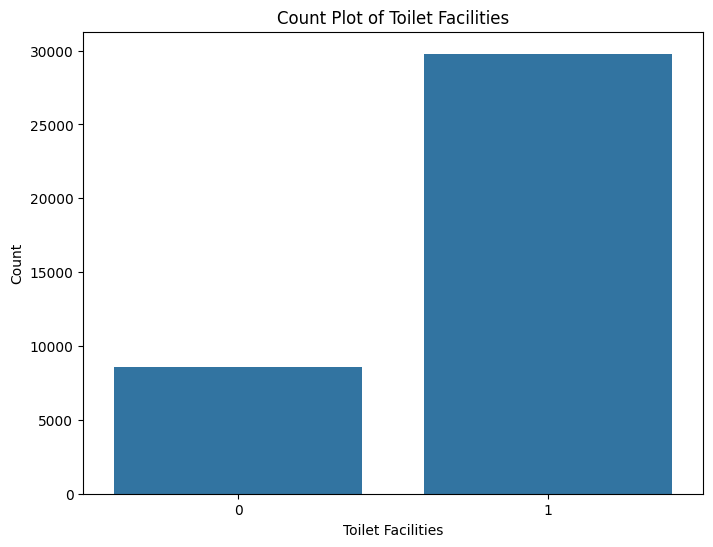

...

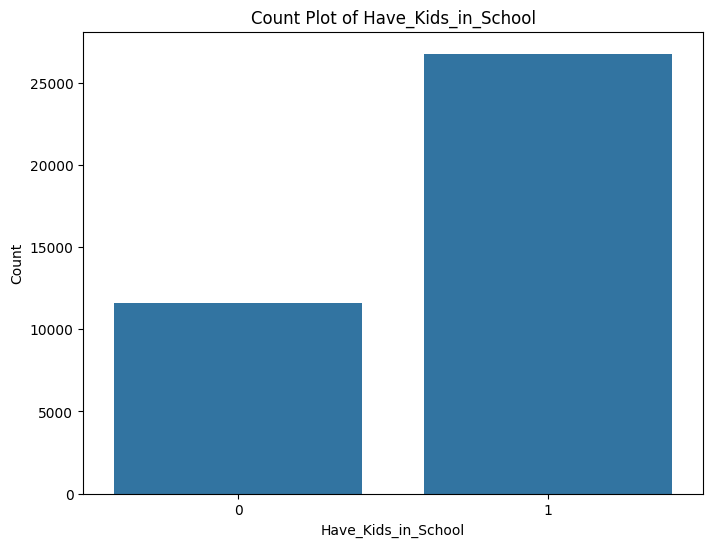

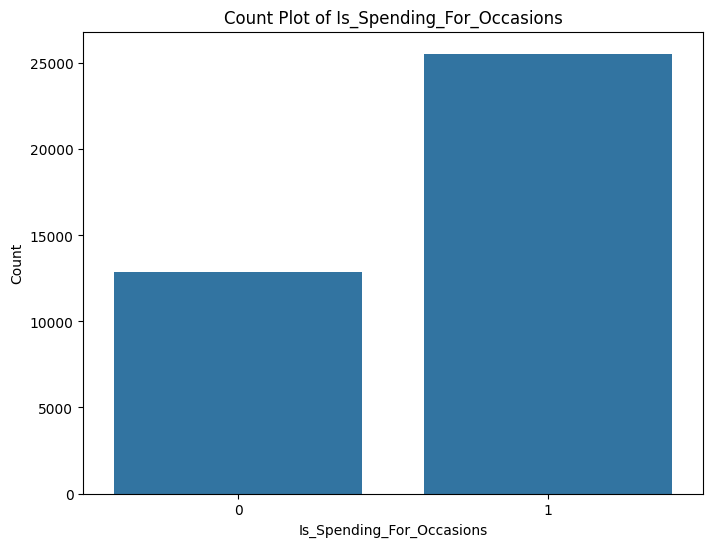

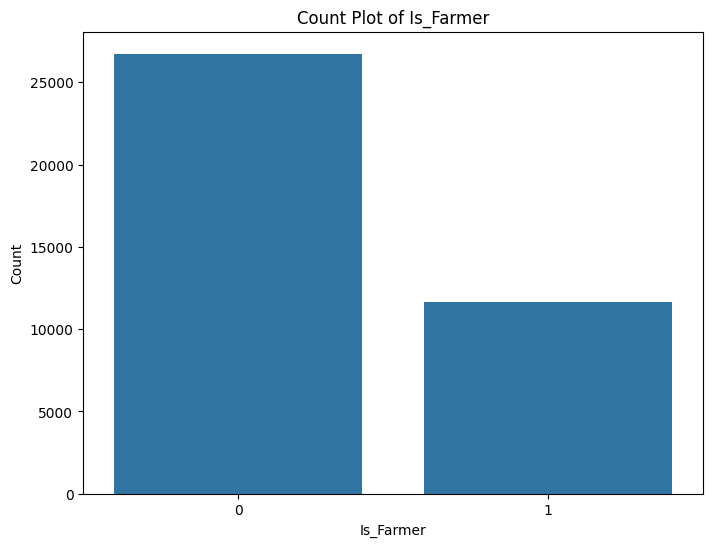

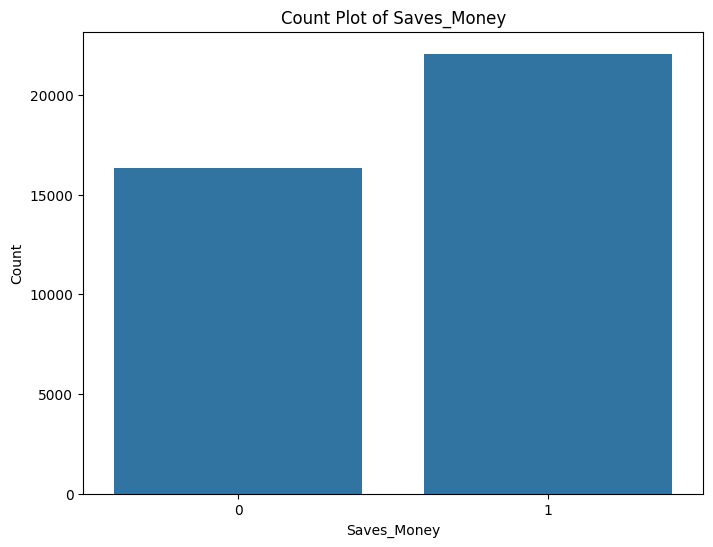

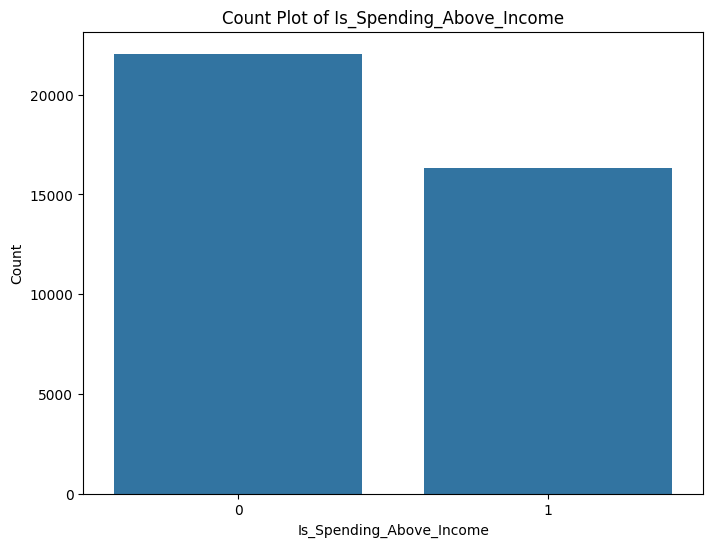

In [705]:
for col in feature_engineered_cat_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(data=df_non_outliers_IQR, x=col)
    plt.title(f'Count Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')



> Key Insights after Feature Engineering
- Skew from some numerical columns have been transformed.
- Some numerical columns have no clear distribution or are Zero-inflated despite Yeo-Johnson Transformation. Included Categorical Binning in Feature Engineering
- Toilet Facilities, Tenure Status, Type of Walls, Type of Roof, and Main Source of Water Supply have one or two defining features that overwhelm their counterparts. Binned to a general group but could possibly be omitted


# Automated Feature Selection

Original Number of Features = 60

Original Expenditure Features = 20

Original Income Features = 2

In [706]:
selected_features_rfevc = []
selected_features_mutual_info = []
selected_features_skb = []
number_of_features_to_check = []

In [707]:
X = df_orig.drop('Total Household Income', axis=1)
y = df_orig['Total Household Income']
X_IQR = df_non_outliers_IQR.drop('Total Household Income', axis=1)
y_IQR = df_non_outliers_IQR['Total Household Income']

In [708]:
# Use Regression Model for Feature Selection
def rfevc_features_selected(X, y, features_to_select):
  print(f'Test DF')
  min_features_to_select = features_to_select  # Minimum number of features to consider
  for i in range(0, 2):
    clf = Ridge()
    cv = KFold(5) # Changed to KFold which is suitable for regression

    rfecv = RFECV(
        estimator=clf,
        step=1,
        cv=cv,
        scoring="neg_mean_squared_error", # Changed scoring metric to a suitable one for Regression
        min_features_to_select=min_features_to_select,
        n_jobs=2,
    )
    rfecv.fit(X, y)
    selected_inc_features = X.columns[rfecv.support_]
    selected_features_rfevc.append(selected_inc_features)
    print(f"Optimal number of features: {rfecv.n_features_}")
    number_of_features_to_check.append(rfecv.n_features_)
    min_features_to_select = rfecv.n_features_ + 1
  print('- ' * 20)

In [709]:
rfevc_features_selected(X, y, 5)
rfevc_features_selected(X_IQR, y_IQR, 5)

Test DF
Optimal number of features: 84
Optimal number of features: 85
- - - - - - - - - - - - - - - - - - - - 
Test DF
Optimal number of features: 86
Optimal number of features: 87
- - - - - - - - - - - - - - - - - - - - 


In [710]:
number_of_features_to_check

[84, 85, 86, 87]

In [711]:
def mutual_info_features_selected(X, y, number_of_features):
  print(f"Number of Features to Check: {number_of_features}")
  threshold = number_of_features  # the number of most relevant features
  high_score_features = []
  feature_scores = mutual_info_regression(X, y, random_state=0)
  for score, f_name in sorted(zip(feature_scores, X.columns), reverse=True)[:threshold]:
    high_score_features.append(f_name)
  selected_df = X[high_score_features]
  selected_features_mutual_info.append(selected_df.columns)

In [712]:
print('Original Data')
mutual_info_features_selected(X, y, number_of_features_to_check[0])
mutual_info_features_selected(X, y, number_of_features_to_check[1])
print("- " * 20)
print('Non-Outlier Data - IQR')
mutual_info_features_selected(X_IQR, y_IQR, number_of_features_to_check[2])
mutual_info_features_selected(X_IQR, y_IQR, number_of_features_to_check[3])
print("- " * 20)

Original Data
Number of Features to Check: 84
Number of Features to Check: 85
- - - - - - - - - - - - - - - - - - - - 
Non-Outlier Data - IQR
Number of Features to Check: 86
Number of Features to Check: 87
- - - - - - - - - - - - - - - - - - - - 


In [713]:
def skb_features_selected(X, y, number_of_features):
  threshold = number_of_features  # the number of most relevant features
  skb = SelectKBest(score_func=f_regression, k=threshold)
  sel_skb = skb.fit(X, y)
  sel_skb_index = sel_skb.get_support()
  selected_df = X.iloc[:, sel_skb_index]
  selected_features_skb.append(selected_df.columns)

In [714]:
print('Original Data')
skb_features_selected(X, y, number_of_features_to_check[0])
skb_features_selected(X, y, number_of_features_to_check[1])
print("- " * 20)
print('Non-Outlier Data - IQR')
skb_features_selected(X_IQR, y_IQR, number_of_features_to_check[2])
skb_features_selected(X_IQR, y_IQR, number_of_features_to_check[3])
print("- " * 20)

Original Data
- - - - - - - - - - - - - - - - - - - - 
Non-Outlier Data - IQR
- - - - - - - - - - - - - - - - - - - - 


In [715]:
# Check for intersection of columns extracted for rfevc, skb, and mutual_info
print(set(selected_features_rfevc[0]) & set(selected_features_skb[0]) & set(selected_features_mutual_info[0]))

{'Other Bread and Cereals Ratio', 'Members with age 5 - 17 years old', 'NonEssential_Spending_Ratio', 'Tobacco Ratio', 'Special Occasions Ratio', 'Alcoholic Beverages Ratio', 'Number of Airconditioner', 'House Age', 'Entertainment_and_Leisure_Assets', 'Type of Walls', 'Total Number of Family members', 'Education Ratio', 'Type of Household_Single Family', 'Crop Farming and Gardening Ratio', 'Is_Spending_For_Occasions', 'Is_Farmer', 'Meat Ratio', 'Number of Landline/wireless telephones', 'Household Head Class of Worker', 'Per Capita Expenditure', 'Number of Television', 'Remaining_Income', 'Total number of family members employed', 'Toilet Facilities', 'Amount_Outside_Income', 'Number of Stove with Oven/Gas Range', 'Fish Ratio', 'Tenure Status', 'Main Source of Income_Other sources of Income', 'Is_Tobacco_User', 'Household Head Age', 'Number of Personal Computer', 'Household Head Marital Status', 'Number of CD/VCD/DVD', 'Members with age less than 5 year old', 'House Floor Area', 'Restau

In [716]:
common_features_rfevc_skb_mutual_info = []

In [717]:
for i in range(len(selected_features_rfevc)):
  print(set(selected_features_rfevc[i]) & set(selected_features_skb[i]) & set(selected_features_mutual_info[i]))
  common_features_rfevc_skb_mutual_info.append(set(selected_features_rfevc[i]) & set(selected_features_skb[i]) & set(selected_features_mutual_info[i]))

{'Other Bread and Cereals Ratio', 'Members with age 5 - 17 years old', 'NonEssential_Spending_Ratio', 'Tobacco Ratio', 'Special Occasions Ratio', 'Alcoholic Beverages Ratio', 'Number of Airconditioner', 'House Age', 'Entertainment_and_Leisure_Assets', 'Type of Walls', 'Total Number of Family members', 'Education Ratio', 'Type of Household_Single Family', 'Crop Farming and Gardening Ratio', 'Is_Spending_For_Occasions', 'Is_Farmer', 'Meat Ratio', 'Number of Landline/wireless telephones', 'Household Head Class of Worker', 'Per Capita Expenditure', 'Number of Television', 'Remaining_Income', 'Total number of family members employed', 'Toilet Facilities', 'Amount_Outside_Income', 'Number of Stove with Oven/Gas Range', 'Fish Ratio', 'Tenure Status', 'Main Source of Income_Other sources of Income', 'Is_Tobacco_User', 'Household Head Age', 'Number of Personal Computer', 'Household Head Marital Status', 'Number of CD/VCD/DVD', 'Members with age less than 5 year old', 'House Floor Area', 'Restau

In [718]:
# Check number of features per intersecting sets
for i in range(len(common_features_rfevc_skb_mutual_info)):
  print(len(common_features_rfevc_skb_mutual_info[i]))

80
82
84
87


In [719]:
df_orig_feature_rfevc_lessFeatures = df_orig[list(selected_features_rfevc[0])]
df_orig_feature_skb_lessFeatures = df_orig[list(selected_features_skb[0])]
df_orig_feature_mutual_info_lessFeatures = df_orig[list(selected_features_mutual_info[0])]

df_non_outliers_IQR_feature_rfevc_lessFeatures = df_non_outliers_IQR[list(selected_features_rfevc[2])]
df_non_outliers_IQR_feature_skb_lessFeatures = df_non_outliers_IQR[list(selected_features_skb[2])]
df_non_outliers_IQR_feature_mutual_info_lessFeatures = df_non_outliers_IQR[list(selected_features_mutual_info[2])]

In [720]:
number_of_features_to_check

[84, 85, 86, 87]

In [721]:
df_orig_feature_rfevc_moreFeatures = df_orig[list(selected_features_rfevc[1])]
df_orig_feature_skb_moreFeatures = df_orig[list(selected_features_skb[1])]
df_orig_feature_mutual_info_moreFeatures = df_orig[list(selected_features_mutual_info[1])]

df_non_outliers_IQR_feature_rfevc_moreFeatures = df_non_outliers_IQR[list(selected_features_rfevc[3])]
df_non_outliers_IQR_feature_skb_moreFeatures = df_non_outliers_IQR[list(selected_features_skb[3])]
df_non_outliers_IQR_feature_mutual_info_moreFeatures = df_non_outliers_IQR[list(selected_features_mutual_info[3])]

In [722]:
# Check number of features per intersecting sets
for i in range(len(common_features_rfevc_skb_mutual_info)):
  print(len(common_features_rfevc_skb_mutual_info[i]))

80
82
84
87


In [723]:
df_orig_combined_lessFeatures = df_orig[list(common_features_rfevc_skb_mutual_info[0])]
df_orig_combined_moreFeatures = df_orig[list(common_features_rfevc_skb_mutual_info[1])]

df_non_outliers_IQR_combined_lessFeatures = df_non_outliers_IQR[list(common_features_rfevc_skb_mutual_info[2])]
df_non_outliers_IQR_combined_moreFeatures = df_non_outliers_IQR[list(common_features_rfevc_skb_mutual_info[3])]

# Manual Feature Selection

If following the research questions, I would want to omit features that have no relation with answering the questions.

1. Income
  - Retain All Income Columns

2. Expenditure
  - Keep All Expenditure Columns

3. Living Situation
  - Remove Type of House/Building
  - Try to omit Roof, Walls, Tenure Status, Toilet Facilities, Electricity, and Main Source of Water Supply and check if they affect clustering.

4. Family Composition
  - Remove Members with age < 5 and 5-17
  - Remove Number of Kids and Unemployed
  - Keep Number of Dependencies
  - Remove Household Head Sex_Male as it is predominantly Male

5. Assets
  - Remove Individual Assets
  - Keep Engineered Assets

In [724]:
df_orig.columns

Index(['Total Household Income', 'Region', 'Agricultural Household indicator',
       'Total Income from Entrepreneurial Acitivites', 'Household Head Age',
       'Household Head Marital Status',
       'Household Head Highest Grade Completed', 'Household Head Occupation',
       'Household Head Class of Worker', 'Total Number of Family members',
       'Members with age less than 5 year old',
       'Members with age 5 - 17 years old',
       'Total number of family members employed', 'Type of Building/House',
       'Type of Roof', 'Type of Walls', 'House Floor Area', 'House Age',
       'Number of bedrooms', 'Tenure Status', 'Toilet Facilities',
       'Electricity', 'Main Source of Water Supply', 'Number of Television',
       'Number of CD/VCD/DVD', 'Number of Component/Stereo set',
       'Number of Refrigerator/Freezer', 'Number of Washing Machine',
       'Number of Airconditioner', 'Number of Car, Jeep, Van',
       'Number of Landline/wireless telephones', 'Number of Cellular

In [725]:
'''
Columns to Manually Drop:
['Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Food Expenditure',
'Type of Building/House', 'Household Head Age',
'Members with age less than 5 year old', 'Members with age 5 - 17 years old',
'Number of Television', 'Number of CD/VCD/DVD', 'Number of Component/Stereo set', 'Number of Refrigerator/Freezer', 'Number of Washing Machine',
'Number of Airconditioner', 'Number of Car, Jeep, Van', 'Number of Landline/wireless telephones', 'Number of Cellular phone',
'Number of Personal Computer', 'Number of Stove with Oven/Gas Range', 'Number of Motorized Banca', 'Number of Motorcycle/Tricycle', 'Number of bedrooms',
'Household Head Sex_Male', 'Total Expenditure']'''

"\nColumns to Manually Drop:\n['Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Food Expenditure',\n'Type of Building/House', 'Household Head Age',\n'Members with age less than 5 year old', 'Members with age 5 - 17 years old',\n'Number of Television', 'Number of CD/VCD/DVD', 'Number of Component/Stereo set', 'Number of Refrigerator/Freezer', 'Number of Washing Machine',\n'Number of Airconditioner', 'Number of Car, Jeep, Van', 'Number of Landline/wireless telephones', 'Number of Cellular phone',\n'Number of Personal Computer', 'Number of Stove with Oven/Gas Range', 'Number of Motorized Banca', 'Number of Motorcycle/Tricycle', 'Number of bedrooms',\n'Household Head Sex_Male', 'Total Expenditure']"

In [743]:
df_orig_manual = df_orig.drop(columns=['Type of Building/House', 'House Age',
'Members with age less than 5 year old', 'Members with age 5 - 17 years old',
'Number of Television', 'Number of CD/VCD/DVD', 'Number of Component/Stereo set', 'Number of Refrigerator/Freezer', 'Number of Washing Machine',
'Number of Airconditioner', 'Number of Car, Jeep, Van', 'Number of Landline/wireless telephones', 'Number of Cellular phone',
'Number of Personal Computer', 'Number of Stove with Oven/Gas Range', 'Number of Motorized Banca', 'Number of Motorcycle/Tricycle', 'Number of bedrooms',
'Household Head Sex_Male', 'Number of Unemployed', 'Number of Kids', 'Total number of family members employed', 'Type of Building/House',
       'Type of Roof', 'Type of Walls', 'House Floor Area', 'House Age',])

In [744]:
df_non_outliers_IQR_manual = df_non_outliers_IQR.drop(columns=[
'Type of Building/House', 'House Age', 'Household Head Age',
'Members with age less than 5 year old', 'Members with age 5 - 17 years old',
'Number of Television', 'Number of CD/VCD/DVD', 'Number of Component/Stereo set', 'Number of Refrigerator/Freezer', 'Number of Washing Machine',
'Number of Airconditioner', 'Number of Car, Jeep, Van', 'Number of Landline/wireless telephones', 'Number of Cellular phone',
'Number of Personal Computer', 'Number of Stove with Oven/Gas Range', 'Number of Motorized Banca', 'Number of Motorcycle/Tricycle', 'Number of bedrooms',
'Household Head Sex_Male', 'Number of Unemployed', 'Number of Kids', 'Total number of family members employed', 'Type of Building/House',
       'Type of Roof', 'Type of Walls', 'House Floor Area', 'House Age',])

In [745]:
df_non_outliers_IQR_manual.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38393 entries, 0 to 38392
Data columns (total 62 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Total Household Income                                      38393 non-null  float64
 1   Region                                                      38393 non-null  int64  
 2   Agricultural Household indicator                            38393 non-null  int64  
 3   Total Income from Entrepreneurial Acitivites                38393 non-null  float64
 4   Household Head Marital Status                               38393 non-null  int64  
 5   Household Head Highest Grade Completed                      38393 non-null  int64  
 6   Household Head Occupation                                   38393 non-null  int64  
 7   Household Head Class of Worker                              38393 non-null  int64  
 

In [746]:
number_of_features_to_check

[84, 85, 86, 87]

In [747]:
df_list_no_pca = [df_orig, df_non_outliers_IQR,
                  df_orig_manual, df_non_outliers_IQR_manual,
                  df_orig_feature_rfevc_lessFeatures, df_orig_feature_skb_lessFeatures, df_orig_feature_mutual_info_lessFeatures,
                  df_non_outliers_IQR_feature_rfevc_lessFeatures, df_non_outliers_IQR_feature_skb_lessFeatures, df_non_outliers_IQR_feature_mutual_info_lessFeatures,
                  df_orig_feature_rfevc_moreFeatures, df_orig_feature_skb_moreFeatures, df_orig_feature_mutual_info_moreFeatures,
                  df_non_outliers_IQR_feature_rfevc_moreFeatures, df_non_outliers_IQR_feature_skb_moreFeatures, df_non_outliers_IQR_feature_mutual_info_moreFeatures,
                  df_orig_combined_lessFeatures, df_orig_combined_moreFeatures,
                  df_non_outliers_IQR_combined_lessFeatures, df_non_outliers_IQR_combined_moreFeatures]


In [748]:
df_orig_pca = df_orig.copy()
df_non_outliers_IQR_pca = df_non_outliers_IQR.copy()
df_orig_manual_pca = df_orig_manual.copy()
df_non_outliers_IQR_manual_pca = df_non_outliers_IQR_manual.copy()
df_orig_feature_rfevc_lessFeatures_pca = df_orig_feature_rfevc_lessFeatures.copy()
df_orig_feature_skb_lessFeatures_pca = df_orig_feature_skb_lessFeatures.copy()
df_orig_feature_mutual_info_lessFeatures_pca = df_orig_feature_mutual_info_lessFeatures.copy()
df_non_outliers_IQR_feature_rfevc_lessFeatures_pca = df_non_outliers_IQR_feature_rfevc_lessFeatures.copy()
df_non_outliers_IQR_feature_skb_lessFeatures_pca = df_non_outliers_IQR_feature_skb_lessFeatures.copy()
df_non_outliers_IQR_feature_mutual_info_lessFeatures_pca = df_non_outliers_IQR_feature_mutual_info_lessFeatures.copy()
df_orig_feature_rfevc_moreFeatures_pca = df_orig_feature_rfevc_moreFeatures.copy()
df_orig_feature_skb_moreFeatures_pca = df_orig_feature_skb_moreFeatures.copy()
df_orig_feature_mutual_info_moreFeatures_pca = df_orig_feature_mutual_info_moreFeatures.copy()
df_non_outliers_IQR_feature_rfevc_moreFeatures_pca = df_non_outliers_IQR_feature_rfevc_moreFeatures.copy()
df_non_outliers_IQR_feature_skb_moreFeatures_pca = df_non_outliers_IQR_feature_skb_moreFeatures.copy()
df_non_outliers_IQR_feature_mutual_info_moreFeatures_pca = df_non_outliers_IQR_feature_mutual_info_moreFeatures.copy()
df_orig_combined_lessFeatures_pca = df_orig_combined_lessFeatures.copy()
df_orig_combined_moreFeatures_pca = df_orig_combined_moreFeatures.copy()
df_non_outliers_IQR_combined_lessFeatures_pca = df_non_outliers_IQR_combined_lessFeatures.copy()
df_non_outliers_IQR_combined_moreFeatures_pca = df_non_outliers_IQR_combined_moreFeatures.copy()

In [749]:
df_list_with_pca = [df_orig_pca, df_non_outliers_IQR_pca,
                  df_orig_manual_pca, df_non_outliers_IQR_manual_pca,
                  df_orig_feature_rfevc_lessFeatures_pca, df_orig_feature_skb_lessFeatures_pca, df_orig_feature_mutual_info_lessFeatures_pca,
                  df_non_outliers_IQR_feature_rfevc_lessFeatures_pca, df_non_outliers_IQR_feature_skb_lessFeatures_pca, df_non_outliers_IQR_feature_mutual_info_lessFeatures_pca,
                  df_orig_feature_rfevc_moreFeatures_pca, df_orig_feature_skb_moreFeatures_pca, df_orig_feature_mutual_info_moreFeatures_pca,
                  df_non_outliers_IQR_feature_rfevc_moreFeatures_pca, df_non_outliers_IQR_feature_skb_moreFeatures_pca, df_non_outliers_IQR_feature_mutual_info_moreFeatures_pca,
                  df_orig_combined_lessFeatures_pca, df_orig_combined_moreFeatures_pca,
                  df_non_outliers_IQR_combined_lessFeatures_pca, df_non_outliers_IQR_combined_moreFeatures_pca,]

In [750]:
len(df_list_no_pca)

20

In [751]:
len(df_list_with_pca)

20

# Dimensionality Reduction

In [741]:
# Use PCA
from sklearn.decomposition import PCA

def conduct_PCA(df, index_of_df):
  print(f"PCA for DataFrame at {index_of_df}")
  pca = PCA(n_components=df.shape[1])
  df_pca = pca.fit_transform(df)
  cumsum = np.cumsum(pca.explained_variance_ratio_)
  print(cumsum)
  d = np.argmax(cumsum >= 0.90) + 1
  print("dimension : ", d)

  explained_variance = pca.explained_variance_ratio_
  cumulative_variance = np.cumsum(explained_variance)
  plt.plot(range(1, len(explained_variance) + 1), cumulative_variance)
  plt.xlabel('Number of Components')
  plt.ylabel('Cumulative Explained Variance')
  plt.title(f'Scree Plot for DataFrame at {index_of_df}')
  plt.show()

  #If d = 1 and cumulative_variance > 90, train final PCA with 2, else if cumulative variance < 90, use d
  if d == 1 and cumulative_variance[-1] > 0.90:
    pca = PCA(n_components=2)
  elif cumulative_variance[-1] < 0.90:
    pca = PCA(n_components=24)
  else:
    pca = PCA(n_components=d)
  df_pca = pca.fit_transform(df)
  df_list_with_pca[index_of_df] = df_pca

PCA for DataFrame at 0
[0.21509328 0.3639667  0.45575673 0.51470154 0.55853731 0.59428837
 0.61871212 0.64006413 0.657588   0.67334143 0.68857672 0.70325108
 0.71723422 0.731116   0.74422698 0.75573729 0.76643183 0.77686201
 0.78715478 0.79700929 0.80598934 0.81472465 0.82319162 0.8315823
 0.83957845 0.84738263 0.85504233 0.86249504 0.86957886 0.87648373
 0.88317435 0.88970708 0.89602718 0.90219339 0.90808756 0.9139023
 0.91924395 0.92451808 0.92970078 0.93458011 0.93939033 0.94402873
 0.94838461 0.95256215 0.95667404 0.96062638 0.96432899 0.96797729
 0.97100726 0.97364676 0.97620109 0.97861641 0.9807194  0.98272216
 0.98450796 0.98614696 0.98761047 0.98900517 0.99018434 0.9912745
 0.9922013  0.99306415 0.99379472 0.99451543 0.99514651 0.99574821
 0.99633083 0.99685235 0.99733065 0.99774158 0.99811805 0.99848473
 0.998844   0.99907953 0.99928248 0.99944216 0.99958615 0.99970047
 0.99978924 0.99986686 0.99992203 0.99996093 0.99997755 0.99999177
 0.99999923 0.99999988 1.         1.      

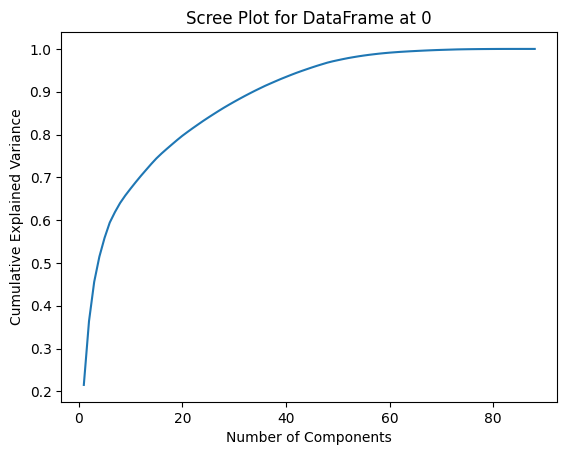

PCA for DataFrame at 1
[0.21955268 0.34562065 0.4381333  0.49906322 0.545094   0.58065196
 0.60541943 0.6271081  0.64503093 0.66136835 0.67711086 0.69230621
 0.70680477 0.72097921 0.73452084 0.74623911 0.75740563 0.76809163
 0.77863875 0.78866007 0.79800724 0.80701436 0.81573682 0.82426125
 0.83270975 0.84098366 0.84911816 0.85709342 0.86463236 0.87194122
 0.8790994  0.8861606  0.89275202 0.89913127 0.90545134 0.91138913
 0.91709749 0.9225188  0.92788156 0.93299038 0.93804255 0.94296022
 0.94760963 0.95196805 0.95611767 0.96010821 0.96399678 0.96756294
 0.9706657  0.97332836 0.97587465 0.97831912 0.98051624 0.98249077
 0.98437146 0.98606881 0.9875275  0.9889632  0.99021203 0.99132486
 0.99223314 0.99307529 0.99380388 0.99451412 0.99518932 0.99582186
 0.99641643 0.99695719 0.99745354 0.99792588 0.99831962 0.99867712
 0.99891398 0.99913783 0.99932968 0.99949398 0.99961365 0.99972794
 0.99982466 0.99989314 0.99992986 0.99996499 0.99997972 0.99999066
 0.99999918 0.99999987 1.         1.   

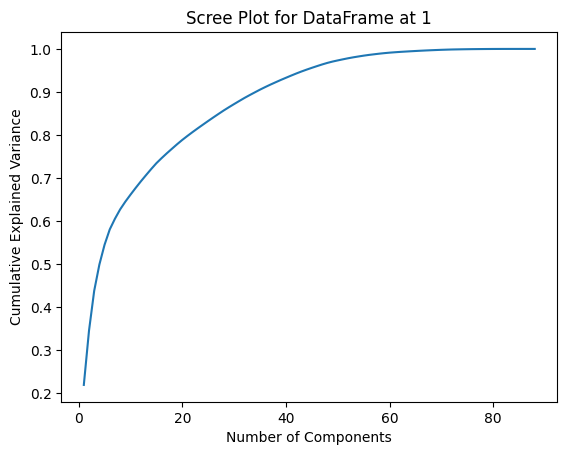

PCA for DataFrame at 2
[0.26982864 0.41125454 0.52049872 0.57732474 0.61856758 0.65763087
 0.68473681 0.70779777 0.7262836  0.74440489 0.76168491 0.77628253
 0.78990422 0.80234876 0.8141946  0.82569147 0.83654166 0.84693368
 0.85673761 0.86620011 0.87552762 0.88395895 0.89227983 0.90012901
 0.90767114 0.91487421 0.92197134 0.92851976 0.9346552  0.94035389
 0.94582579 0.95090874 0.95576736 0.96035756 0.96419714 0.96773595
 0.97100639 0.97411093 0.97706061 0.97970617 0.9819851  0.98408586
 0.98602025 0.98778169 0.98926921 0.99068373 0.99186631 0.9929712
 0.9938991  0.99481003 0.99561018 0.99636367 0.9970967  0.99775511
 0.99837315 0.99888631 0.99937194 0.99957306 0.99971724 0.99984968
 0.99992147 0.99997043 0.99998963 0.99999903 0.99999985 1.        ]
dimension :  24


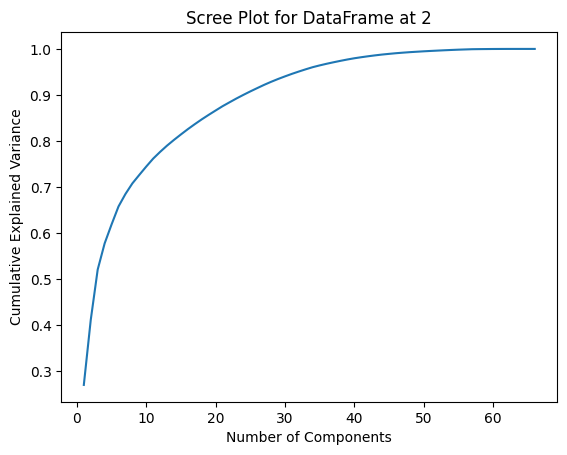

PCA for DataFrame at 3
[0.27855606 0.40665669 0.51227533 0.57298341 0.61586023 0.6547343
 0.68234418 0.70433322 0.72361077 0.74201981 0.75947938 0.77458693
 0.78783674 0.80065029 0.81283773 0.82472172 0.83587415 0.84667024
 0.85721159 0.86723737 0.87685493 0.88579468 0.89434732 0.90258079
 0.9105001  0.91800458 0.9250735  0.93165143 0.93756139 0.9432724
 0.94864532 0.95377097 0.95856116 0.96258793 0.9663044  0.96974371
 0.97301494 0.97611257 0.97884641 0.98128855 0.98349985 0.98559278
 0.98744165 0.98903701 0.99049937 0.99175071 0.99286619 0.99379676
 0.99470775 0.99557252 0.99637862 0.99712501 0.99781488 0.99843287
 0.99893271 0.99941545 0.99962464 0.99977075 0.99988238 0.99992913
 0.99997398 0.999988   0.99999896 0.99999984 1.        ]
dimension :  24


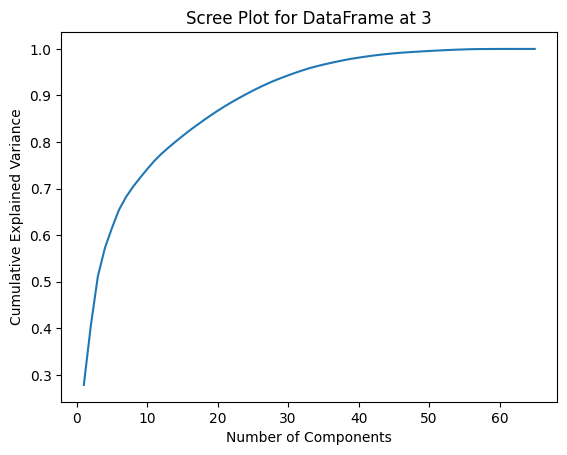

PCA for DataFrame at 4
[0.20452924 0.29146799 0.36035521 0.41501051 0.45169518 0.48498702
 0.51022515 0.53332395 0.55564696 0.57731913 0.59762404 0.61747844
 0.63619761 0.65254115 0.66812725 0.68326311 0.69811081 0.71238964
 0.72568087 0.73850696 0.75082999 0.76299636 0.77451005 0.78579115
 0.7968717  0.80790422 0.81841305 0.82841478 0.83822593 0.84783718
 0.85696036 0.86601476 0.87494489 0.88341474 0.89160199 0.89913502
 0.90623258 0.91317225 0.91988656 0.92638596 0.93241007 0.9383145
 0.94384192 0.94917922 0.95437335 0.95851069 0.9623469  0.96594914
 0.96926906 0.9722536  0.97508802 0.97766484 0.97997911 0.98206598
 0.98408384 0.98579441 0.98733182 0.98867515 0.98993339 0.99098869
 0.99201846 0.99293726 0.99383062 0.99469884 0.99553412 0.99628411
 0.99692646 0.99751065 0.99804034 0.99855717 0.99886464 0.99909474
 0.99930471 0.99950819 0.99967663 0.99980402 0.99988413 0.99994012
 0.99996661 0.99998773 0.99999889 0.99999983 1.         1.        ]
dimension :  37


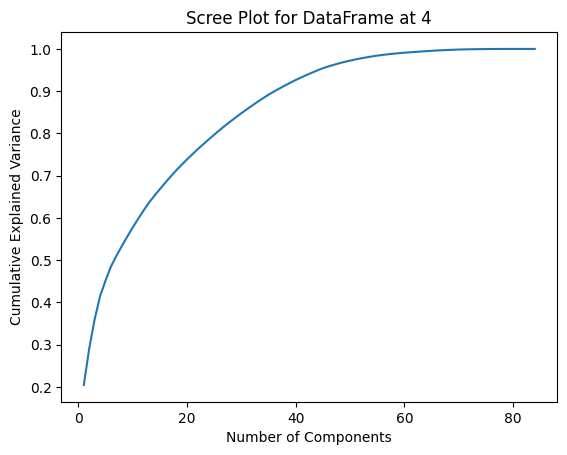

PCA for DataFrame at 5
[0.23796918 0.39572654 0.46252757 0.51513676 0.55721574 0.5852171
 0.61087366 0.63025361 0.64786225 0.66495436 0.68167503 0.69732323
 0.71234326 0.72667019 0.73921703 0.75103924 0.76270965 0.77369468
 0.78403506 0.7941528  0.80375921 0.81312116 0.82202573 0.83073798
 0.83930033 0.84774554 0.85584148 0.8635389  0.87106573 0.87847208
 0.88548368 0.89242349 0.89924327 0.90576192 0.91211074 0.91793065
 0.9236691  0.929095   0.93443083 0.93957661 0.94439861 0.94900315
 0.9535425  0.95773967 0.96183624 0.96584103 0.96903049 0.97195298
 0.97470554 0.97721628 0.97951468 0.98168384 0.98365966 0.98543637
 0.98703705 0.9885869  0.98989703 0.9910806  0.99207393 0.99289039
 0.99368415 0.99439898 0.9950976  0.99576562 0.9964102  0.99698841
 0.99753307 0.99802901 0.99847945 0.99888745 0.99912465 0.99930208
 0.99946382 0.99962042 0.99975071 0.99984895 0.99991062 0.99995379
 0.99997423 0.99999054 0.99999914 0.99999987 1.         1.        ]
dimension :  34


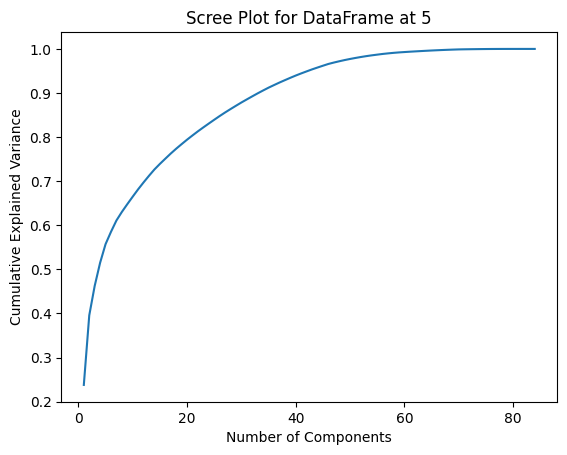

PCA for DataFrame at 6
[0.21987442 0.3653693  0.45910541 0.51863782 0.56327604 0.59977532
 0.6242575  0.64605443 0.66389184 0.67965975 0.69522043 0.71001135
 0.72421098 0.73805127 0.75111084 0.76265124 0.77355487 0.78417619
 0.79427431 0.80376571 0.81284729 0.82164869 0.8302314  0.83835752
 0.84635581 0.85411236 0.86172096 0.86889046 0.87587178 0.88271074
 0.88933841 0.89574936 0.90199158 0.90800527 0.9139063  0.91934785
 0.92469561 0.92998097 0.93496006 0.93987063 0.9446127  0.94905528
 0.95329433 0.95747445 0.96133834 0.96511469 0.96879816 0.97172385
 0.97441815 0.97694437 0.97925994 0.98137955 0.98338015 0.98519859
 0.98682519 0.98830573 0.98971749 0.99092345 0.99200849 0.99292457
 0.9937285  0.99445794 0.99510331 0.99572137 0.99632124 0.99685532
 0.99736175 0.99784288 0.99825893 0.99864335 0.99901798 0.99923645
 0.9994     0.99954911 0.99969348 0.99981003 0.99990058 0.99995743
 0.99997625 0.99999128 0.99999921 0.99999988 1.         1.        ]
dimension :  33


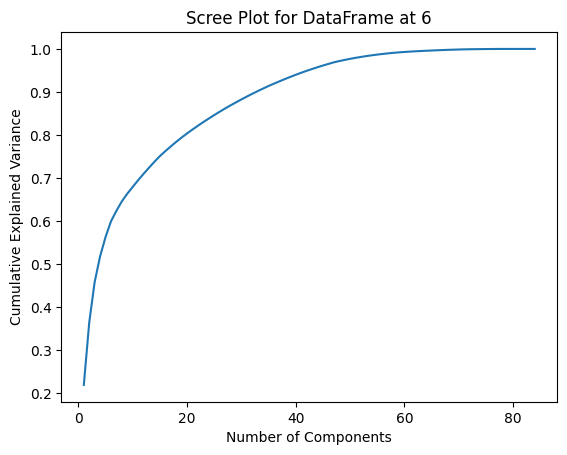

PCA for DataFrame at 7
[0.22283342 0.34493317 0.43885614 0.49981512 0.54630603 0.58234103
 0.60722448 0.62923618 0.64743109 0.66366383 0.6796349  0.69504657
 0.70974382 0.72403815 0.73749761 0.74913541 0.76044879 0.77128463
 0.78196922 0.79205598 0.80153597 0.8106378  0.81949068 0.82810978
 0.83668654 0.84507927 0.85331296 0.86136324 0.86900548 0.87642257
 0.88368921 0.89081159 0.89745578 0.90392839 0.91032078 0.91625655
 0.92204798 0.92752049 0.93290761 0.93800299 0.94302889 0.94778604
 0.95227607 0.95639143 0.96039818 0.96412333 0.96768479 0.97070163
 0.97344176 0.9759863  0.9782947  0.98050567 0.98246526 0.98437449
 0.98605052 0.98753061 0.98897552 0.99024451 0.99134992 0.99227207
 0.99312694 0.99386658 0.99458072 0.99526632 0.99590726 0.99651091
 0.99705656 0.99756062 0.99803759 0.99843197 0.99879493 0.99903537
 0.99924663 0.99941352 0.99954955 0.99967097 0.99978654 0.99988465
 0.99992444 0.99996171 0.99997934 0.99999046 0.99999917 0.99999987
 1.         1.        ]
dimension :  34

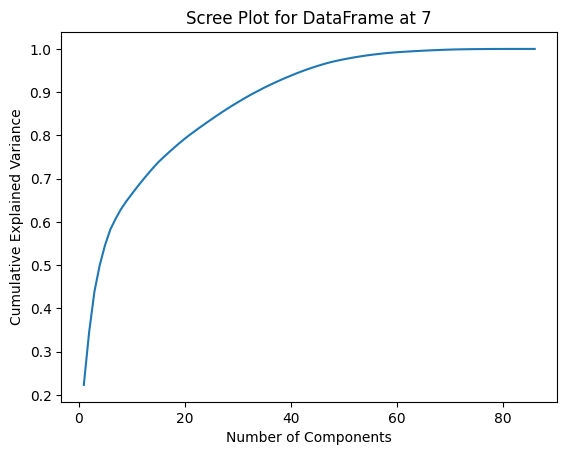

PCA for DataFrame at 8
[0.22383993 0.34660441 0.44055868 0.50172527 0.54842357 0.58375685
 0.60878674 0.63079644 0.64902113 0.66530708 0.68110123 0.69647464
 0.71102366 0.7251658  0.73853666 0.75025671 0.76160494 0.77248494
 0.78322829 0.79333769 0.80285784 0.81181434 0.82063143 0.82928768
 0.83774942 0.84611165 0.8542911  0.86217125 0.86967373 0.87698477
 0.88424921 0.89137168 0.89788016 0.90431633 0.91045156 0.91632444
 0.92214423 0.92761424 0.93279963 0.93791943 0.94293235 0.94767074
 0.95211777 0.95624223 0.96026158 0.96393443 0.9675094  0.97054935
 0.97329196 0.97586751 0.97818746 0.98041088 0.98237863 0.98429502
 0.98597626 0.98746294 0.98891493 0.99018917 0.99130121 0.99222737
 0.99308623 0.99383182 0.99454956 0.99523852 0.99588288 0.9964915
 0.99704247 0.99754906 0.99802833 0.99842458 0.99878923 0.99903079
 0.99924301 0.99941073 0.99954739 0.99966939 0.9997855  0.99988407
 0.99992408 0.99996152 0.99997922 0.99999041 0.99999916 0.99999987
 1.         1.        ]
dimension :  34


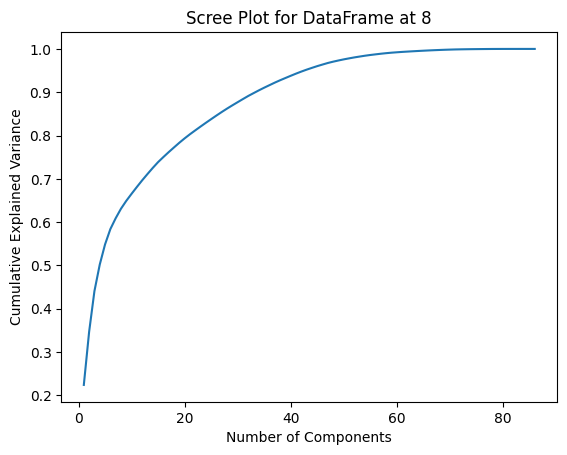

PCA for DataFrame at 9
[0.22387081 0.34662483 0.44098827 0.50222378 0.548862   0.58510355
 0.61004296 0.6321279  0.65035788 0.66667125 0.68270111 0.698182
 0.71272653 0.72710801 0.74062556 0.75218847 0.76355    0.77440382
 0.78485528 0.79467676 0.80403548 0.81309519 0.82197986 0.83059842
 0.83903226 0.84734717 0.8554771  0.86315702 0.87063518 0.87793728
 0.88513569 0.89181834 0.898322   0.90474947 0.91074856 0.91657054
 0.92208919 0.92750919 0.93270748 0.93782317 0.94283794 0.94757651
 0.95201482 0.95614106 0.96015206 0.96384201 0.96741691 0.97044985
 0.97316565 0.97571196 0.97802956 0.98025102 0.98221899 0.98413508
 0.98581629 0.98730455 0.98875643 0.99003172 0.99114185 0.99206823
 0.99292759 0.99367146 0.99438895 0.99507778 0.99572209 0.99632862
 0.99687776 0.99738406 0.99786503 0.9982719  0.99866804 0.99903057
 0.99924281 0.99941049 0.99954723 0.99966932 0.99978551 0.99988411
 0.99992408 0.99996153 0.99997923 0.99999042 0.99999916 0.99999987
 1.         1.        ]
dimension :  34


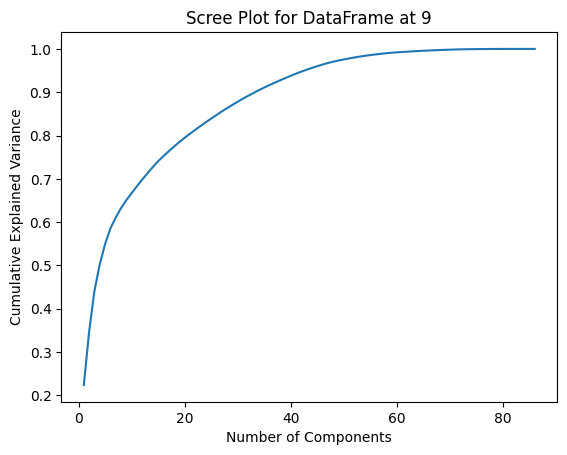

PCA for DataFrame at 10
[0.20306139 0.28933127 0.35768802 0.41204152 0.44846915 0.48153117
 0.50657631 0.52949948 0.55165103 0.57319034 0.59336551 0.61307404
 0.6316516  0.64791923 0.66338533 0.67840837 0.69315771 0.70732996
 0.72052765 0.73326744 0.74549557 0.75756844 0.76900255 0.78022057
 0.79125081 0.80223464 0.81269451 0.8226248  0.83236882 0.84191104
 0.85096426 0.85994915 0.86881366 0.87721856 0.88538885 0.89288048
 0.90032416 0.9073192  0.91419778 0.92085271 0.92715018 0.93312069
 0.93897193 0.94437475 0.94966442 0.95481783 0.95892134 0.96268425
 0.96623195 0.96952023 0.9724815  0.97529245 0.97784476 0.98013781
 0.98220848 0.98421069 0.98590683 0.98743071 0.98876317 0.9900117
 0.99105881 0.99208065 0.99299198 0.99387846 0.99473999 0.99556884
 0.99631298 0.99695027 0.99752996 0.99805551 0.99856835 0.99887341
 0.99910174 0.9993101  0.999512   0.99967914 0.99980554 0.99988504
 0.99994058 0.99996686 0.99998782 0.9999989  0.99999983 1.
 1.        ]
dimension :  37


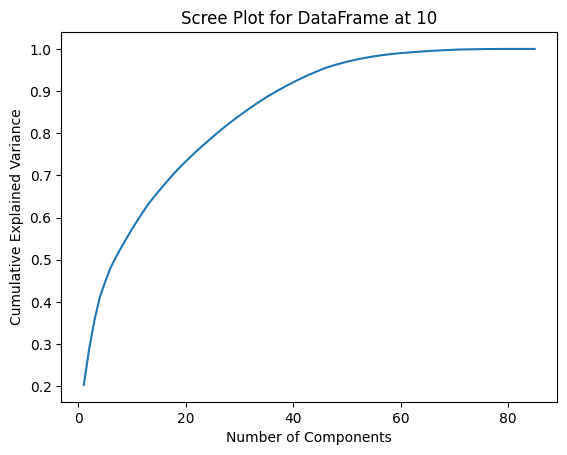

PCA for DataFrame at 11
[0.21973581 0.36509375 0.45872552 0.51817097 0.56277227 0.59923763
 0.62389929 0.64562766 0.66347517 0.67938043 0.69490637 0.70979342
 0.72395515 0.737786   0.75096574 0.76251053 0.77335583 0.7839305
 0.79397001 0.80348867 0.81256149 0.82139323 0.82996993 0.83813759
 0.84613168 0.85394409 0.86156379 0.86878642 0.87585317 0.88268945
 0.88933299 0.89578375 0.90206739 0.90807944 0.91398691 0.91942161
 0.92476366 0.9300462  0.93501921 0.93992544 0.94466509 0.94910463
 0.95333873 0.95751538 0.96137595 0.96514968 0.96883039 0.97175388
 0.97444608 0.9769718  0.97927873 0.981396   0.9833827  0.98520232
 0.98683412 0.98830846 0.9897327  0.99093888 0.99202903 0.99294401
 0.99369211 0.99442109 0.99506606 0.99568144 0.99627683 0.99680954
 0.99731559 0.99779688 0.99821252 0.99860364 0.99897852 0.99919699
 0.9993604  0.9995094  0.99965365 0.99977039 0.99986088 0.99991769
 0.99995745 0.99997626 0.99999128 0.99999921 0.99999988 1.
 1.        ]
dimension :  33


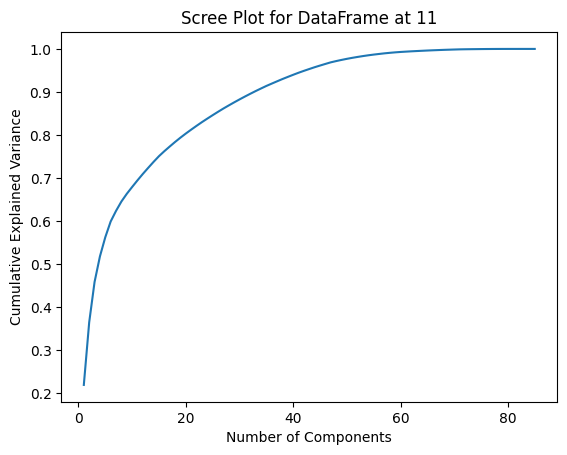

PCA for DataFrame at 12
[0.21936824 0.36451077 0.4581132  0.51751531 0.56204659 0.59847344
 0.62313882 0.64488295 0.66270062 0.67863161 0.69415462 0.70908864
 0.72325923 0.73706695 0.75022466 0.76175452 0.7726319  0.78324834
 0.79332894 0.8028658  0.81193171 0.82075636 0.82931894 0.83747561
 0.84545805 0.85326011 0.8608677  0.86809061 0.87514554 0.8819705
 0.88860431 0.89504617 0.90132012 0.90732239 0.91322014 0.91864874
 0.92398354 0.92925726 0.9342246  0.93912327 0.94385504 0.94828714
 0.9525163  0.95668642 0.96054095 0.96430888 0.96798342 0.97090207
 0.97359128 0.97611295 0.97842341 0.98053919 0.98253592 0.98435274
 0.98598417 0.98746423 0.98888609 0.99009026 0.99117917 0.99212451
 0.99300534 0.9937515  0.99447883 0.99512262 0.99573697 0.99633136
 0.99686317 0.99736837 0.99784832 0.99826325 0.99864668 0.99902041
 0.99923835 0.99940149 0.99955022 0.99969423 0.9998105  0.99990083
 0.99995753 0.99997631 0.9999913  0.99999921 0.99999988 1.
 1.        ]
dimension :  33


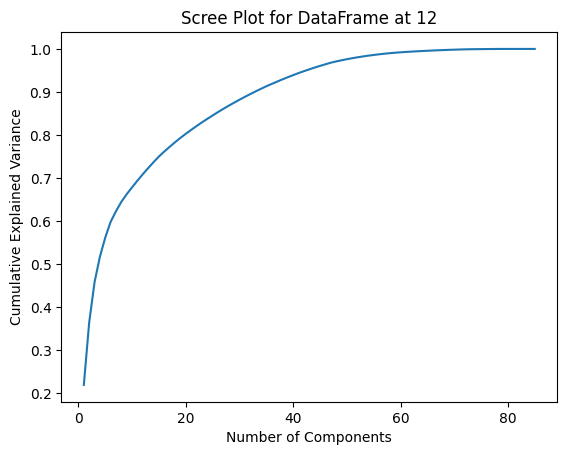

PCA for DataFrame at 13
[0.22166104 0.34320919 0.43663736 0.49727524 0.54353753 0.57944089
 0.60422241 0.62611943 0.64421891 0.66037037 0.67626903 0.69159934
 0.70622277 0.72046663 0.73385574 0.74546572 0.75671952 0.76750018
 0.77814339 0.78817905 0.79761055 0.8066716  0.81548014 0.82405498
 0.83258722 0.84093734 0.84914956 0.85718879 0.86479248 0.87217297
 0.87940143 0.8865281  0.89313782 0.89957687 0.90593572 0.9118736
 0.91763724 0.92308106 0.92844527 0.93357919 0.9386416  0.94360477
 0.94829536 0.95268927 0.95677274 0.9607437  0.96437679 0.96791615
 0.97091679 0.97360472 0.97612505 0.97841964 0.9806189  0.9825666
 0.98446367 0.98612819 0.98760012 0.9890374  0.99029846 0.9913964
 0.99231337 0.9931637  0.99389941 0.99460977 0.99529159 0.99592915
 0.99652961 0.99707234 0.99757362 0.99804804 0.99844033 0.99880135
 0.99904052 0.99925063 0.99941663 0.99955194 0.99967272 0.99978768
 0.99988527 0.99992484 0.99996192 0.99997944 0.99999051 0.99999917
 0.99999987 1.         1.        ]
dimens

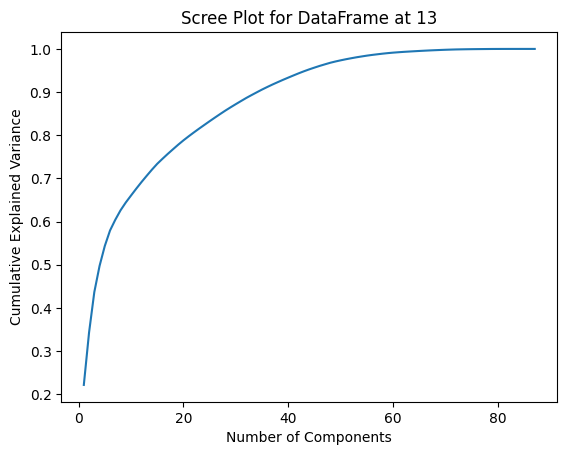

PCA for DataFrame at 14
[0.22166104 0.34320919 0.43663736 0.49727524 0.54353753 0.57944089
 0.60422241 0.62611943 0.64421891 0.66037037 0.67626903 0.69159934
 0.70622277 0.72046663 0.73385574 0.74546572 0.75671952 0.76750018
 0.77814339 0.78817905 0.79761055 0.8066716  0.81548014 0.82405498
 0.83258722 0.84093734 0.84914956 0.85718879 0.86479248 0.87217297
 0.87940143 0.8865281  0.89313782 0.89957687 0.90593572 0.9118736
 0.91763724 0.92308106 0.92844527 0.93357919 0.9386416  0.94360477
 0.94829536 0.95268927 0.95677274 0.9607437  0.96437679 0.96791615
 0.97091679 0.97360472 0.97612505 0.97841964 0.9806189  0.9825666
 0.98446367 0.98612819 0.98760012 0.9890374  0.99029846 0.9913964
 0.99231337 0.9931637  0.99389941 0.99460977 0.99529159 0.99592915
 0.99652961 0.99707234 0.99757362 0.99804804 0.99844033 0.99880135
 0.99904052 0.99925063 0.99941663 0.99955194 0.99967272 0.99978768
 0.99988527 0.99992484 0.99996192 0.99997944 0.99999051 0.99999917
 0.99999987 1.         1.        ]
dimens

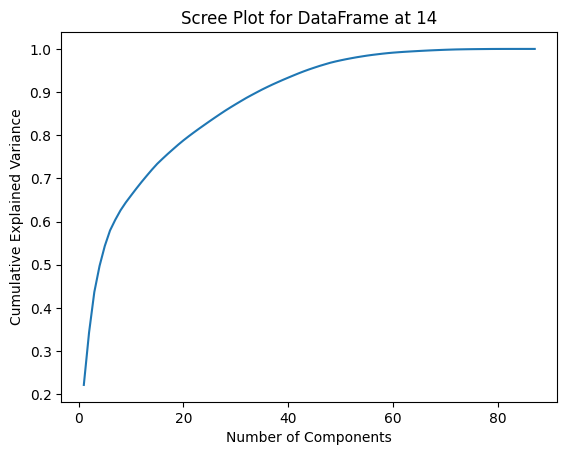

PCA for DataFrame at 15
[0.22166104 0.34320919 0.43663736 0.49727524 0.54353753 0.57944089
 0.60422241 0.62611943 0.64421891 0.66037037 0.67626903 0.69159934
 0.70622277 0.72046663 0.73385574 0.74546572 0.75671952 0.76750018
 0.77814339 0.78817905 0.79761055 0.8066716  0.81548014 0.82405498
 0.83258722 0.84093734 0.84914956 0.85718879 0.86479248 0.87217297
 0.87940143 0.8865281  0.89313782 0.89957687 0.90593572 0.9118736
 0.91763724 0.92308106 0.92844527 0.93357919 0.9386416  0.94360477
 0.94829536 0.95268927 0.95677274 0.9607437  0.96437679 0.96791615
 0.97091679 0.97360472 0.97612505 0.97841964 0.9806189  0.9825666
 0.98446367 0.98612819 0.98760012 0.9890374  0.99029846 0.9913964
 0.99231337 0.9931637  0.99389941 0.99460977 0.99529159 0.99592915
 0.99652961 0.99707234 0.99757362 0.99804804 0.99844033 0.99880135
 0.99904052 0.99925063 0.99941663 0.99955194 0.99967272 0.99978768
 0.99988527 0.99992484 0.99996192 0.99997944 0.99999051 0.99999917
 0.99999987 1.         1.        ]
dimens

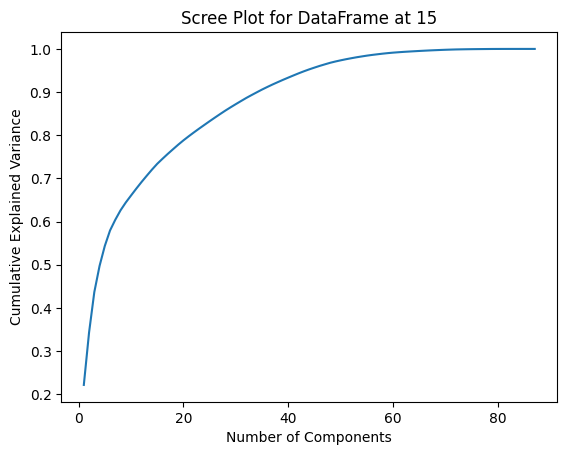

PCA for DataFrame at 16
[0.2086638  0.29710921 0.36731956 0.42293633 0.45971379 0.49354876
 0.51924492 0.54227688 0.56500241 0.58706997 0.60765428 0.62755338
 0.64643452 0.66296038 0.67873207 0.69413057 0.70865012 0.7223226
 0.73568138 0.74869095 0.76118559 0.77289636 0.78443294 0.79571893
 0.80677873 0.81748624 0.82769507 0.83755863 0.84729993 0.85659244
 0.86579511 0.87484462 0.88348496 0.89183413 0.89952309 0.90676667
 0.91385085 0.92071096 0.92734517 0.93349049 0.93951505 0.94517397
 0.95062305 0.95592363 0.96014717 0.9640584  0.96773171 0.97110617
 0.97414656 0.97701938 0.97964465 0.98198846 0.98410263 0.9861448
 0.98789093 0.98945061 0.990609   0.99166151 0.99261001 0.99354715
 0.99443718 0.99529709 0.99606979 0.99679059 0.9974473  0.99804358
 0.99858358 0.99889753 0.99913239 0.99934694 0.99955461 0.99972704
 0.99985705 0.99993882 0.99996588 0.99998747 0.99999886 0.99999983
 1.         1.        ]
dimension :  36


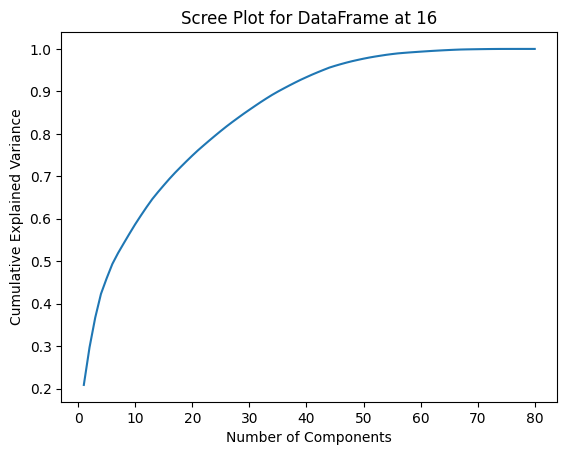

PCA for DataFrame at 17
[0.2064196  0.29394406 0.36342274 0.41859086 0.45525589 0.48882932
 0.51425798 0.53737972 0.55987281 0.58176397 0.60224785 0.62192665
 0.64080886 0.65722734 0.67283528 0.68810597 0.70247964 0.71606602
 0.72930945 0.74221207 0.75458834 0.76623936 0.77766843 0.78888684
 0.80005539 0.81069229 0.82080305 0.83069389 0.84039475 0.84960071
 0.85873614 0.86774764 0.87629359 0.88460708 0.89223691 0.89980601
 0.90691694 0.91391273 0.92068821 0.92709236 0.93316225 0.9391122
 0.94462025 0.95000426 0.95524427 0.95941833 0.9632429  0.9668499
 0.97018101 0.97318872 0.97602847 0.97862349 0.98095102 0.98304516
 0.98508151 0.98680887 0.98835938 0.98966094 0.99073013 0.99176935
 0.99270514 0.99363038 0.99450749 0.99535257 0.99611461 0.99682727
 0.99747649 0.99806587 0.99859971 0.99891008 0.99914225 0.99935435
 0.99955966 0.99973013 0.99985866 0.99993952 0.99996627 0.99998761
 0.99999888 0.99999983 1.         1.        ]
dimension :  37


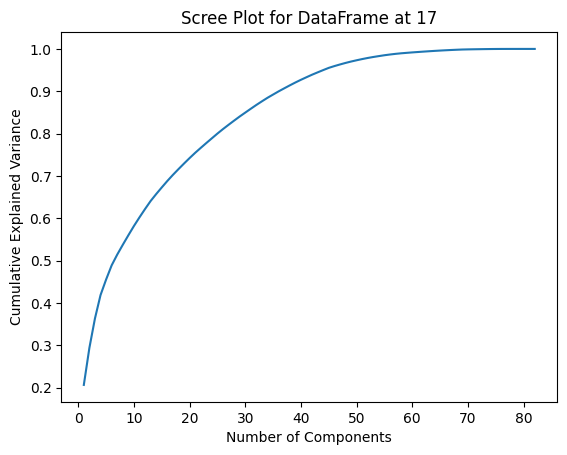

PCA for DataFrame at 18
[0.22731437 0.35188535 0.44730266 0.50941204 0.55673044 0.59253271
 0.61782998 0.64014708 0.6585924  0.67512725 0.69114347 0.70673729
 0.7213613  0.73561511 0.74918946 0.76088816 0.77240571 0.7834119
 0.79401334 0.80397073 0.81341731 0.82245847 0.83140243 0.83999563
 0.84849286 0.8567729  0.8647759  0.87239834 0.87982055 0.88719345
 0.89441314 0.90102336 0.90756555 0.91378742 0.91972174 0.92563183
 0.93120001 0.93640474 0.94154624 0.94640387 0.95100174 0.95520177
 0.95930092 0.96312636 0.96676077 0.96985083 0.97266631 0.97530248
 0.97766031 0.97991856 0.98191936 0.98386777 0.98557796 0.9870898
 0.98856464 0.98986157 0.99099379 0.99193494 0.99280774 0.99356579
 0.99429473 0.99499478 0.99564958 0.99626774 0.99682824 0.99734286
 0.99783151 0.99824475 0.99864709 0.99901529 0.99923088 0.99940122
 0.9995401  0.9996641  0.9997821  0.99988225 0.99992288 0.99996091
 0.9999789  0.99999026 0.99999915 0.99999987 1.         1.        ]
dimension :  32


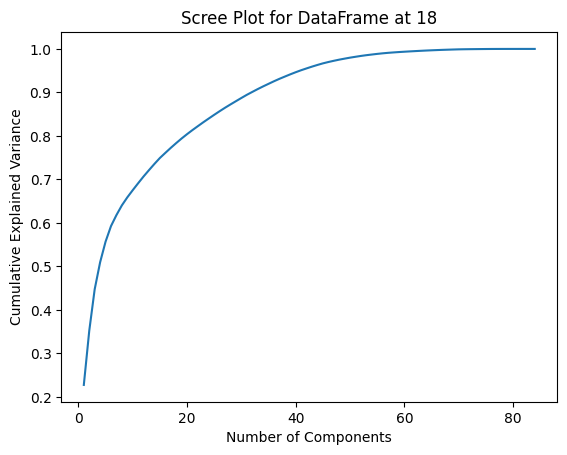

PCA for DataFrame at 19
[0.22166104 0.34320919 0.43663736 0.49727524 0.54353753 0.57944089
 0.60422241 0.62611943 0.64421891 0.66037037 0.67626903 0.69159934
 0.70622277 0.72046663 0.73385574 0.74546572 0.75671952 0.76750018
 0.77814339 0.78817905 0.79761055 0.8066716  0.81548014 0.82405498
 0.83258722 0.84093734 0.84914956 0.85718879 0.86479248 0.87217297
 0.87940143 0.8865281  0.89313782 0.89957687 0.90593572 0.9118736
 0.91763724 0.92308106 0.92844527 0.93357919 0.9386416  0.94360477
 0.94829536 0.95268927 0.95677274 0.9607437  0.96437679 0.96791615
 0.97091679 0.97360472 0.97612505 0.97841964 0.9806189  0.9825666
 0.98446367 0.98612819 0.98760012 0.9890374  0.99029846 0.9913964
 0.99231337 0.9931637  0.99389941 0.99460977 0.99529159 0.99592915
 0.99652961 0.99707234 0.99757362 0.99804804 0.99844033 0.99880135
 0.99904052 0.99925063 0.99941663 0.99955194 0.99967272 0.99978768
 0.99988527 0.99992484 0.99996192 0.99997944 0.99999051 0.99999917
 0.99999987 1.         1.        ]
dimens

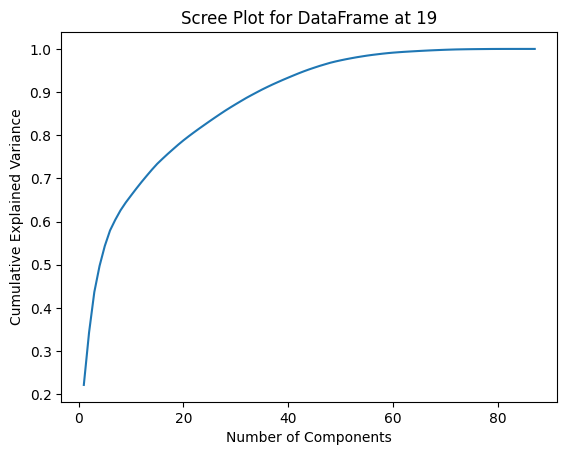

In [742]:
# Iterate over list of dataframes
for i in range(len(df_list_with_pca)):
  conduct_PCA(df_list_with_pca[i], i)

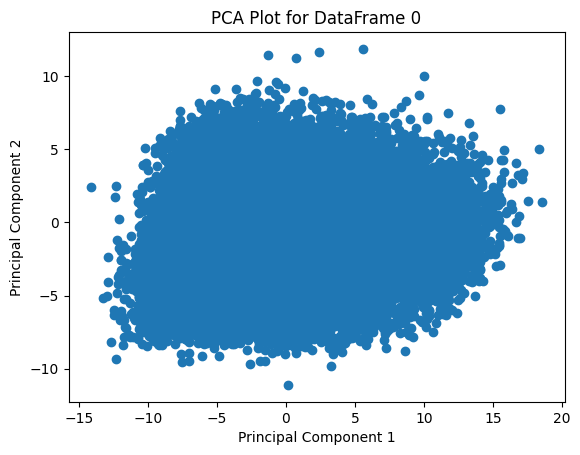

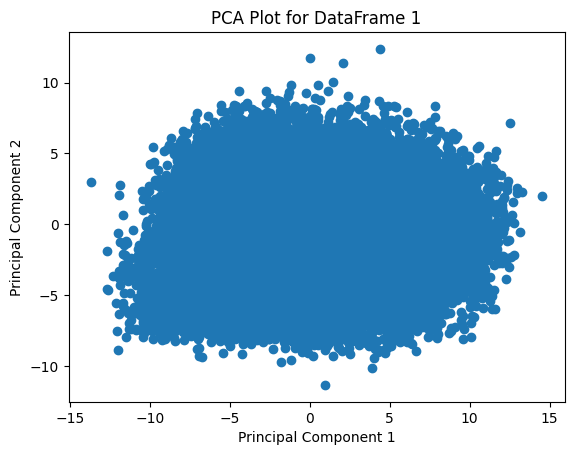

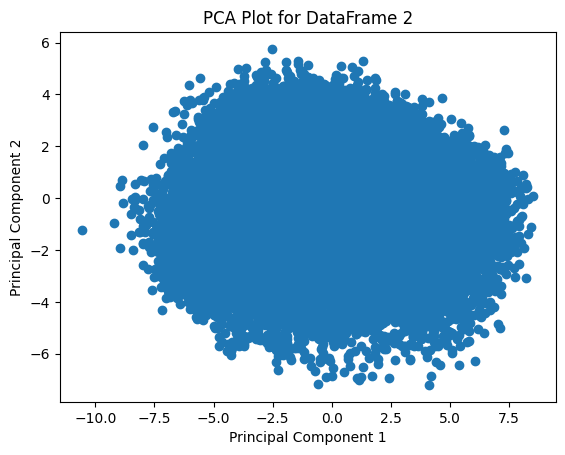

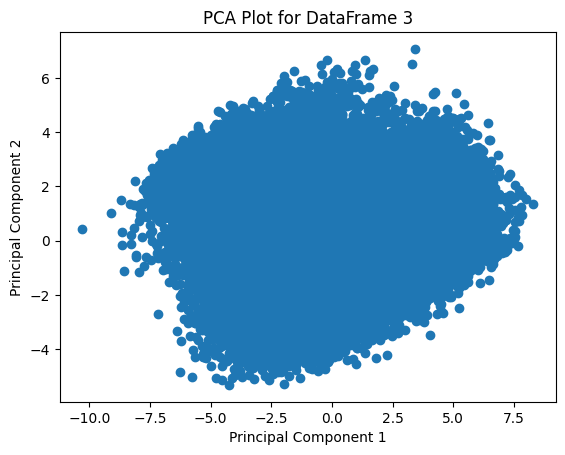

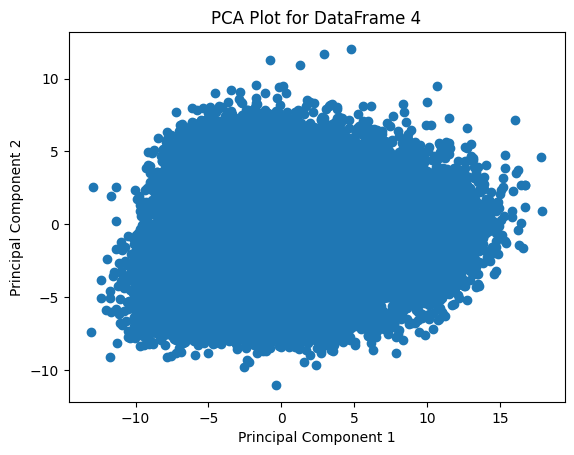

...

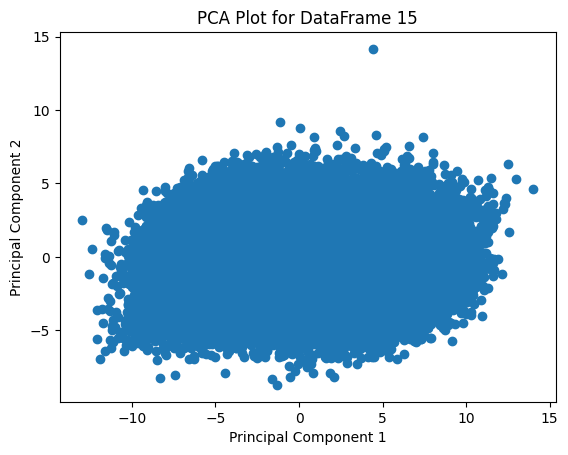

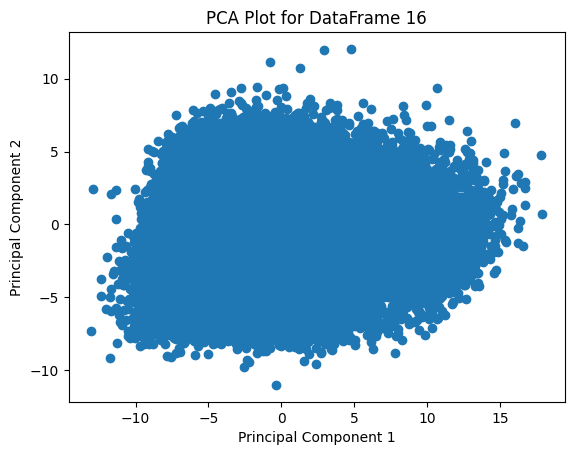

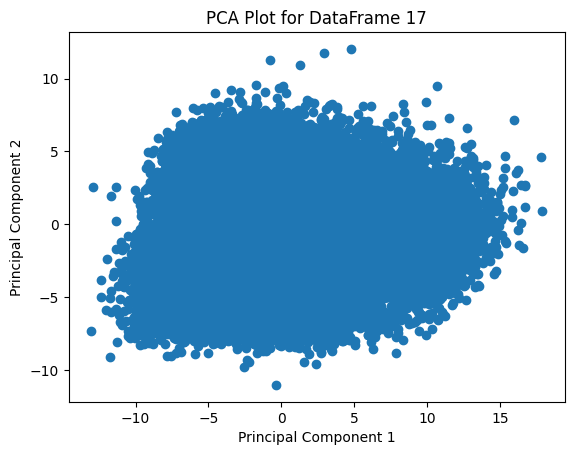

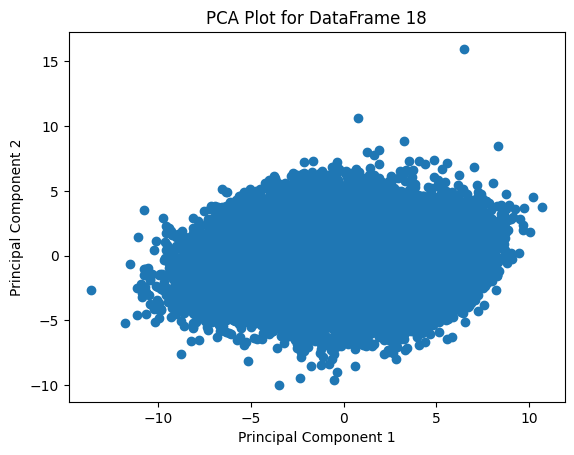

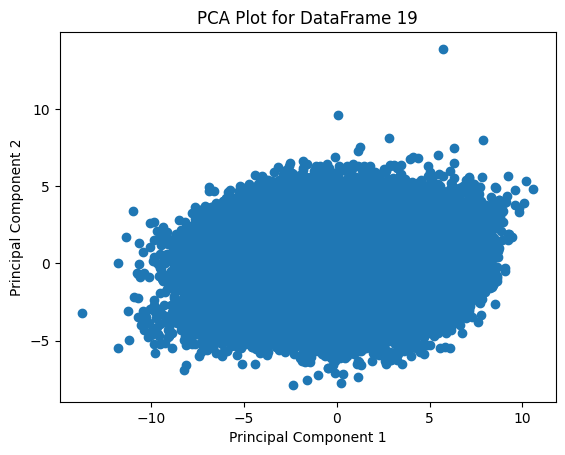

In [561]:
# Plot PCA for df_list_with_pca
for i in range(len(df_list_with_pca)):
  plt.scatter(df_list_with_pca[i][:, 0], df_list_with_pca[i][:, 1])
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.title(f'PCA Plot for DataFrame {i}')
  plt.show()

In [346]:
'''# Perform UMAP
import umap
from sklearn.manifold import trustworthiness

def conduct_UMAP(df, index_of_df):
  print(f"UMAP for DataFrame at {index_of_df}")
  reducer = umap.UMAP(n_components=2, random_state=42)
  embedding = reducer.fit_transform(df)
  trustworthiness_score = trustworthiness(df, embedding, n_neighbors=10)
  print("UMAP Trustworthiness Score:", trustworthiness_score)
  plt.scatter(embedding[:, 0], embedding[:, 1])
  plt.xlabel('UMAP Component 1')
  plt.ylabel('UMAP Component 2')
  plt.title(f'UMAP Plot for DataFrame {index_of_df}')
  plt.show()'''

In [ ]:
'''for i in range(len(df_list_no_pca)):
  conduct_UMAP(df_list_no_pca[i], i)'''

UMAP for DataFrame at 0


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


## Dataframes Plotted with 2 or 3 PCA Components:
  -

In [375]:
# Keep Possible PCA Plottable where number of columns in df_with_pca_list is 2 or 3
df_final_list_with_pca = []
for i in range(len(df_list_with_pca)):
  if df_list_with_pca[i].shape[1] in [2, 3]:
    df_final_list_with_pca.append(df_list_with_pca[i])

print(len(df_final_list_with_pca))

1


# Model Training

In [376]:
def elbow_method(df, index_of_df):
  wcss=[]
  sse = {}
  for i in range(1, 8):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                    n_init = 10, random_state = 0)
    kmeans.fit(df)
    wcss.append(kmeans.inertia_)
    sse[i] = kmeans.inertia_
    print("For cluster = {}, SSE/WCSS is {}".format(i, sse[i]))

  # Print WCSS plot
  plt.figure(figsize=(10, 6))
  plt.plot(range(1, 8), wcss)
  plt.title(f'The elbow method for DataFrame at index {index_of_df}')
  plt.xlabel('Number of clusters')
  plt.ylabel('WCSS')
  plt.show()

For cluster = 1, SSE/WCSS is 1858466570285657.2
For cluster = 2, SSE/WCSS is 974410546984469.8
For cluster = 3, SSE/WCSS is 749880531317813.6
For cluster = 4, SSE/WCSS is 651874016676189.5
For cluster = 5, SSE/WCSS is 589577927665450.4
For cluster = 6, SSE/WCSS is 541916073302409.75
For cluster = 7, SSE/WCSS is 505497068832396.44


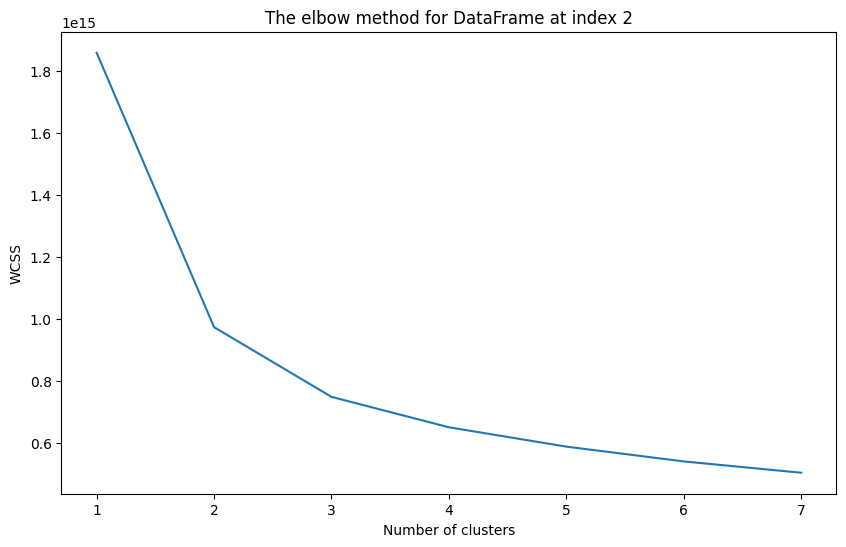

In [325]:
elbow_method(df_list_no_pca[2], 2)

For cluster = 1, SSE/WCSS is 5349101.938498962
For cluster = 2, SSE/WCSS is 4653815.442596722
For cluster = 3, SSE/WCSS is 4148857.417346663
For cluster = 4, SSE/WCSS is 3982099.154797797
For cluster = 5, SSE/WCSS is 3847188.1549119004
For cluster = 6, SSE/WCSS is 3732671.218027644
For cluster = 7, SSE/WCSS is 3642820.416646402


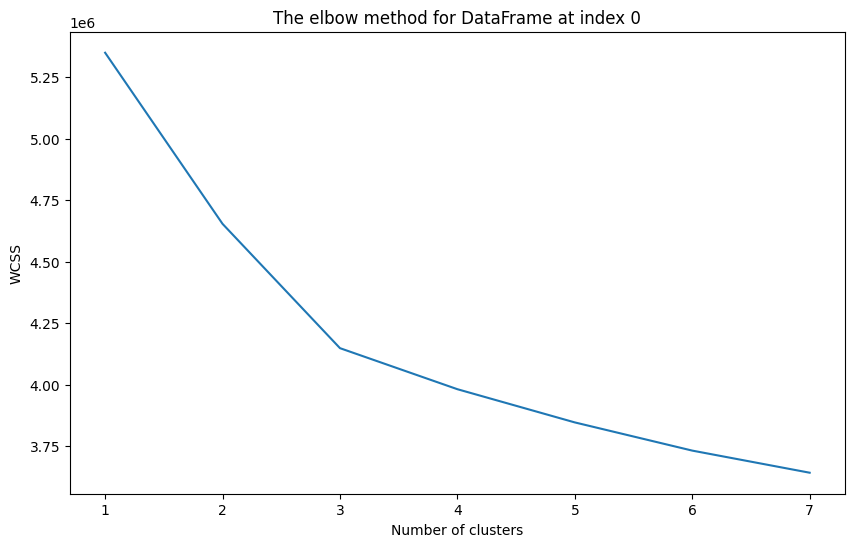

For cluster = 1, SSE/WCSS is 5428868570234.388
For cluster = 2, SSE/WCSS is 1375198825119.7742
For cluster = 3, SSE/WCSS is 612470167125.3976
For cluster = 4, SSE/WCSS is 345830187560.3507
For cluster = 5, SSE/WCSS is 223592331668.2171
For cluster = 6, SSE/WCSS is 155365059346.7542
For cluster = 7, SSE/WCSS is 114026881961.88509


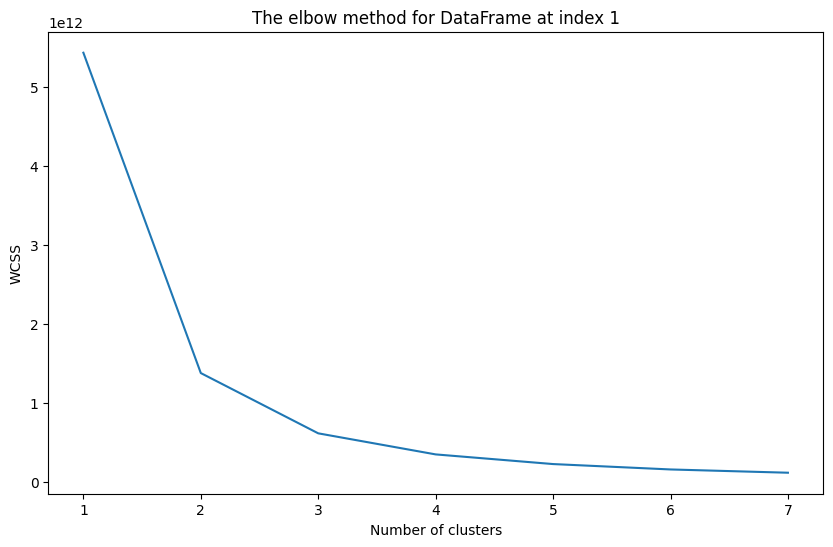

For cluster = 1, SSE/WCSS is 5263331932558.016
For cluster = 2, SSE/WCSS is 1337295817815.042
For cluster = 3, SSE/WCSS is 597818197807.9064
For cluster = 4, SSE/WCSS is 337199311832.35315
For cluster = 5, SSE/WCSS is 217980781730.2502
For cluster = 6, SSE/WCSS is 152179529578.03296
For cluster = 7, SSE/WCSS is 111074260188.56248


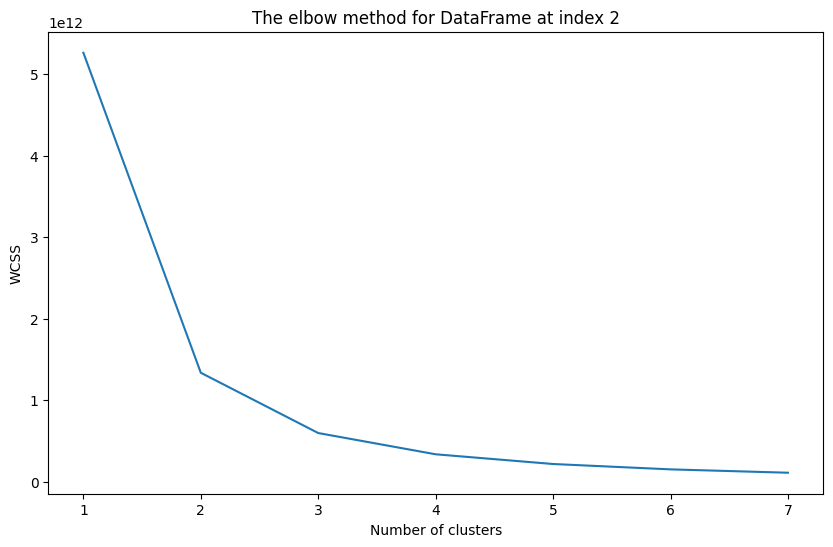

For cluster = 1, SSE/WCSS is 4355979.417533215
For cluster = 2, SSE/WCSS is 3682294.4715319923
For cluster = 3, SSE/WCSS is 3300331.800447964
For cluster = 4, SSE/WCSS is 3158407.1266071224
For cluster = 5, SSE/WCSS is 3037243.2890769998
For cluster = 6, SSE/WCSS is 2932719.9648872553
For cluster = 7, SSE/WCSS is 2860225.5020451588


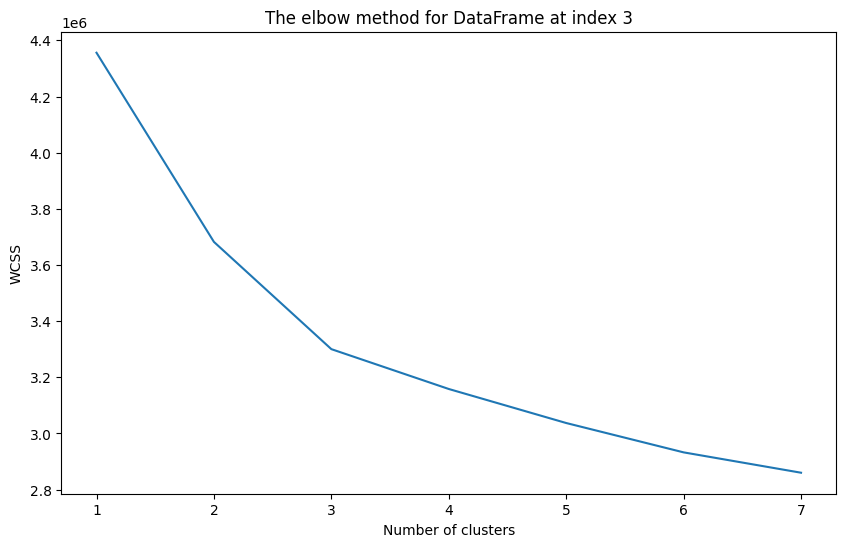

For cluster = 1, SSE/WCSS is 5428867652226.091
For cluster = 2, SSE/WCSS is 1375197907714.848
For cluster = 3, SSE/WCSS is 612470080609.8495
For cluster = 4, SSE/WCSS is 345829271987.2227
For cluster = 5, SSE/WCSS is 223593254229.39062
For cluster = 6, SSE/WCSS is 155365166895.1104
For cluster = 7, SSE/WCSS is 114027130980.26027


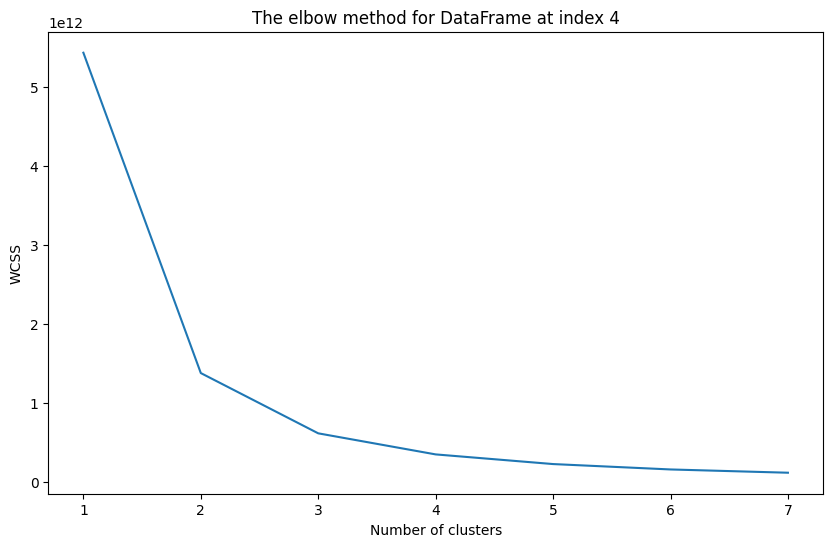

For cluster = 1, SSE/WCSS is 5263331114897.286
For cluster = 2, SSE/WCSS is 1337295000656.5208
For cluster = 3, SSE/WCSS is 597817381620.3866
For cluster = 4, SSE/WCSS is 337198496028.14667
For cluster = 5, SSE/WCSS is 217982218615.55228
For cluster = 6, SSE/WCSS is 152179092815.51865
For cluster = 7, SSE/WCSS is 111075023892.39641


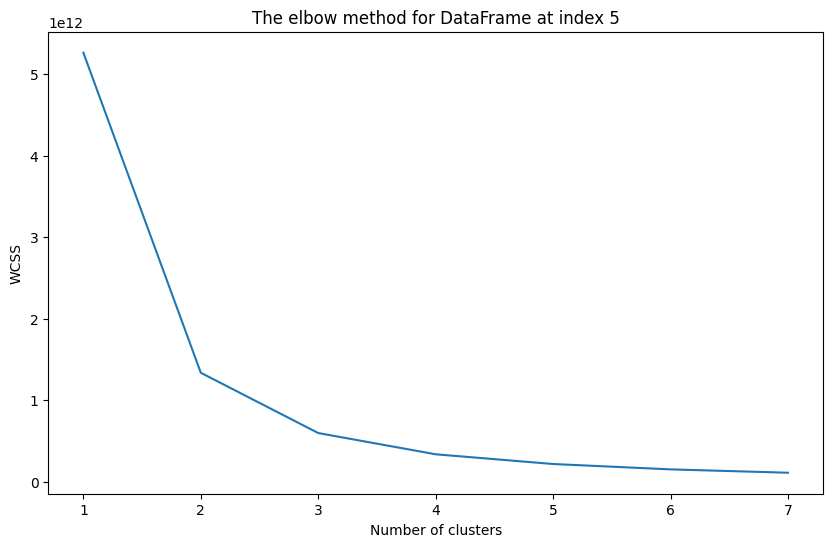

For cluster = 1, SSE/WCSS is 5015069.9268727545
For cluster = 2, SSE/WCSS is 4327489.215108849
For cluster = 3, SSE/WCSS is 3854748.4339315537
For cluster = 4, SSE/WCSS is 3704316.9530694913
For cluster = 5, SSE/WCSS is 3578050.6371298637
For cluster = 6, SSE/WCSS is 3473866.180688793
For cluster = 7, SSE/WCSS is 3386261.9224502225


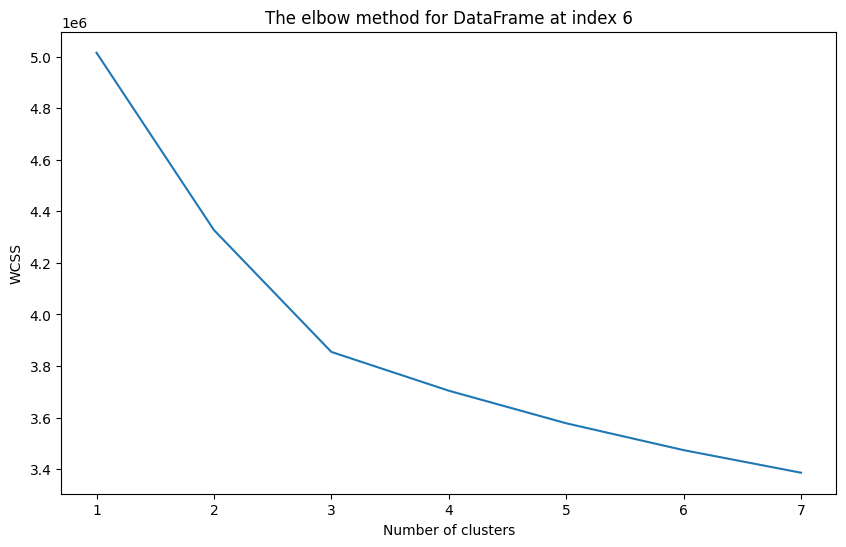

For cluster = 1, SSE/WCSS is 4841672.292870207
For cluster = 2, SSE/WCSS is 4151121.8662647107
For cluster = 3, SSE/WCSS is 3663521.92168472
For cluster = 4, SSE/WCSS is 3516257.3451171266
For cluster = 5, SSE/WCSS is 3396785.44467889
For cluster = 6, SSE/WCSS is 3297103.802945472
For cluster = 7, SSE/WCSS is 3220045.057785936


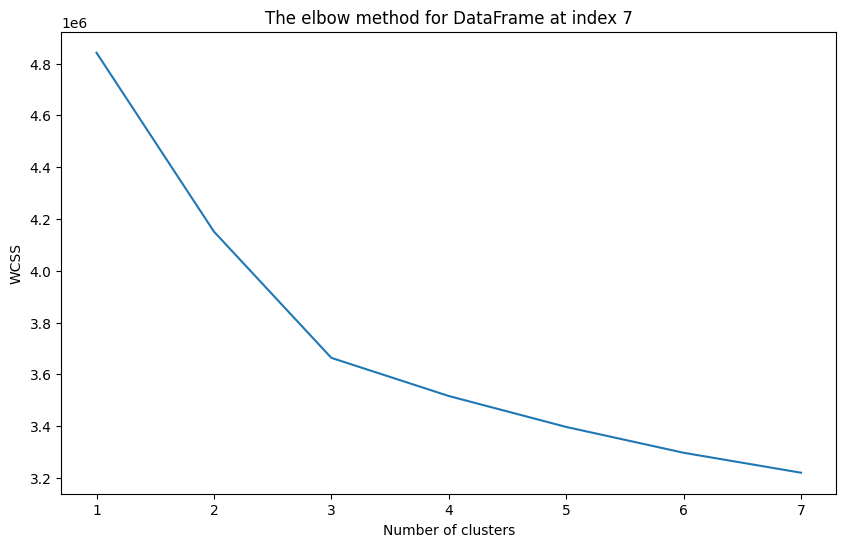

For cluster = 1, SSE/WCSS is 5211049.8848208925
For cluster = 2, SSE/WCSS is 4520126.123911365
For cluster = 3, SSE/WCSS is 4031714.2985168546
For cluster = 4, SSE/WCSS is 3865844.467404552
For cluster = 5, SSE/WCSS is 3731646.210197316
For cluster = 6, SSE/WCSS is 3618471.5840941183
For cluster = 7, SSE/WCSS is 3531153.659664632


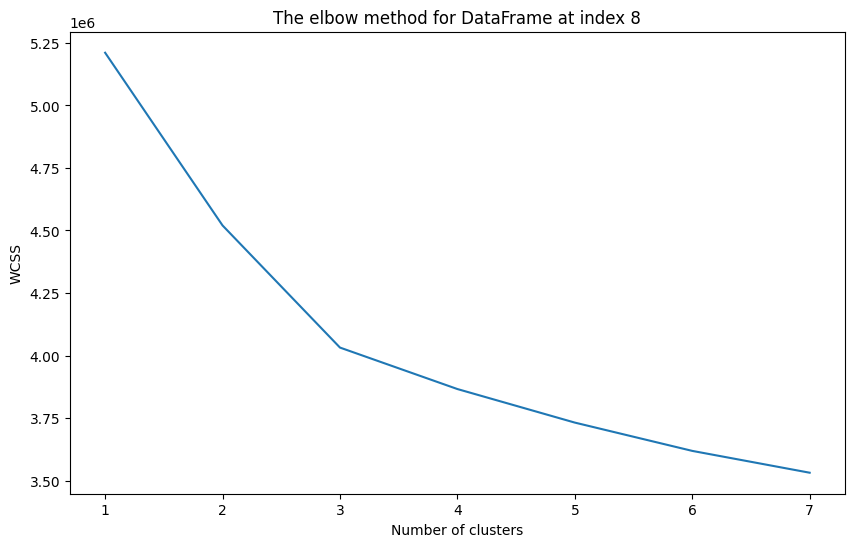

For cluster = 1, SSE/WCSS is 3443996.4353397754
For cluster = 2, SSE/WCSS is 2993367.0342044504
For cluster = 3, SSE/WCSS is 2791010.8197768824
For cluster = 4, SSE/WCSS is 2671564.8524496634
For cluster = 5, SSE/WCSS is 2586788.8536421233
For cluster = 6, SSE/WCSS is 2517527.208243965
For cluster = 7, SSE/WCSS is 2459491.114521377


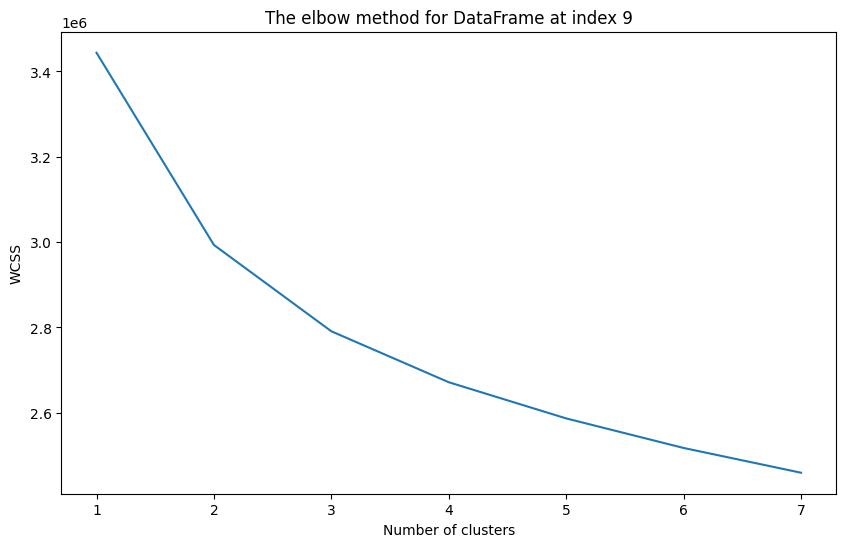

For cluster = 1, SSE/WCSS is 4134438.3075039666
For cluster = 2, SSE/WCSS is 3484887.8864667364
For cluster = 3, SSE/WCSS is 3116233.151510919
For cluster = 4, SSE/WCSS is 2982319.529249018
For cluster = 5, SSE/WCSS is 2883466.438544351
For cluster = 6, SSE/WCSS is 2801524.819430533
For cluster = 7, SSE/WCSS is 2741100.4627502616


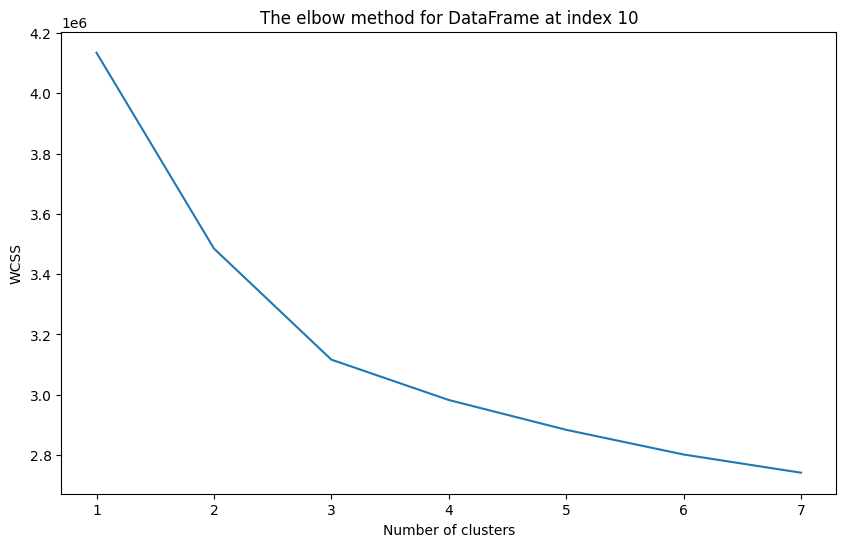

For cluster = 1, SSE/WCSS is 5428868056255.59
For cluster = 2, SSE/WCSS is 1375198311607.0862
For cluster = 3, SSE/WCSS is 612470484133.7238
For cluster = 4, SSE/WCSS is 345829675747.49005
For cluster = 5, SSE/WCSS is 223592498294.7877
For cluster = 6, SSE/WCSS is 155365570225.5583
For cluster = 7, SSE/WCSS is 114027532716.58043


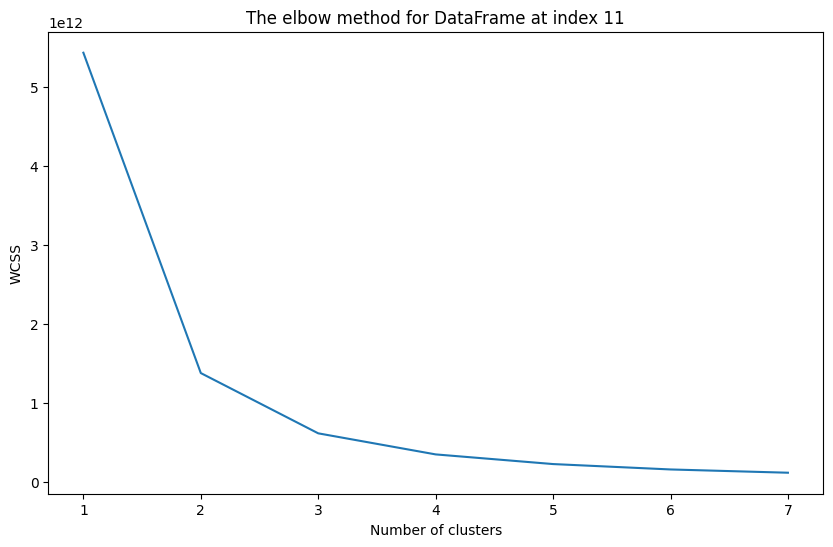

For cluster = 1, SSE/WCSS is 4789249.395183239
For cluster = 2, SSE/WCSS is 4152299.875012533
For cluster = 3, SSE/WCSS is 3800124.1278843186
For cluster = 4, SSE/WCSS is 3659201.36389789
For cluster = 5, SSE/WCSS is 3532541.101765193
For cluster = 6, SSE/WCSS is 3430512.4891813057
For cluster = 7, SSE/WCSS is 3347513.2989393924


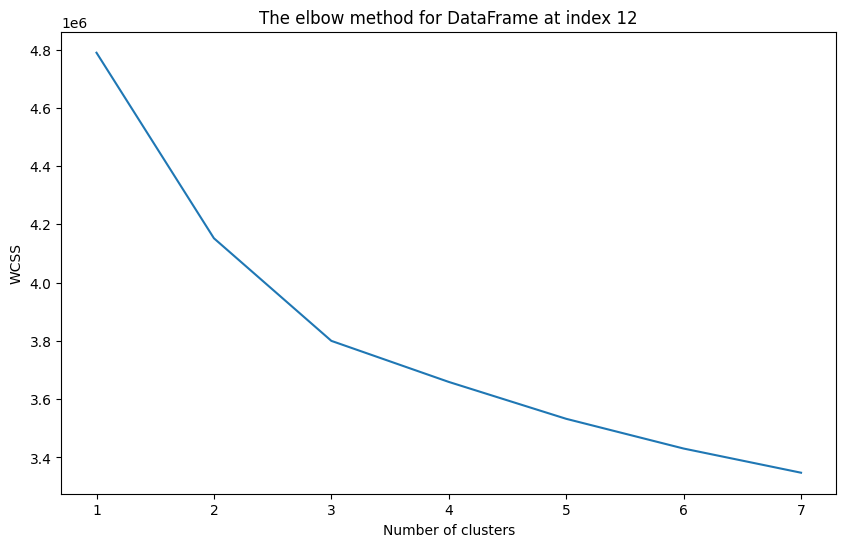

For cluster = 1, SSE/WCSS is 4789249.395183239
For cluster = 2, SSE/WCSS is 4152299.875012533
For cluster = 3, SSE/WCSS is 3800124.1278843186
For cluster = 4, SSE/WCSS is 3659201.36389789
For cluster = 5, SSE/WCSS is 3532541.101765193
For cluster = 6, SSE/WCSS is 3430512.4891813057
For cluster = 7, SSE/WCSS is 3347513.2989393924


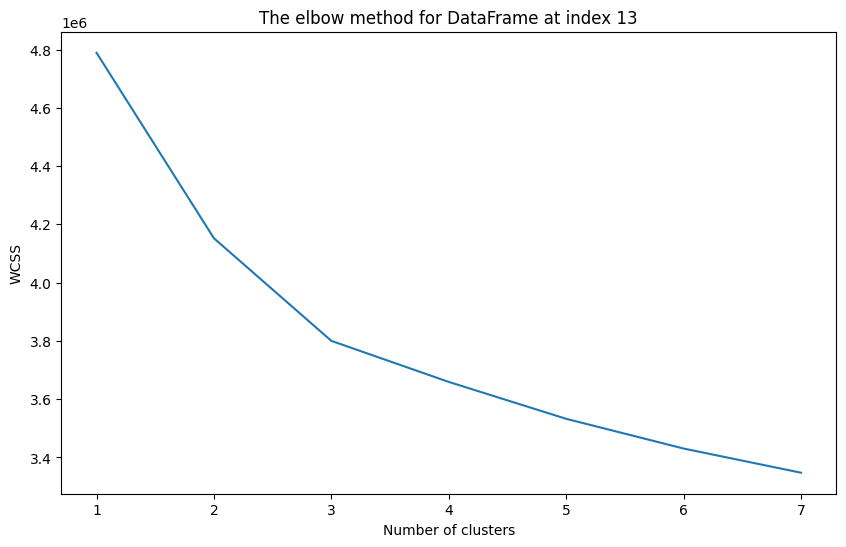

For cluster = 1, SSE/WCSS is 5263331857779.987
For cluster = 2, SSE/WCSS is 1337295743085.554
For cluster = 3, SSE/WCSS is 597818123380.5068
For cluster = 4, SSE/WCSS is 337199237316.9988
For cluster = 5, SSE/WCSS is 217981304161.74374
For cluster = 6, SSE/WCSS is 152179455541.65295
For cluster = 7, SSE/WCSS is 111074186681.15202


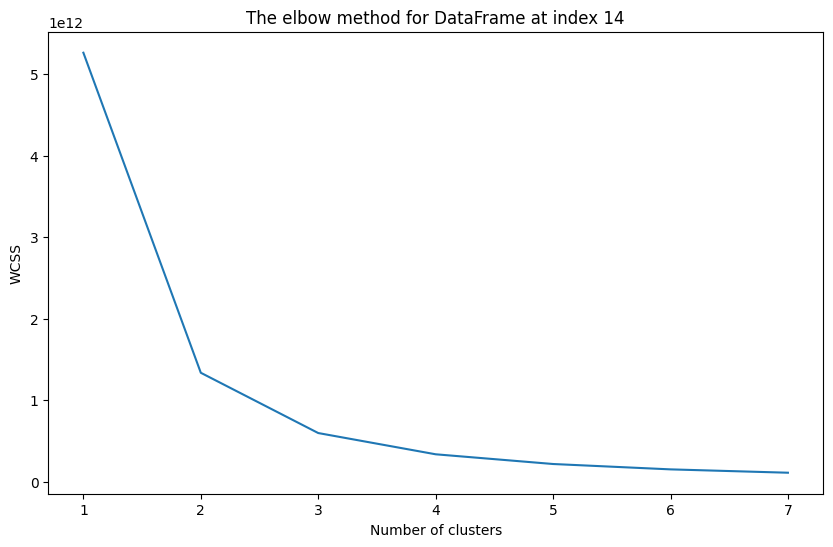

For cluster = 1, SSE/WCSS is 5025452.377479322
For cluster = 2, SSE/WCSS is 4337863.855558829
For cluster = 3, SSE/WCSS is 3864982.267442582
For cluster = 4, SSE/WCSS is 3713945.3060634527
For cluster = 5, SSE/WCSS is 3587326.379547354
For cluster = 6, SSE/WCSS is 3485203.007033291
For cluster = 7, SSE/WCSS is 3395149.3567780876


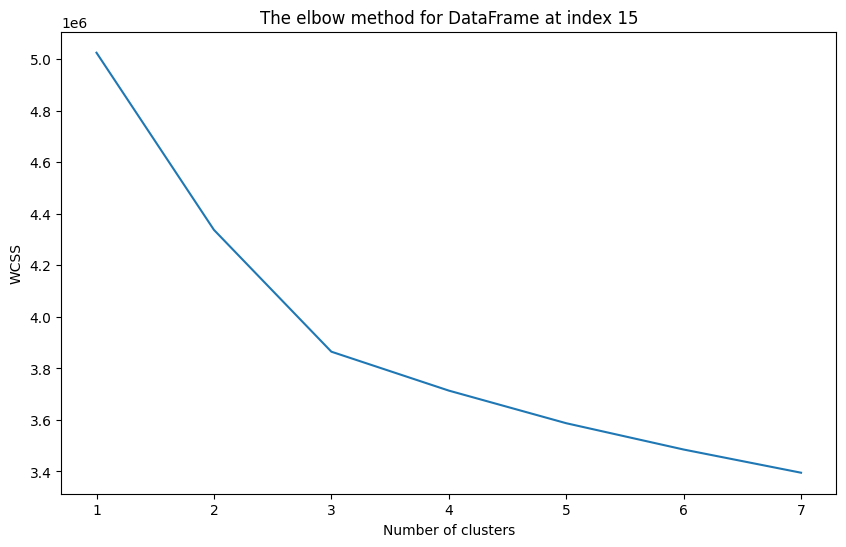

For cluster = 1, SSE/WCSS is 4860693.897626612
For cluster = 2, SSE/WCSS is 4170119.001830255
For cluster = 3, SSE/WCSS is 3682389.199799889
For cluster = 4, SSE/WCSS is 3535103.3119133613
For cluster = 5, SSE/WCSS is 3415293.594225874
For cluster = 6, SSE/WCSS is 3315789.9787479127
For cluster = 7, SSE/WCSS is 3237391.2911232575


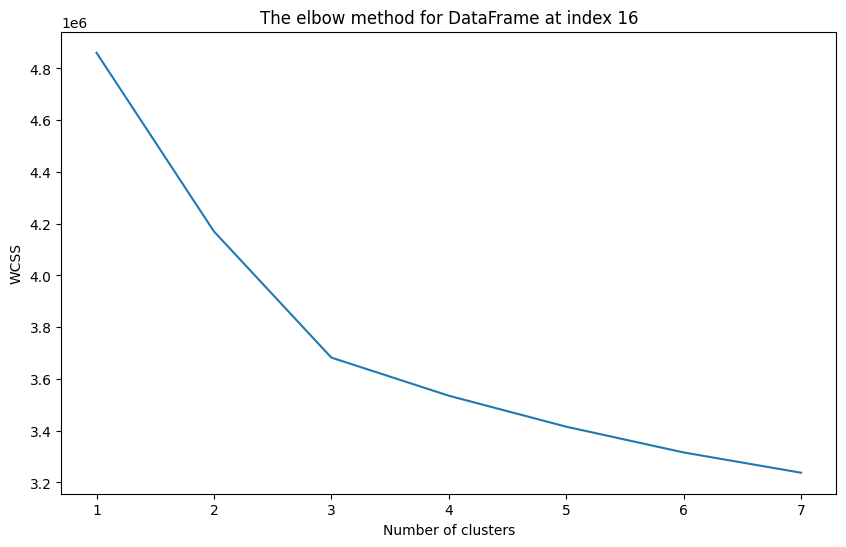

For cluster = 1, SSE/WCSS is 5217218.869223017
For cluster = 2, SSE/WCSS is 4526275.764607262
For cluster = 3, SSE/WCSS is 4037785.780441214
For cluster = 4, SSE/WCSS is 3871451.233775
For cluster = 5, SSE/WCSS is 3736893.5044852663
For cluster = 6, SSE/WCSS is 3623858.5676877107
For cluster = 7, SSE/WCSS is 3536674.7534272023


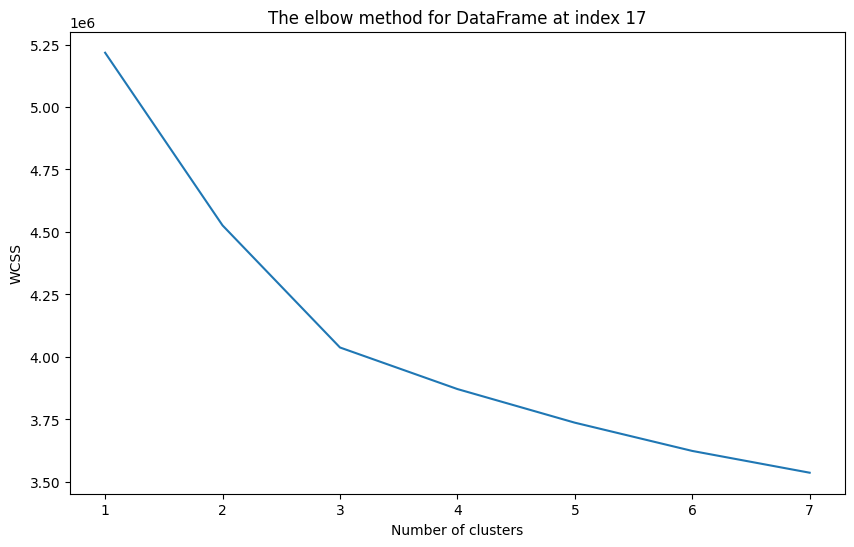

For cluster = 1, SSE/WCSS is 3482389.4353397964
For cluster = 2, SSE/WCSS is 3019248.5692861676
For cluster = 3, SSE/WCSS is 2818065.5011651493
For cluster = 4, SSE/WCSS is 2697501.3676661383
For cluster = 5, SSE/WCSS is 2612069.208541711
For cluster = 6, SSE/WCSS is 2542309.5100404522
For cluster = 7, SSE/WCSS is 2484596.7995894463


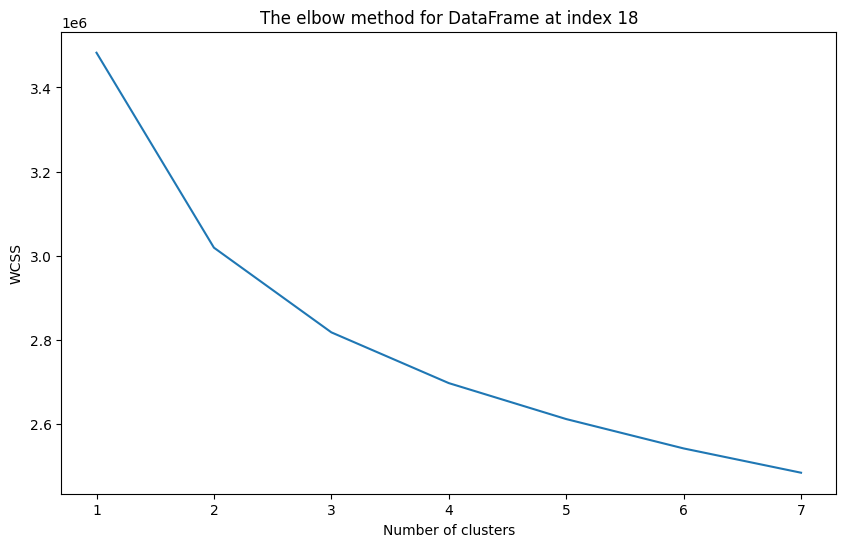

For cluster = 1, SSE/WCSS is 4172831.3075039443
For cluster = 2, SSE/WCSS is 3523050.348620096
For cluster = 3, SSE/WCSS is 3153702.8085397496
For cluster = 4, SSE/WCSS is 3019817.74567914
For cluster = 5, SSE/WCSS is 2919581.9648267305
For cluster = 6, SSE/WCSS is 2836333.581769813
For cluster = 7, SSE/WCSS is 2772005.2156982077


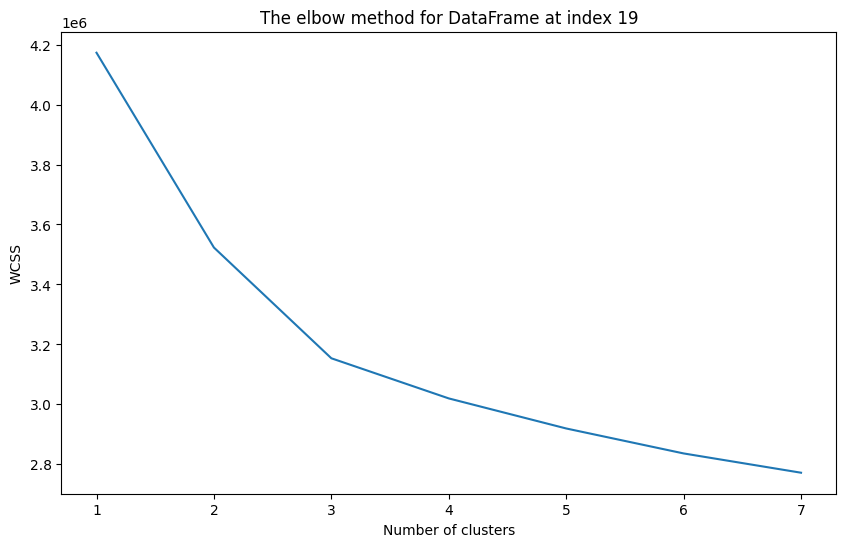

For cluster = 1, SSE/WCSS is 5428868094648.611
For cluster = 2, SSE/WCSS is 1375198349994.469
For cluster = 3, SSE/WCSS is 612470522443.9756
For cluster = 4, SSE/WCSS is 345829714046.1784
For cluster = 5, SSE/WCSS is 223592536436.55246
For cluster = 6, SSE/WCSS is 155365608528.4468
For cluster = 7, SSE/WCSS is 114027570809.19025


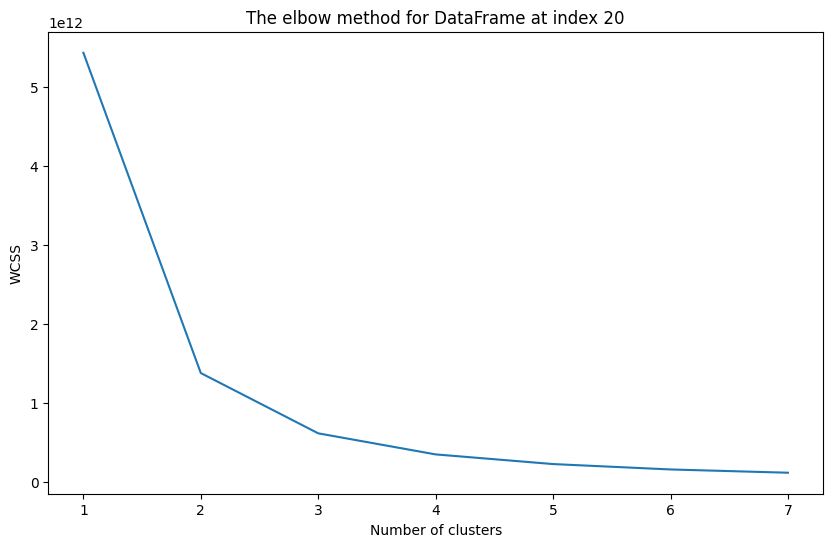

For cluster = 1, SSE/WCSS is 5263331895168.979
For cluster = 2, SSE/WCSS is 1337295780431.131
For cluster = 3, SSE/WCSS is 597818160701.7258
For cluster = 4, SSE/WCSS is 337199274592.3668
For cluster = 5, SSE/WCSS is 217980744970.252
For cluster = 6, SSE/WCSS is 152179492854.41022
For cluster = 7, SSE/WCSS is 111074223900.85867


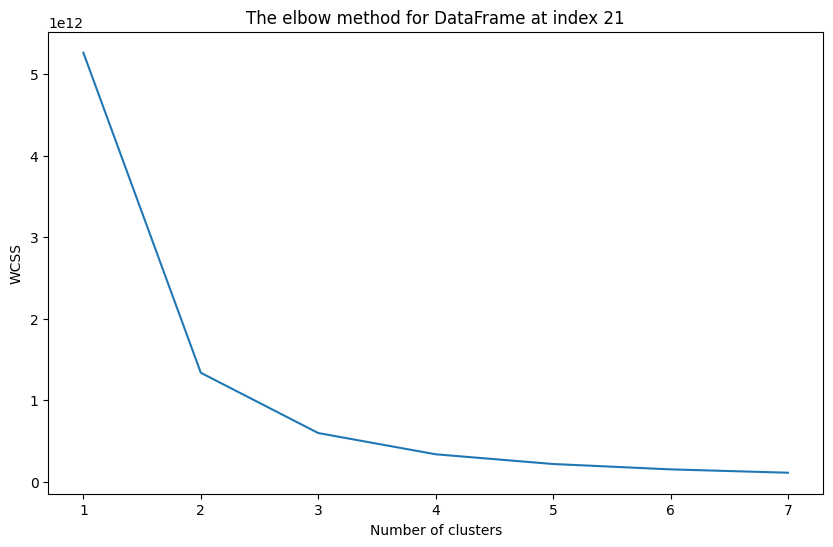

For cluster = 1, SSE/WCSS is 5263331895168.979
For cluster = 2, SSE/WCSS is 1337295780431.131
For cluster = 3, SSE/WCSS is 597818160701.7258
For cluster = 4, SSE/WCSS is 337199274592.3668
For cluster = 5, SSE/WCSS is 217980744970.252
For cluster = 6, SSE/WCSS is 152179492854.41022
For cluster = 7, SSE/WCSS is 111074223900.85867


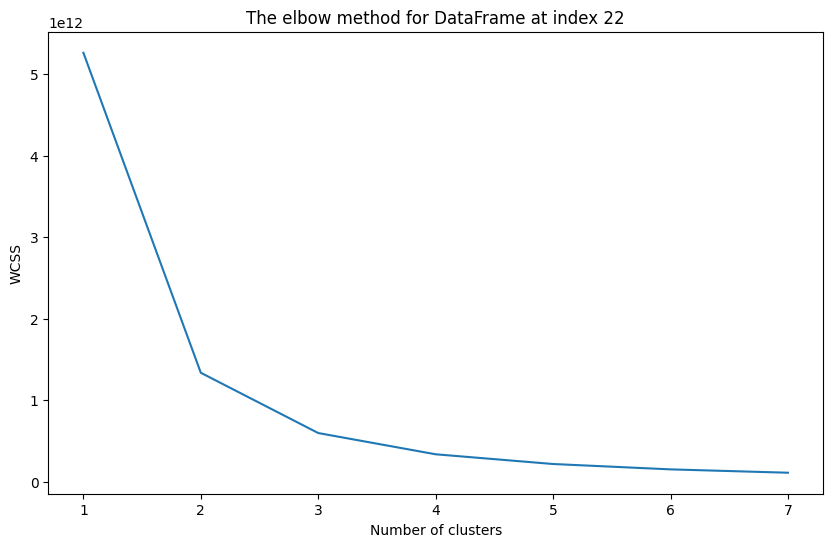

For cluster = 1, SSE/WCSS is 5263331895168.979
For cluster = 2, SSE/WCSS is 1337295780431.1309
For cluster = 3, SSE/WCSS is 597818160701.7258
For cluster = 4, SSE/WCSS is 337199274592.3669
For cluster = 5, SSE/WCSS is 217980744970.252
For cluster = 6, SSE/WCSS is 152179492854.41022
For cluster = 7, SSE/WCSS is 111074223900.85867


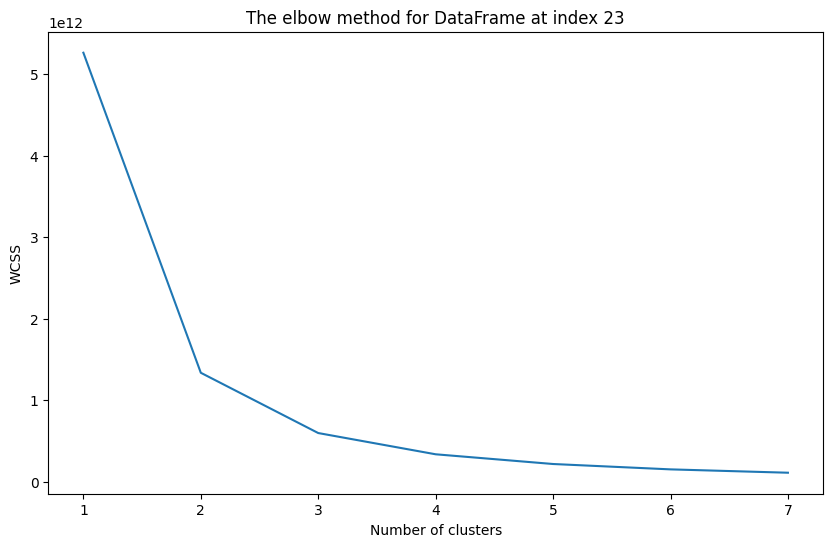

For cluster = 1, SSE/WCSS is 4520326.572910663
For cluster = 2, SSE/WCSS is 3833086.162760533
For cluster = 3, SSE/WCSS is 3361317.476812766
For cluster = 4, SSE/WCSS is 3218859.071546399
For cluster = 5, SSE/WCSS is 3102427.561435015
For cluster = 6, SSE/WCSS is 3007046.4885907923
For cluster = 7, SSE/WCSS is 2933403.4444924793


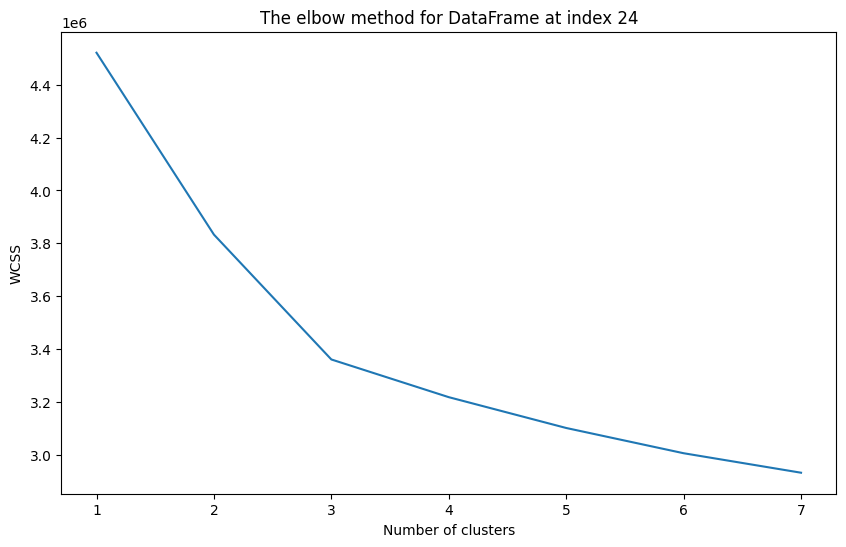

For cluster = 1, SSE/WCSS is 4536878.0079193385
For cluster = 2, SSE/WCSS is 3849613.604690558
For cluster = 3, SSE/WCSS is 3377630.44371124
For cluster = 4, SSE/WCSS is 3234988.5338316024
For cluster = 5, SSE/WCSS is 3118471.3274186626
For cluster = 6, SSE/WCSS is 3022955.3385850913
For cluster = 7, SSE/WCSS is 2949202.499639306


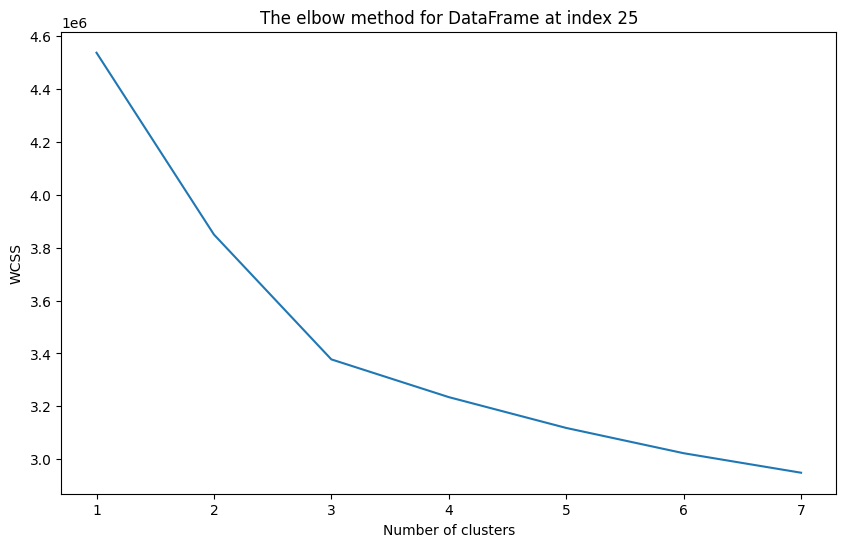

For cluster = 1, SSE/WCSS is 2575010.4690438514
For cluster = 2, SSE/WCSS is 2130056.865092496
For cluster = 3, SSE/WCSS is 1984074.7495573305
For cluster = 4, SSE/WCSS is 1898264.950686931
For cluster = 5, SSE/WCSS is 1827924.199351659
For cluster = 6, SSE/WCSS is 1766576.0015568912
For cluster = 7, SSE/WCSS is 1721851.3692082863


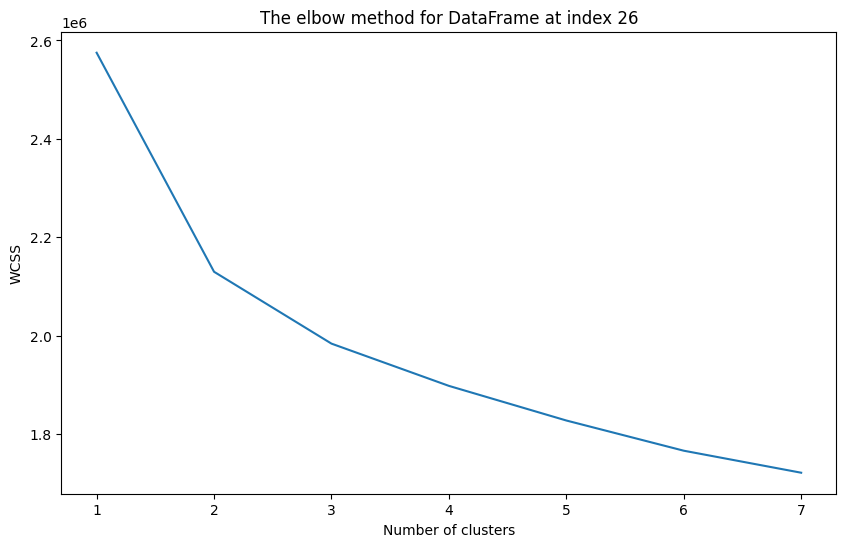

For cluster = 1, SSE/WCSS is 2651796.469043836
For cluster = 2, SSE/WCSS is 2193757.797154485
For cluster = 3, SSE/WCSS is 2044318.9131162586
For cluster = 4, SSE/WCSS is 1956208.3108655615
For cluster = 5, SSE/WCSS is 1884933.608864275
For cluster = 6, SSE/WCSS is 1823561.2057696
For cluster = 7, SSE/WCSS is 1777552.0166139554


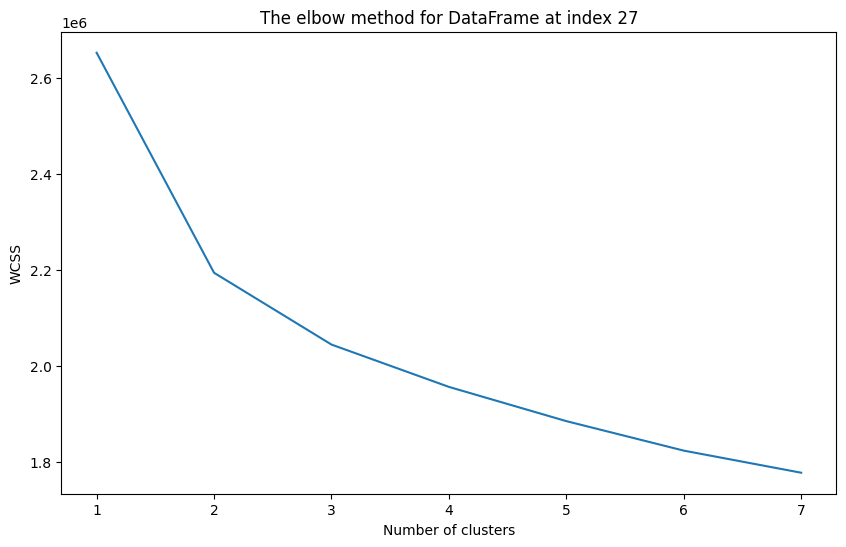

For cluster = 1, SSE/WCSS is 4751860.395183305
For cluster = 2, SSE/WCSS is 4114910.9598445147
For cluster = 3, SSE/WCSS is 3762796.1651373636
For cluster = 4, SSE/WCSS is 3621930.441696071
For cluster = 5, SSE/WCSS is 3495334.049295172
For cluster = 6, SSE/WCSS is 3393320.031568107
For cluster = 7, SSE/WCSS is 3310382.3456545514


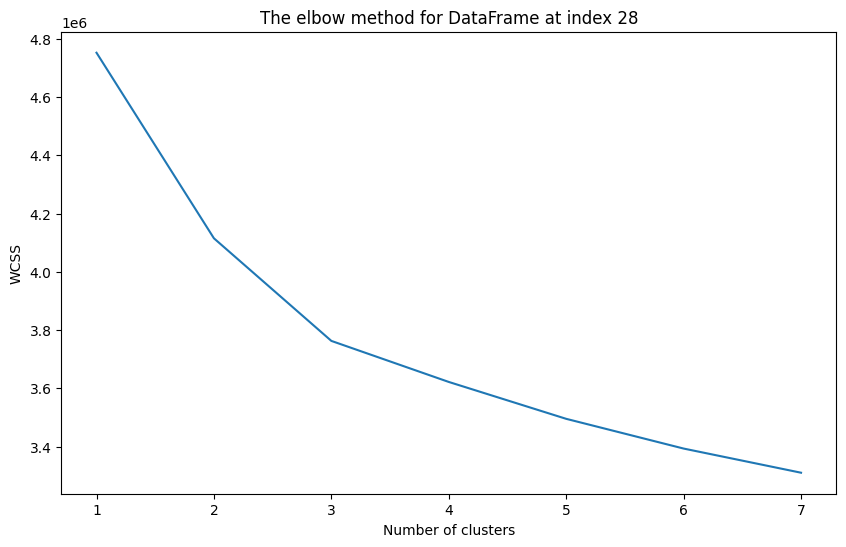

For cluster = 1, SSE/WCSS is 5263331895168.979
For cluster = 2, SSE/WCSS is 1337295780431.1309
For cluster = 3, SSE/WCSS is 597818160701.7257
For cluster = 4, SSE/WCSS is 337199274592.3668
For cluster = 5, SSE/WCSS is 217980744970.252
For cluster = 6, SSE/WCSS is 152179492854.41022
For cluster = 7, SSE/WCSS is 111074223900.85867


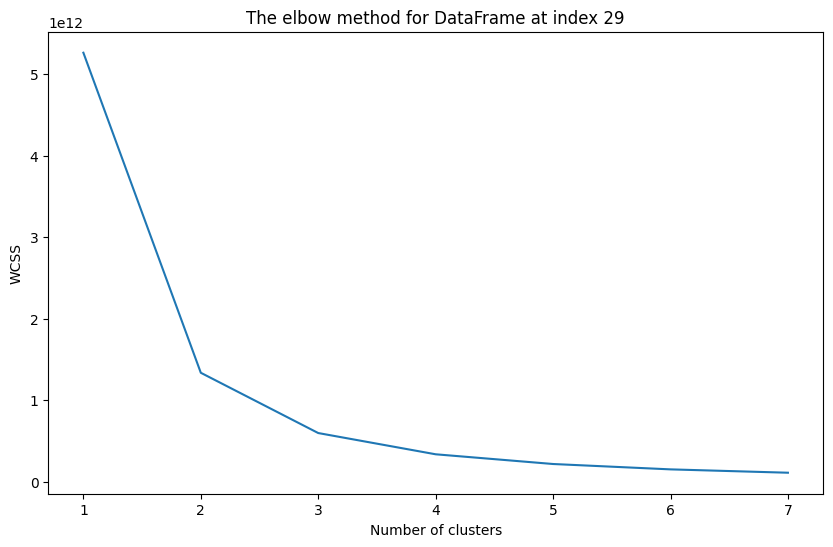

In [ ]:
# Iterate over non_df_pca list
for i in range(len(df_list_no_pca)):
  elbow_method(df_list_no_pca[i], i)

For cluster = 1, SSE/WCSS is 5428864489115.086
For cluster = 2, SSE/WCSS is 1375205866373.7395
For cluster = 3, SSE/WCSS is 612483972539.315
For cluster = 4, SSE/WCSS is 345848334697.4894
For cluster = 5, SSE/WCSS is 223649490966.88828
For cluster = 6, SSE/WCSS is 155694369721.8051
For cluster = 7, SSE/WCSS is 114133082845.47952


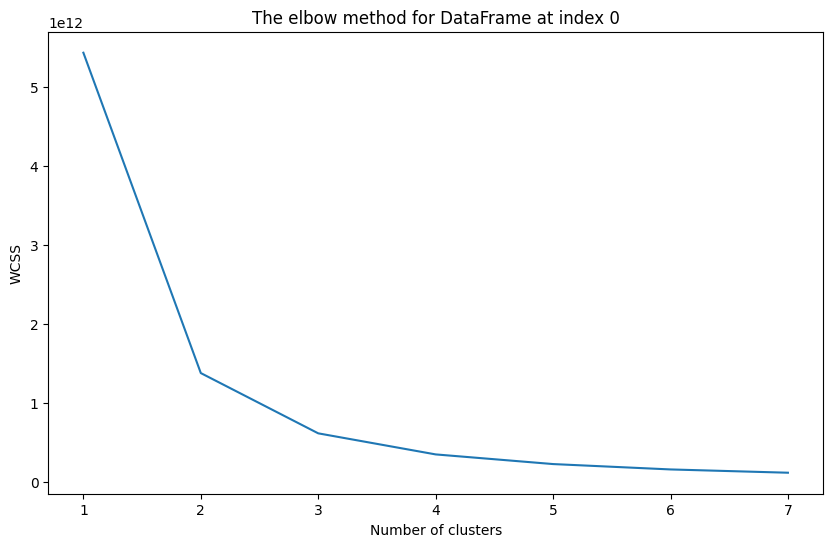

For cluster = 1, SSE/WCSS is 5263327966730.344
For cluster = 2, SSE/WCSS is 1337304346017.7678
For cluster = 3, SSE/WCSS is 597819471028.666
For cluster = 4, SSE/WCSS is 337213929955.59894
For cluster = 5, SSE/WCSS is 218040268461.5934
For cluster = 6, SSE/WCSS is 152412962075.74088
For cluster = 7, SSE/WCSS is 111243598741.43729


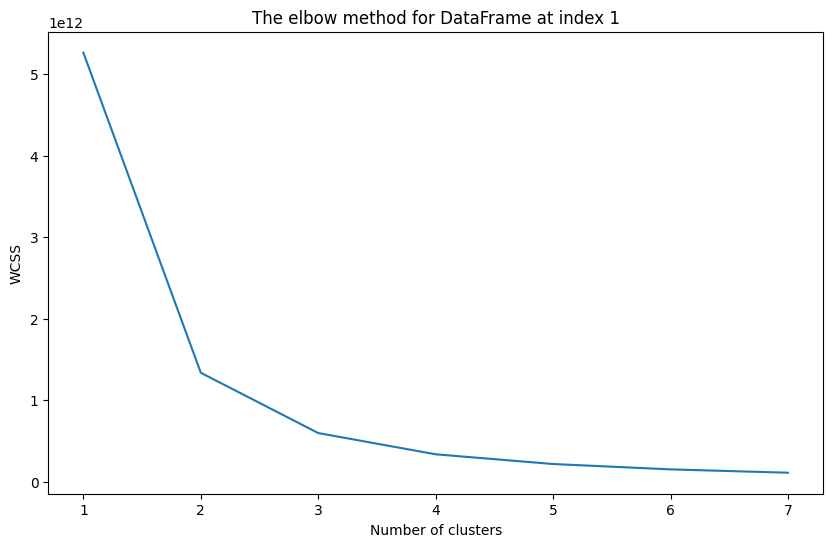

For cluster = 1, SSE/WCSS is 5428864478931.287
For cluster = 2, SSE/WCSS is 1375205856718.4563
For cluster = 3, SSE/WCSS is 612483962173.4102
For cluster = 4, SSE/WCSS is 345848326638.2108
For cluster = 5, SSE/WCSS is 223649483009.15332
For cluster = 6, SSE/WCSS is 155694348776.2604
For cluster = 7, SSE/WCSS is 114133068059.3466


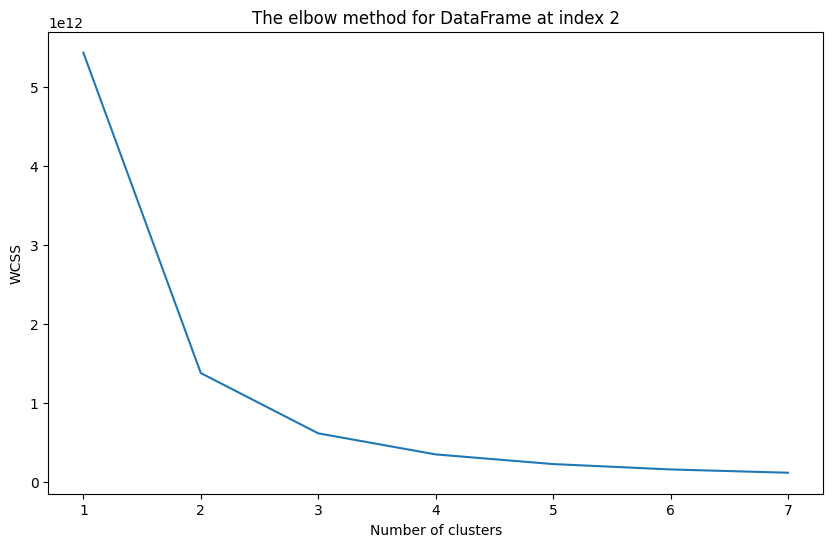

For cluster = 1, SSE/WCSS is 5263327959470.654
For cluster = 2, SSE/WCSS is 1337304339162.6516
For cluster = 3, SSE/WCSS is 597819463861.7317
For cluster = 4, SSE/WCSS is 337213924243.1143
For cluster = 5, SSE/WCSS is 218040262941.30795
For cluster = 6, SSE/WCSS is 152412948221.31375
For cluster = 7, SSE/WCSS is 111243588477.03735


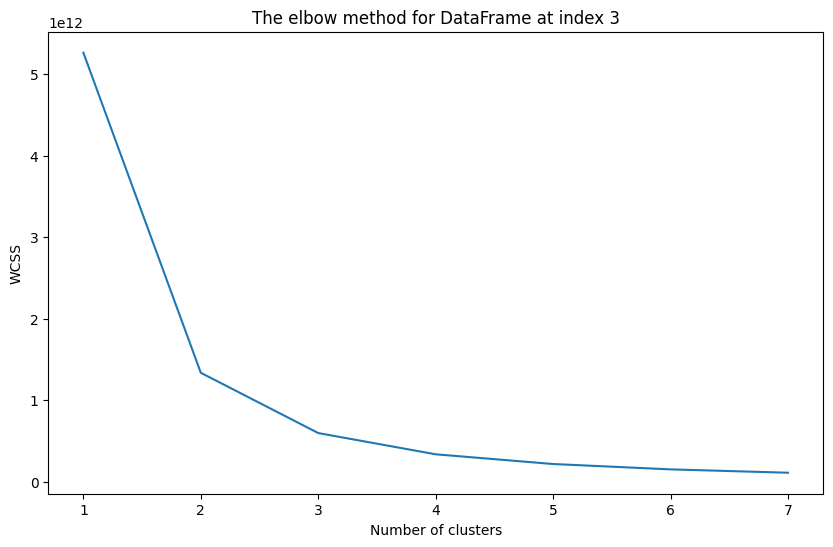

For cluster = 1, SSE/WCSS is 5428864483572.027
For cluster = 2, SSE/WCSS is 1375205861168.9927
For cluster = 3, SSE/WCSS is 612483967290.7874
For cluster = 4, SSE/WCSS is 345848330434.61334
For cluster = 5, SSE/WCSS is 223649486794.54584
For cluster = 6, SSE/WCSS is 155694360121.2919
For cluster = 7, SSE/WCSS is 114133076312.55525


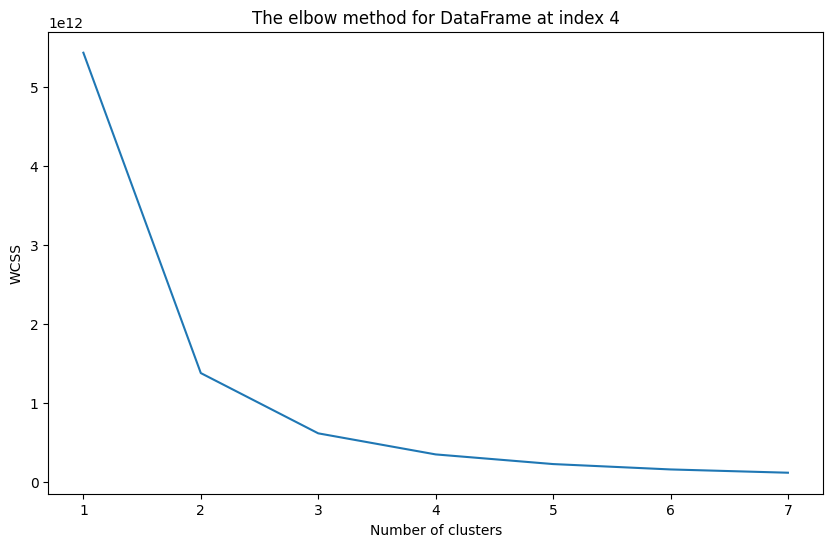

For cluster = 1, SSE/WCSS is 5263327964085.74
For cluster = 2, SSE/WCSS is 1337304343415.4158
For cluster = 3, SSE/WCSS is 597819468119.8335
For cluster = 4, SSE/WCSS is 337213927841.51605
For cluster = 5, SSE/WCSS is 218040266282.79175
For cluster = 6, SSE/WCSS is 152412955070.5372
For cluster = 7, SSE/WCSS is 111243593875.63383


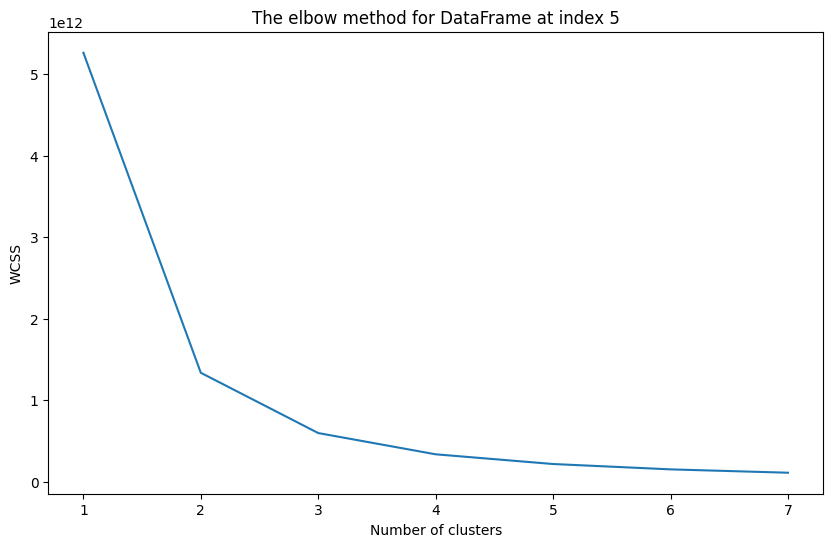

For cluster = 1, SSE/WCSS is 5428864484140.03
For cluster = 2, SSE/WCSS is 1375205861736.4634
For cluster = 3, SSE/WCSS is 612483967846.2625
For cluster = 4, SSE/WCSS is 345848330984.3092
For cluster = 5, SSE/WCSS is 223649487239.694
For cluster = 6, SSE/WCSS is 155694360745.54626
For cluster = 7, SSE/WCSS is 114133076849.47186


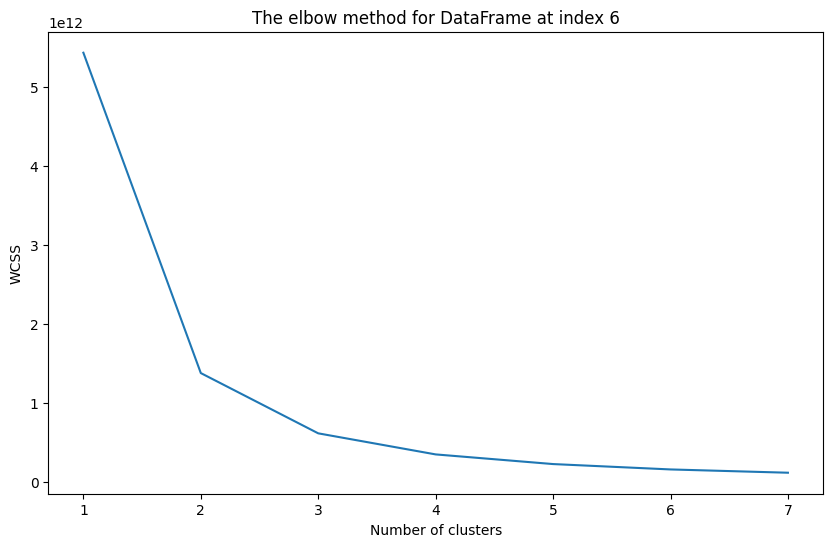

For cluster = 1, SSE/WCSS is 5263327964165.787
For cluster = 2, SSE/WCSS is 1337304343453.5156
For cluster = 3, SSE/WCSS is 597819468154.6743
For cluster = 4, SSE/WCSS is 337213927861.99536
For cluster = 5, SSE/WCSS is 218040266299.66434
For cluster = 6, SSE/WCSS is 152412955084.28647
For cluster = 7, SSE/WCSS is 111243593893.63956


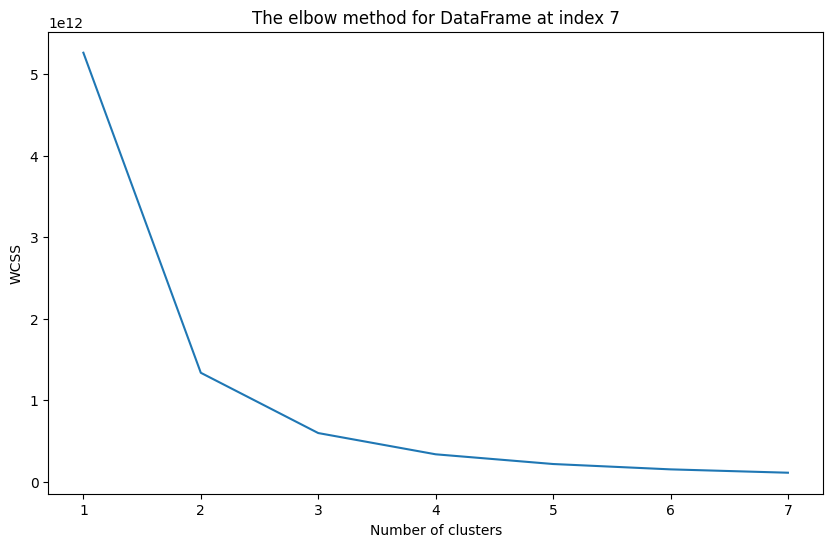

For cluster = 1, SSE/WCSS is 5263327964165.787
For cluster = 2, SSE/WCSS is 1337304343453.5156
For cluster = 3, SSE/WCSS is 597819468154.6743
For cluster = 4, SSE/WCSS is 337213927861.99536
For cluster = 5, SSE/WCSS is 218040266299.66434
For cluster = 6, SSE/WCSS is 152412955084.28647
For cluster = 7, SSE/WCSS is 111243593893.63956


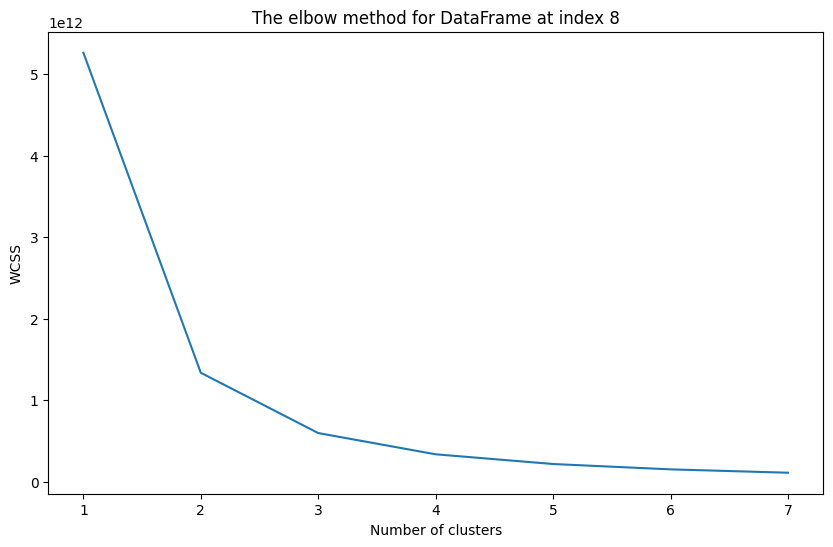

For cluster = 1, SSE/WCSS is 5263327964165.787
For cluster = 2, SSE/WCSS is 1337304343453.5156
For cluster = 3, SSE/WCSS is 597819468154.6741
For cluster = 4, SSE/WCSS is 337213927861.9951
For cluster = 5, SSE/WCSS is 218040266299.66412
For cluster = 6, SSE/WCSS is 152412955084.28607
For cluster = 7, SSE/WCSS is 111243593893.63948


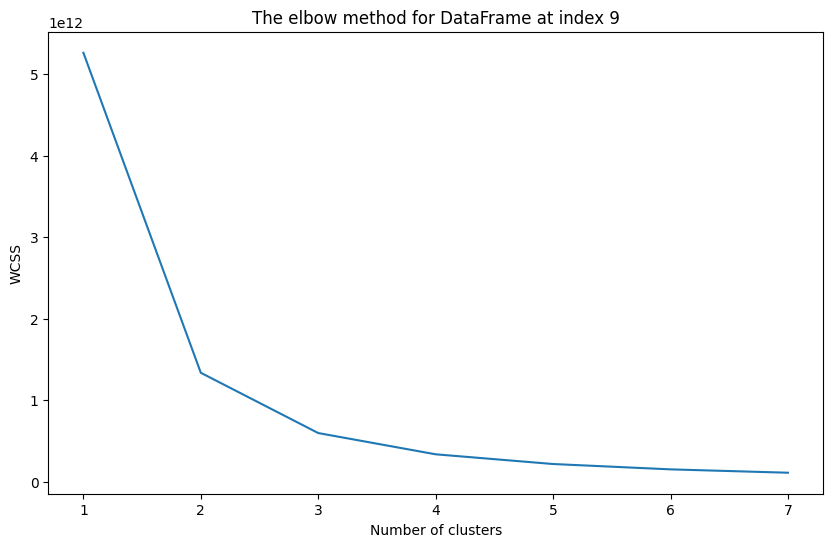

For cluster = 1, SSE/WCSS is 5263327964165.787
For cluster = 2, SSE/WCSS is 1337304343453.5176
For cluster = 3, SSE/WCSS is 597819468154.6749
For cluster = 4, SSE/WCSS is 337213927861.9958
For cluster = 5, SSE/WCSS is 218040266299.6642
For cluster = 6, SSE/WCSS is 152412955084.28647
For cluster = 7, SSE/WCSS is 111243593893.63971


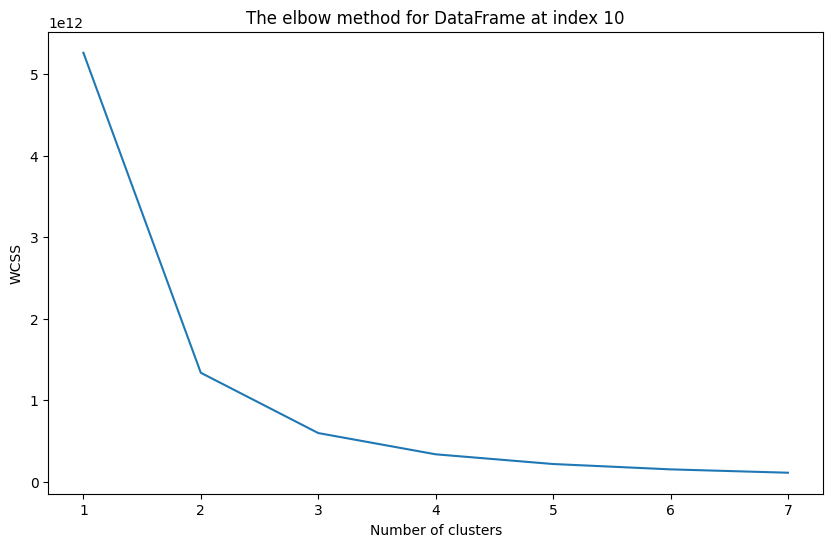

In [ ]:
# Iterate over df_with_pca list
for i in range(len(df_final_list_with_pca)):
  elbow_method(df_final_list_with_pca[i], i)

In [378]:
def silhouette_method(df, index_of_df):
  print(f"Silhouette Method for DataFrame at {index_of_df}")
  for k in range(2, 8):
    kmeans = KMeans(n_clusters= k,max_iter=100).fit(df)
    label = kmeans.labels_
    sil_coeff = silhouette_score(df,label,metric = 'euclidean')
    print('For cluster= {}, Silhouette Coefficient is {}'.format(k,sil_coeff))

  print('- ' * 15)

In [379]:
silhouette_method(df_list_no_pca[2], 2)

Silhouette Method for DataFrame at 2
For cluster= 2, Silhouette Coefficient is 0.5235529488373639
For cluster= 3, Silhouette Coefficient is 0.39857956511507847
For cluster= 4, Silhouette Coefficient is 0.30987765043312115
For cluster= 5, Silhouette Coefficient is 0.2893448620373118
For cluster= 6, Silhouette Coefficient is 0.2841575412981335
For cluster= 7, Silhouette Coefficient is 0.24184942397546533
- - - - - - - - - - - - - - - 


In [ ]:
for i in range(len(df_final_list_with_pca)):
  silhouette_method(df_final_list_with_pca[i], i)

Silhouette Method for DataFrame at 0
For cluster= 2, Silhouette Coefficient is 0.6239177131640968
For cluster= 3, Silhouette Coefficient is 0.5884285290127197
For cluster= 4, Silhouette Coefficient is 0.5702321184895097
For cluster= 5, Silhouette Coefficient is 0.5568405848884735
For cluster= 6, Silhouette Coefficient is 0.5493298895199873
For cluster= 7, Silhouette Coefficient is 0.5441469923323056
- - - - - - - - - - - - - - - 
Silhouette Method for DataFrame at 1
For cluster= 2, Silhouette Coefficient is 0.6233422310851977
For cluster= 3, Silhouette Coefficient is 0.5870958032495417
For cluster= 4, Silhouette Coefficient is 0.5696518869017843
For cluster= 5, Silhouette Coefficient is 0.5566414877858388
For cluster= 6, Silhouette Coefficient is 0.5476463844230025
For cluster= 7, Silhouette Coefficient is 0.5457560251756308
- - - - - - - - - - - - - - - 
Silhouette Method for DataFrame at 2
For cluster= 2, Silhouette Coefficient is 0.6239216877263171
For cluster= 3, Silhouette Coeffic

In [380]:
def visualize_silhouette(cluster_lists, X_features, index_of_df):
    print(f"Silhouette Plot for DataFrame at {index_of_df}")
    n_cols = len(cluster_lists)
    fig, axs = plt.subplots(figsize=(4*n_cols, 4), nrows=1, ncols=n_cols)

    for ind, n_cluster in enumerate(cluster_lists):
        clusterer = KMeans(n_clusters = n_cluster, max_iter=500, random_state=0, init = 'k-means++')
        cluster_labels = clusterer.fit_predict(X_features)

        sil_avg = silhouette_score(X_features, cluster_labels)
        sil_values = silhouette_samples(X_features, cluster_labels)

        y_lower = 10
        axs[ind].set_title('Number of Cluster : '+ str(n_cluster)+'\n' \
                          'Silhouette Score :' + str(round(sil_avg,3)) )
        axs[ind].set_xlabel("The silhouette coefficient values")
        axs[ind].set_ylabel("Cluster label")
        axs[ind].set_xlim([-0.1, 1])
        axs[ind].set_ylim([0, len(X_features) + (n_cluster + 1) * 10])
        axs[ind].set_yticks([])  # Clear the yaxis labels / ticks
        axs[ind].set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

        for i in range(n_cluster):
            ith_cluster_sil_values = sil_values[cluster_labels==i]
            ith_cluster_sil_values.sort()

            size_cluster_i = ith_cluster_sil_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_cluster)
            axs[ind].fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_sil_values, \
                                facecolor=color, edgecolor=color, alpha=0.7)
            axs[ind].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        axs[ind].axvline(x=sil_avg, color="red", linestyle="--")

In [ ]:
for i in range(len(df_list_no_pca)):
  visualize_silhouette([2, 3, 4, 5, 6, 7], df_list_no_pca[i], i)

In [ ]:
for i in range(len(df_final_list_with_pca)):
  visualize_silhouette([2, 3, 4, 5, 6, 7], df_final_list_with_pca[i], i)

Silhouette Plot for DataFrame at 2


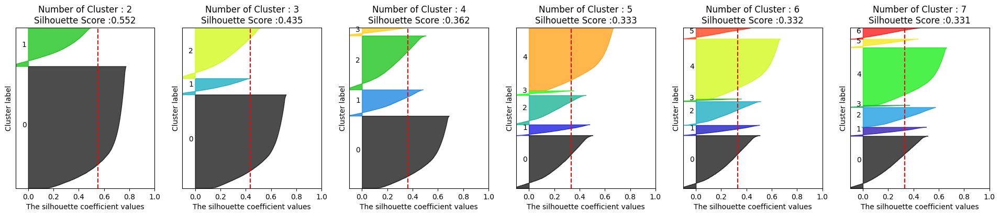

In [381]:
visualize_silhouette([2, 3, 4, 5, 6, 7], df_list_with_pca[2], 2)

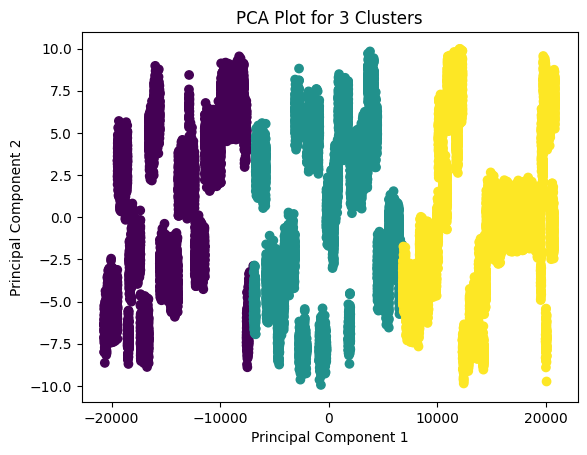

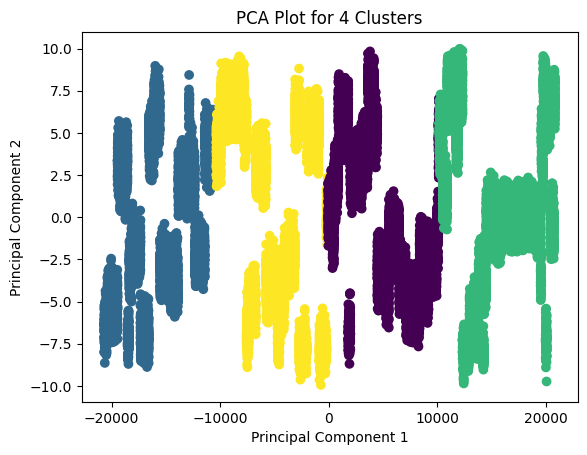

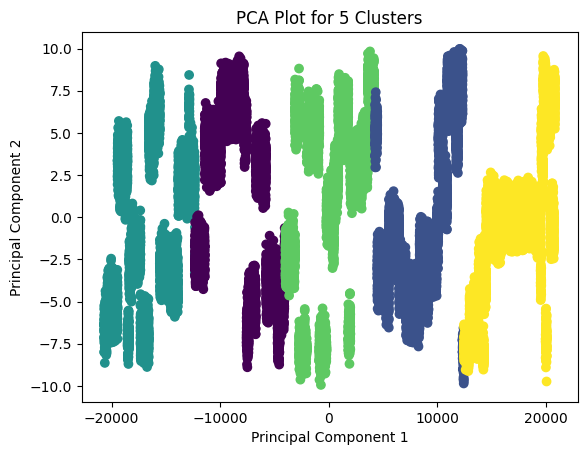

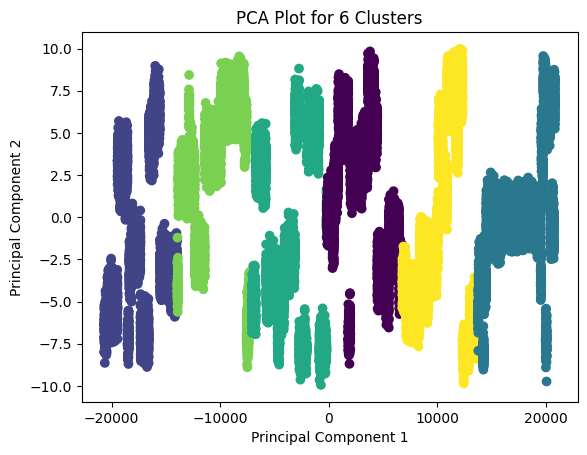

In [ ]:
# Train a KMeans Model
for i in range(3, 7):
  kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300,
                  n_init = 10, random_state = 0)
  df_orig_feature_pca = kmeans.fit_predict(df_list_with_pca[29])
  plt.scatter(df_list_with_pca[29][:, 0], df_list_with_pca[29][:, 1], c=kmeans.labels_)
  plt.xlabel('Principal Component 1')
  plt.ylabel('Principal Component 2')
  plt.title(f'PCA Plot for {i} Clusters')
  plt.show()

In [386]:
pca = PCA(n_components=3)
df_pca = pca.fit_transform(df_list_no_pca[2])

In [387]:
# Print PCA Loading
print(pca.components_)

[[ 6.98752282e-01  1.59795694e-01  4.09335145e-08  2.31795034e-02
   1.52425056e-02  2.90157345e-02  1.41800679e-02  4.54722368e-03
   5.87403516e-03  5.07354917e-02  1.63058899e-03  2.26796799e-03
   1.28703486e-02  9.59241436e-02  4.95879109e-02  2.47467459e-02
   3.36574922e-02  1.37281524e-02  2.87584788e-02  3.80948681e-02
   1.50492821e-02  2.02934815e-02  1.35327641e-01  4.76987076e-07
   3.77575503e-06  2.82059156e-06  1.98164788e-08  2.10606105e-07
   1.37265068e-06 -2.98733979e-07  4.79926283e-07  7.69136252e-07
   6.31323425e-05  9.20639925e-06  1.69238317e-06  2.29741508e-07
   5.69991627e-07  4.22767477e-07  1.22432393e-06  1.23462197e-06
   9.33885115e-07  4.00299511e-07  1.29032355e-06  1.20573696e-06
   3.16466553e-07  2.14308032e-07  1.65865318e-07  4.19156366e-06
   1.25226352e-06  4.13644740e-07 -5.26998082e-09  7.35360630e-07
   7.93699776e-03  3.76904188e-01  1.20648547e-01  4.97552735e-01
   1.23005737e-07 -6.48206085e-08 -1.92393892e-09 -4.93661045e-08
  -3.00963

In [388]:
# Analyze feature contributions to principal components
print("\nTop feature contributions to principal components:")
# Change component_names to reflect the number of components
component_names = [f"PC{i+1}" for i in range(pca.n_components_)]
# Now component_names will have 15 column names (PC1 to PC15)
loadings = pd.DataFrame(pca.components_.T, columns=component_names, index=df_list_no_pca[2].columns)


Top feature contributions to principal components:


In [389]:
for i, pc in enumerate(component_names):
    sorted_loadings = loadings[pc].abs().sort_values(ascending=False)
    print(f"\n{pc} explains {pca.explained_variance_ratio_[i]:.2%} of variance")
    print(f"Top contributing features:")
    for j, (feature, loading) in enumerate(sorted_loadings.head(5).items()):
        sign = '+' if loadings.loc[feature, pc] > 0 else '-'
        print(f"  {j+1}. {feature}: {sign}{abs(loadings.loc[feature, pc]):.3f}")


PC1 explains 71.87% of variance
Top contributing features:
  1. Total Household Income: +0.699
  2. Total Expenditure: +0.498
  3. Total_Essential_Spending: +0.377
  4. Remaining_Income: +0.206
  5. Total Food Expenditure: +0.160

PC2 explains 12.38% of variance
Top contributing features:
  1. Remaining_Income: +0.645
  2. Total Expenditure: -0.444
  3. Total_Essential_Spending: -0.389
  4. Total Household Income: +0.384
  5. Amount_Outside_Income: -0.183

PC3 explains 8.56% of variance
Top contributing features:
  1. Total Income from Entrepreneurial Acitivites: +0.940
  2. Crop Farming and Gardening expenses: +0.238
  3. Total Household Income: -0.131
  4. Total_NonEssential_Spending: -0.107
  5. Amount_Outside_Income: +0.100


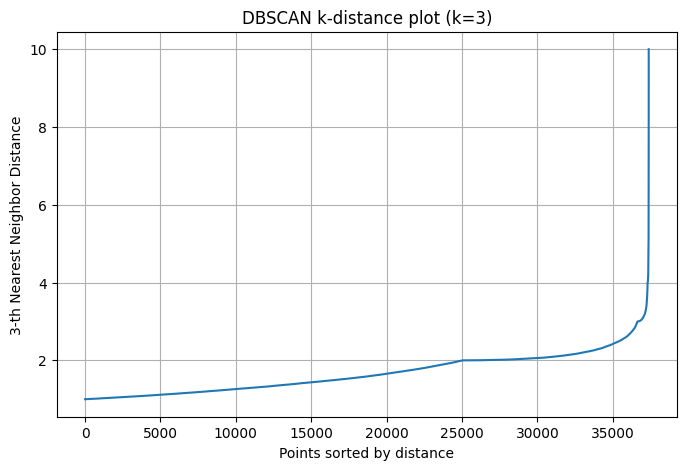

Suggested eps for DBSCAN: 2.2498


In [ ]:
def find_optimal_eps(data, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(data)
    distances, _ = neigh.kneighbors(data)

    k_distances = np.sort(distances[:, k-1])

    plt.figure(figsize=(8, 5))
    plt.plot(k_distances)
    plt.xlabel("Points sorted by distance")
    plt.ylabel(f"{k}-th Nearest Neighbor Distance")
    plt.title(f"DBSCAN k-distance plot (k={k})")
    plt.grid(True)
    plt.show()

    return k_distances[int(len(k_distances) * 0.9)]

optimal_eps = find_optimal_eps(df_list_with_pca[29], k=3)
print(f"Suggested eps for DBSCAN: {optimal_eps:.4f}")

In [ ]:
dbscan = DBSCAN(eps=2.2498, min_samples=3, metric='euclidean')
y_DBScan = dbscan.fit_predict(df_list_with_pca[29])

In [ ]:
labels = dbscan.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_clusters_

1964

In [ ]:
n_noise_ = list(labels).count(-1)
n_noise_

888

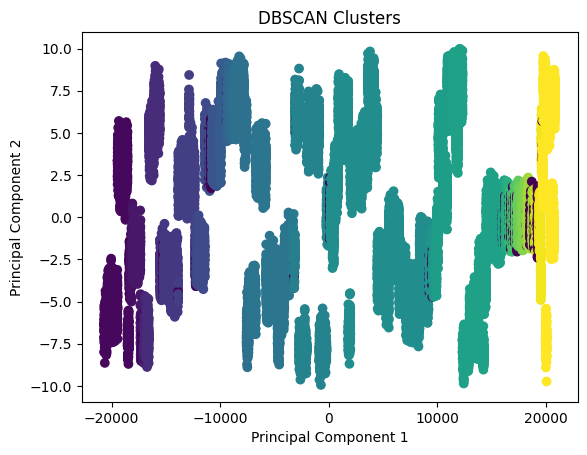

In [ ]:
# Plot DBSCAN Clusters in PCA
plt.scatter(df_list_with_pca[29][:, 0], df_list_with_pca[29][:, 1], c=labels)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('DBSCAN Clusters')
plt.show()

In [ ]:
silhouette_score = metrics.silhouette_score(df_list_with_pca[29], labels)
silhouette_score

0.22678361298003813

# Profiling / Describing the Clusters

In [ ]:
# Fetch the K-means cluster labels
cluster_labels = kmeans.labels_

In [ ]:
# Locate indices from df_non_outliers and store created clusters
df['Cluster'] = cluster_labels

In [ ]:
# Profiling columns
expenditure_columns = ['Total Food Expenditure', 'Restaurant and hotels Expenditure',
                                'Housing and water Expenditure', 'Alcoholic Beverages Expenditure',
                                'Tobacco Expenditure', 'Clothing, Footwear and Other Wear Expenditure',
                                'Miscellaneous Goods and Services Expenditure', 'Special Occasions Expenditure', 'Medical Care Expenditure',
                                'Education Expenditure', 'Communication Expenditure', 'Transportation Expenditure', 'Crop Farming and Gardening expenses',
                                'Total_Essential_Spending', 'Total_NonEssential_Spending', 'Total Expenditure']

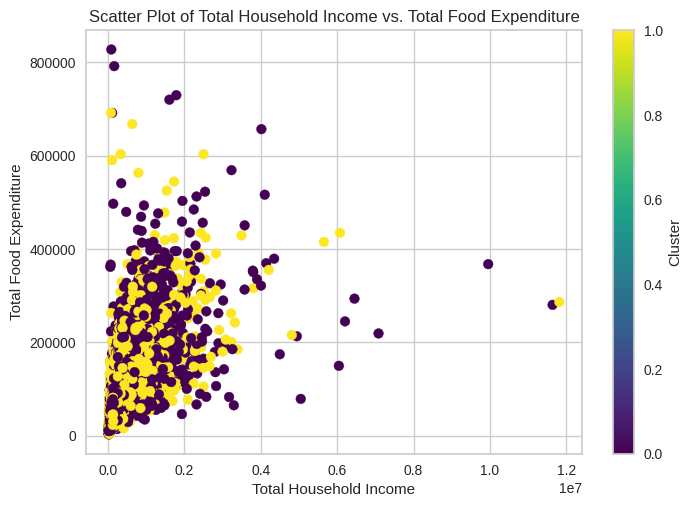

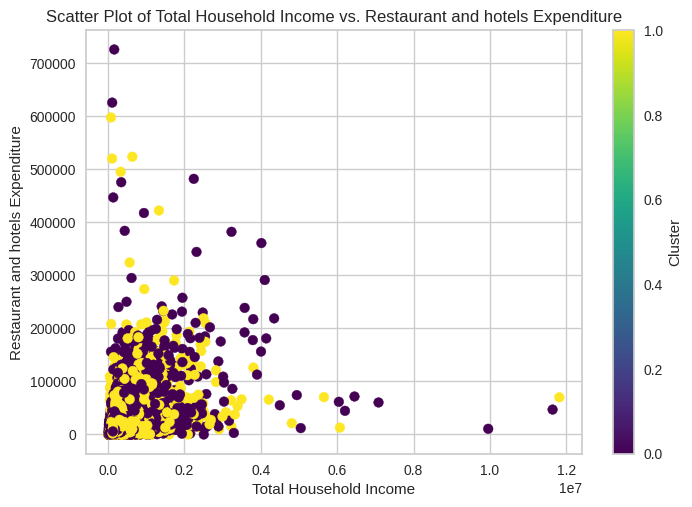

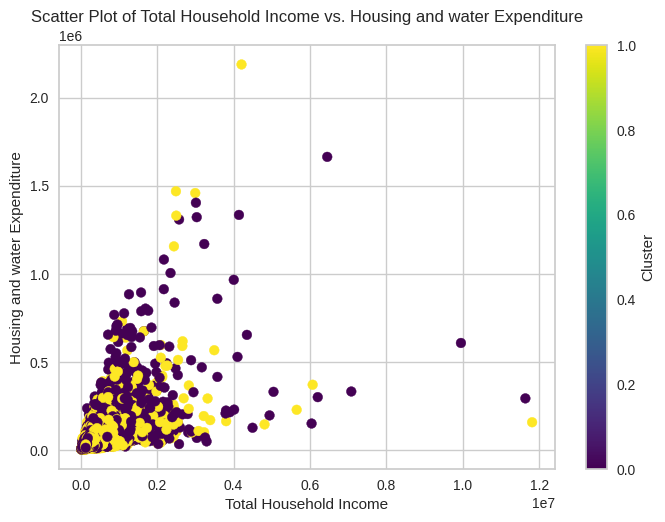

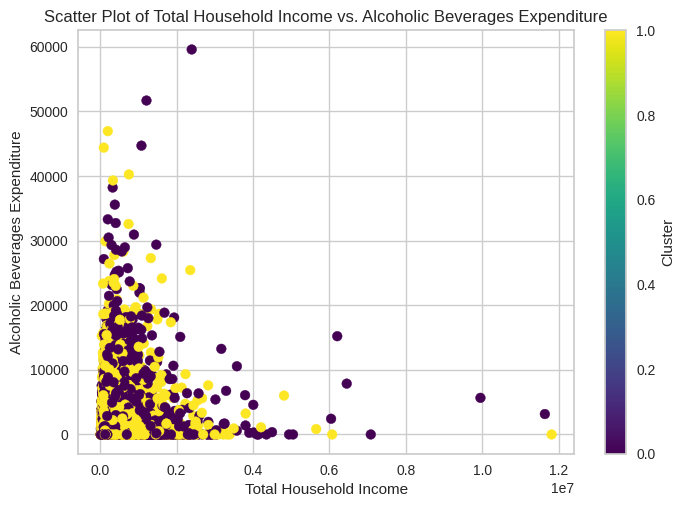

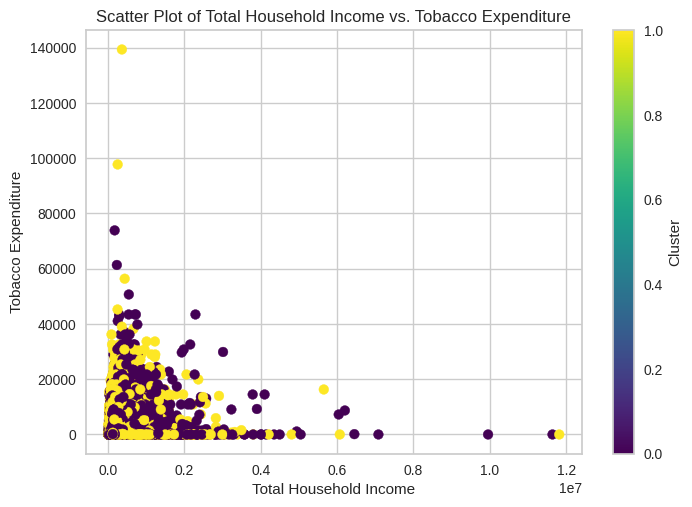

...

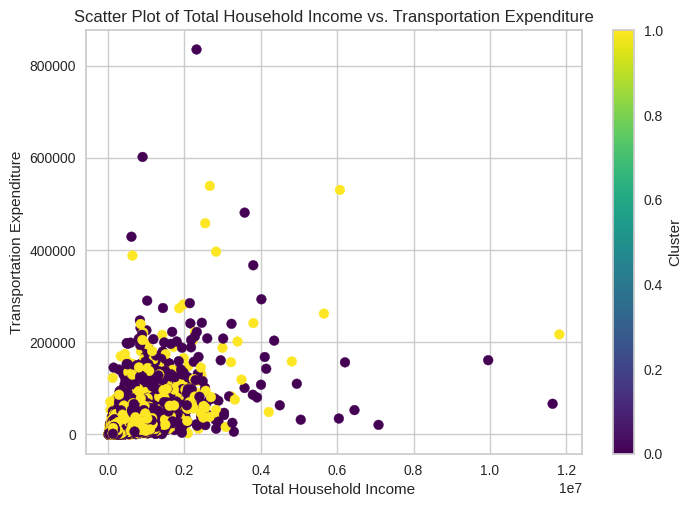

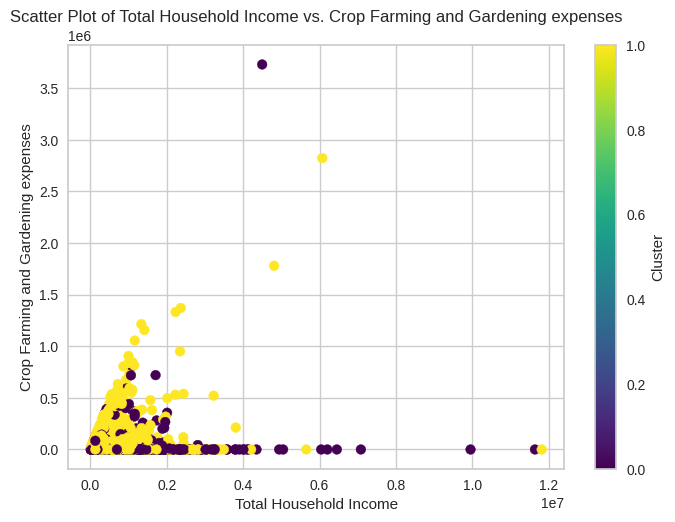

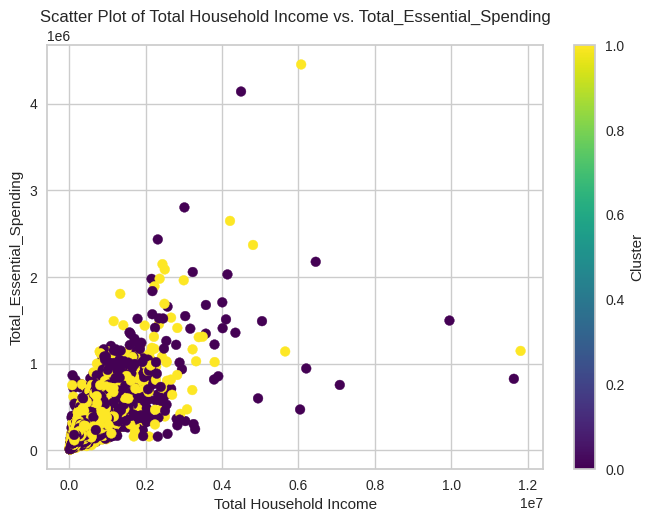

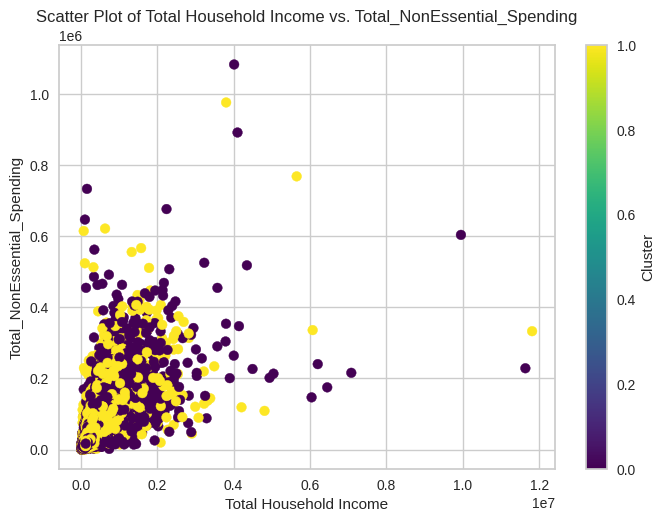

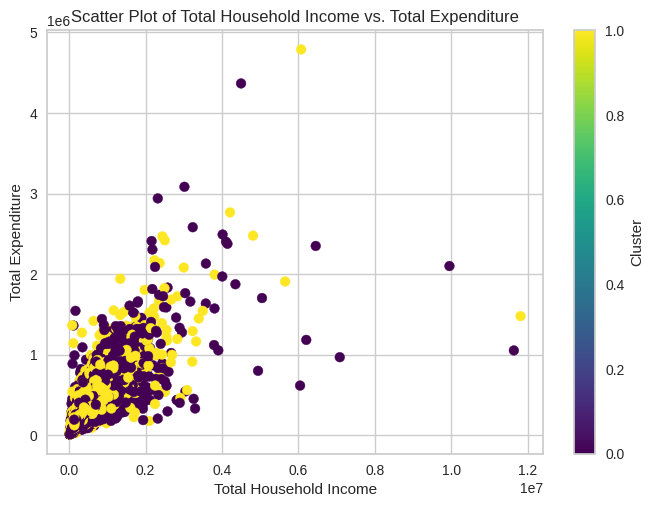

In [ ]:
# Scatter plot of Total Household Income versus each column in expenditure columns. Color code and label the dots based on 'Cluster' column
for column in expenditure_columns:
    plt.scatter(df['Total Household Income'], df[column], c=df['Cluster'], cmap='viridis')
    plt.xlabel('Total Household Income')
    plt.ylabel(column)
    plt.title(f'Scatter Plot of Total Household Income vs. {column}')
    plt.colorbar(label='Cluster')
    plt.show()

In [ ]:
# Display Mean values for each expenditure column, group by cluster
df.groupby('Cluster')[expenditure_columns].mean()

,Total Food Expenditure,Restaurant and hotels Expenditure,Housing and water Expenditure,Alcoholic Beverages Expenditure,Tobacco Expenditure,"Clothing, Footwear and Other Wear Expenditure",Miscellaneous Goods and Services Expenditure,Special Occasions Expenditure,Medical Care Expenditure,Education Expenditure,Communication Expenditure,Transportation Expenditure,Crop Farming and Gardening expenses,Total_Essential_Spending,Total_NonEssential_Spending,Total Expenditure
Cluster,,,,,,,,,,,,,,,,
0,92095.422353,18906.127639,47345.230869,1048.898817,2194.836220,5486.215295,14217.780662,5818.931563,9303.720561,8543.273449,5176.426696,13686.412719,3850.754355,180001.241002,47672.790196,227674.031199
1,78600.636998,12202.478354,30029.529932,1118.926543,2387.208547,4462.312029,10950.994042,4754.020296,5168.672796,6485.425100,3091.817987,10062.912485,23128.456289,156567.451587,35875.939810,192443.391397


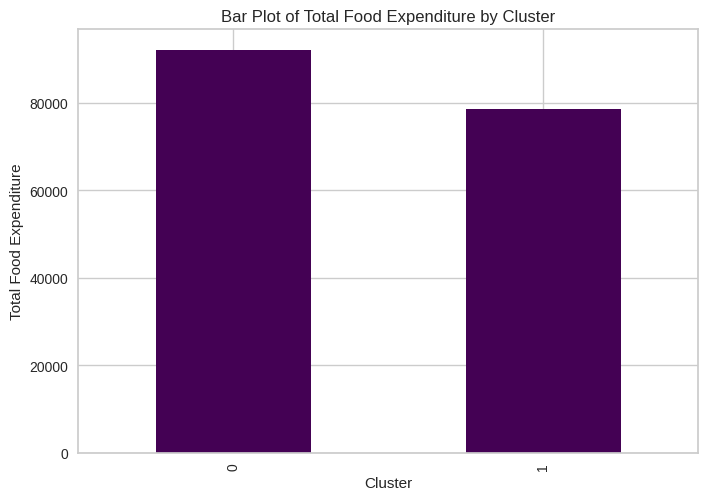

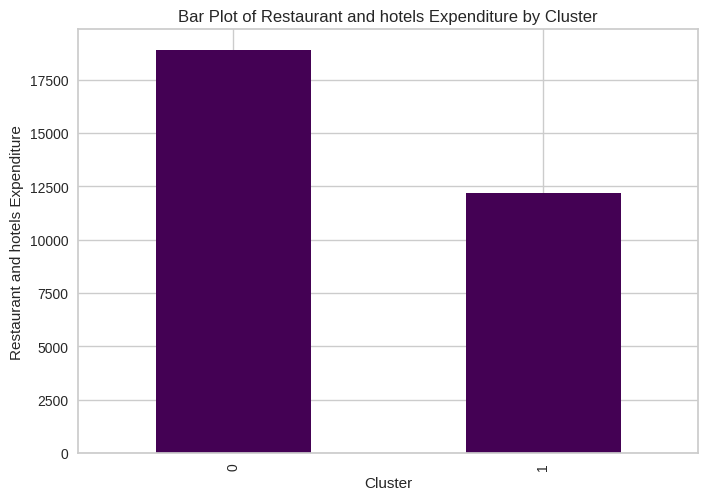

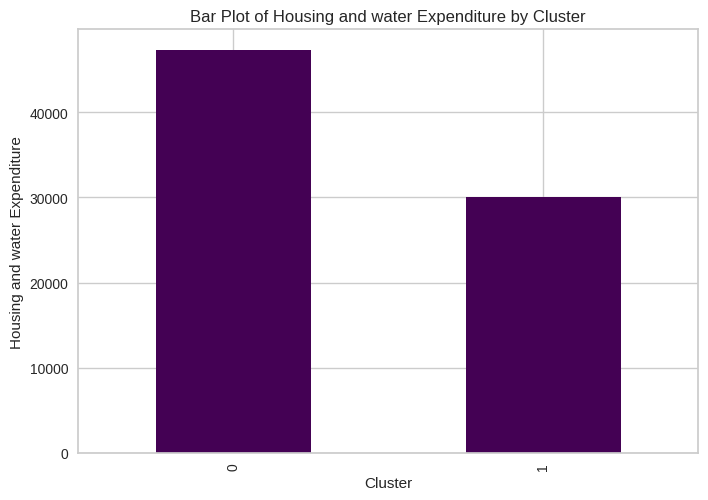

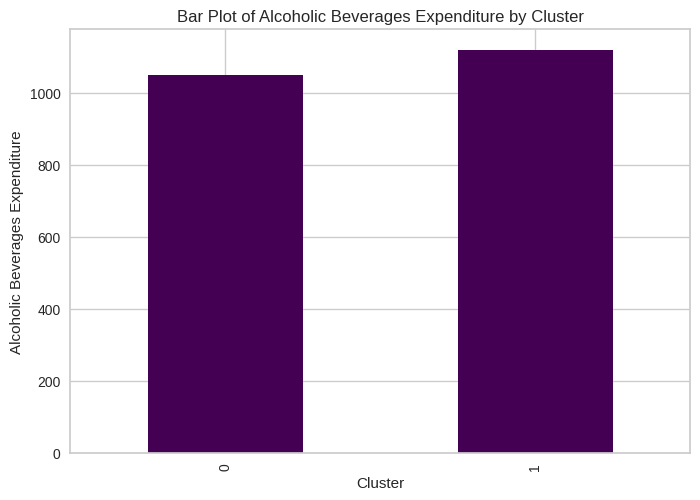

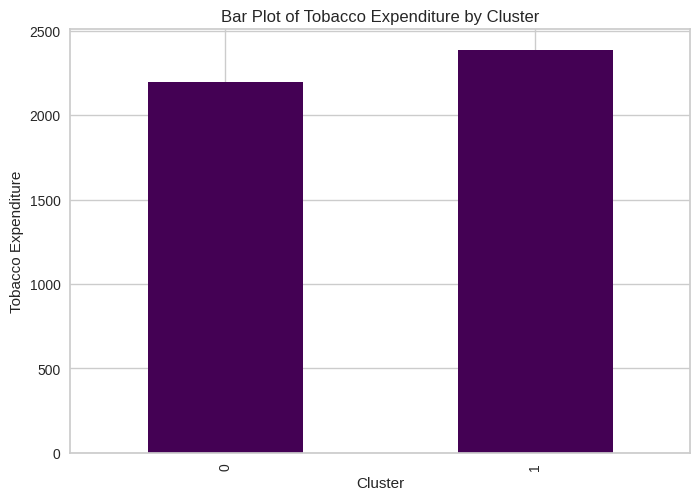

...

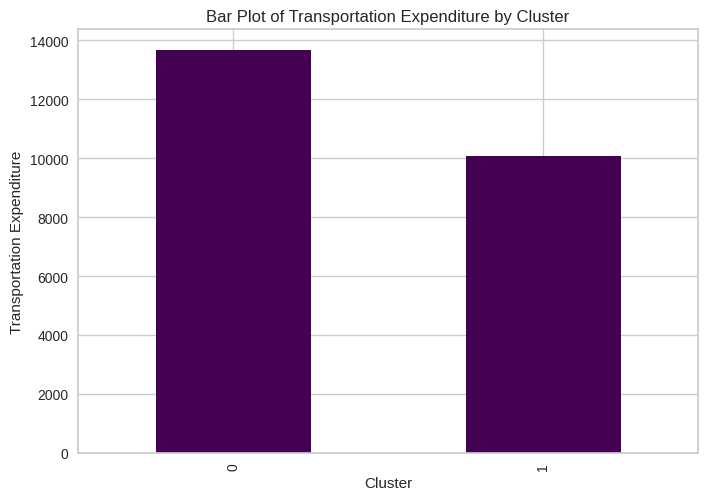

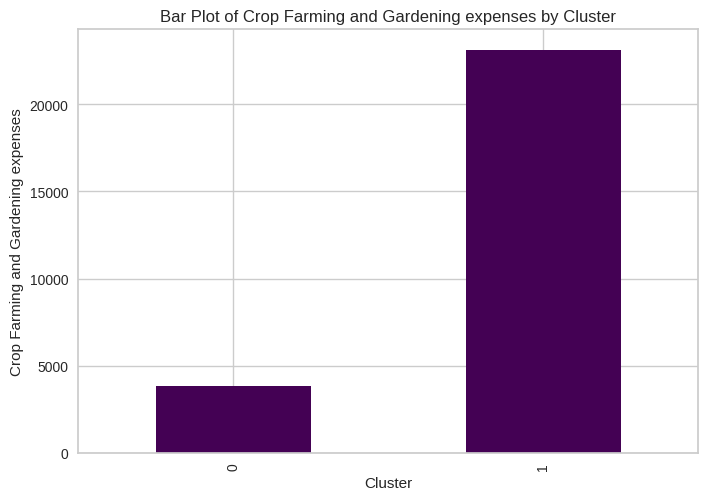

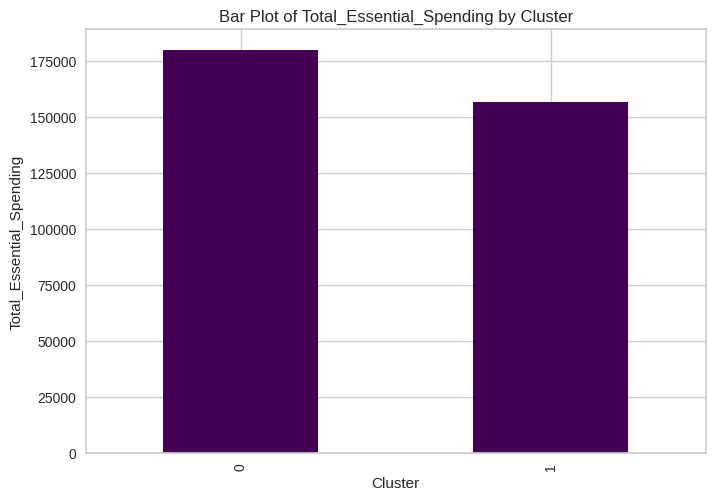

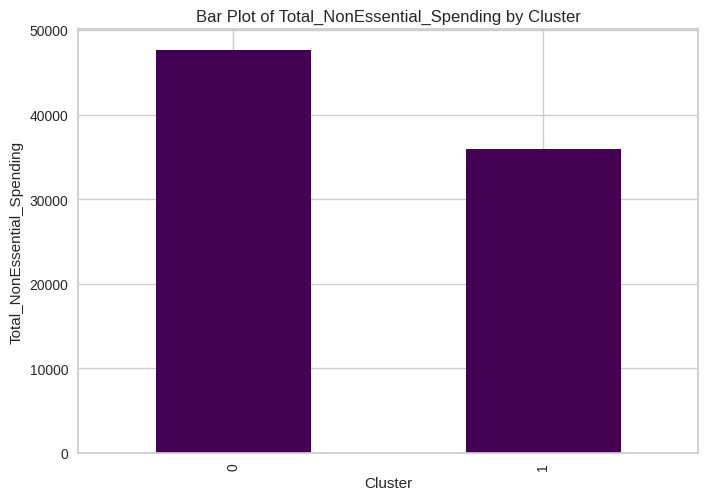

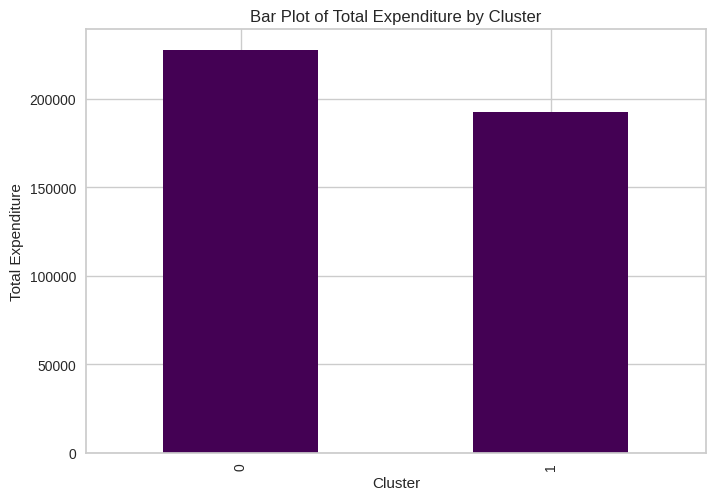

In [ ]:
# Bar Plot for Expenditure Columns, based on Cluster and color coded
for column in expenditure_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

In [ ]:
# Display Mean values for each income column, group by cluster
df.groupby('Cluster')[income_columns].mean()

,Total Household Income,Total Income from Entrepreneurial Acitivites,Remaining_Income,Amount_Outside_Income
Cluster,,,,
0,282099.593571,56485.744422,64312.307942,9886.745570
1,215511.243273,52419.814030,41447.372219,18379.520343


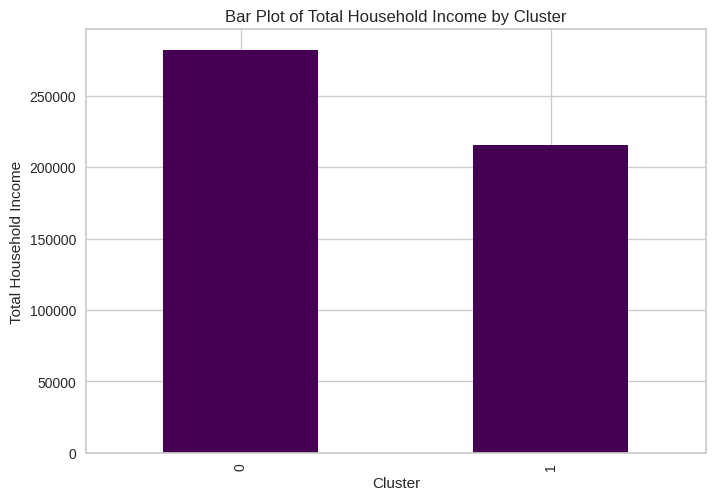

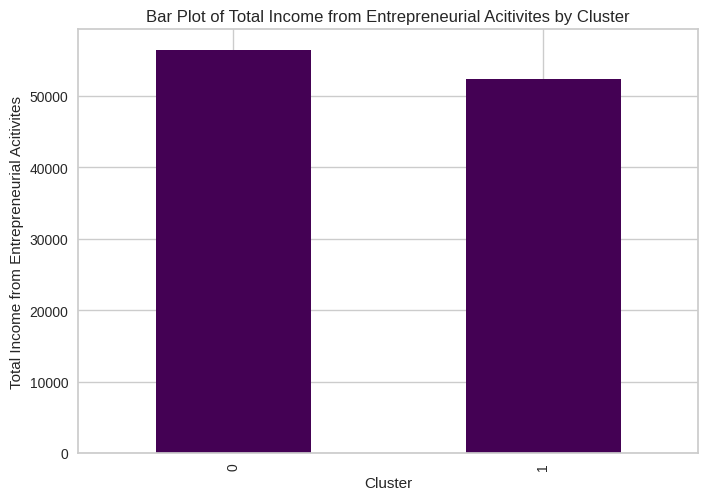

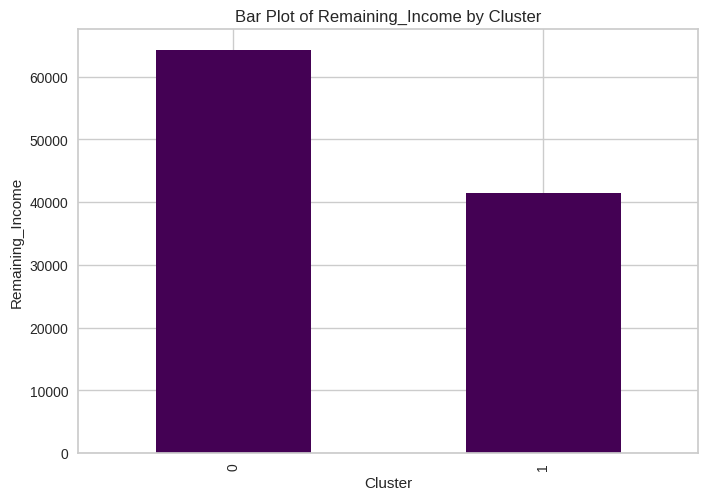

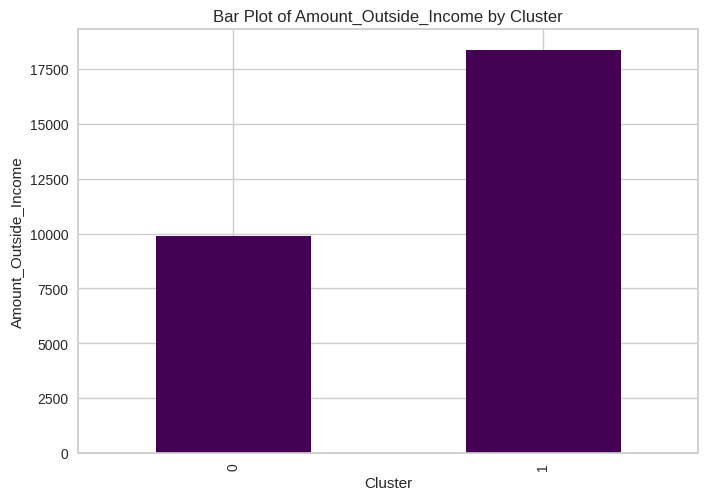

In [ ]:
# Bar Plot for Income Columns, based on Cluster and color coded
for column in income_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

<Figure size 1400x800 with 0 Axes>

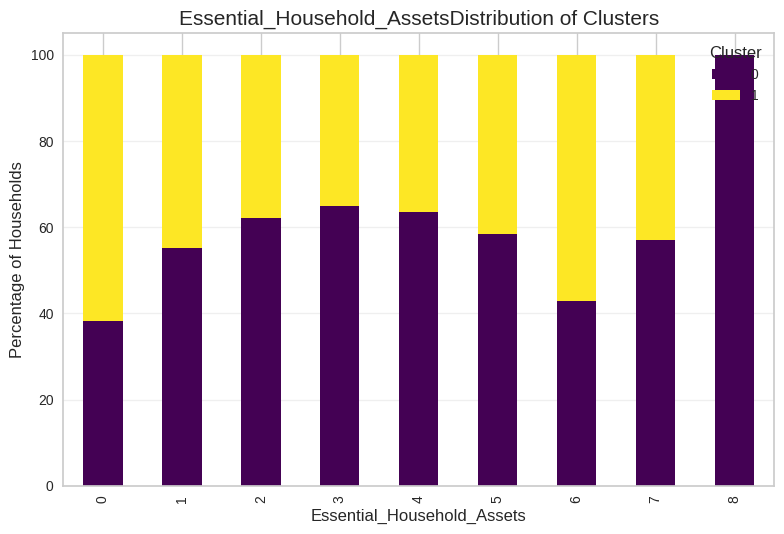

<Figure size 1400x800 with 0 Axes>

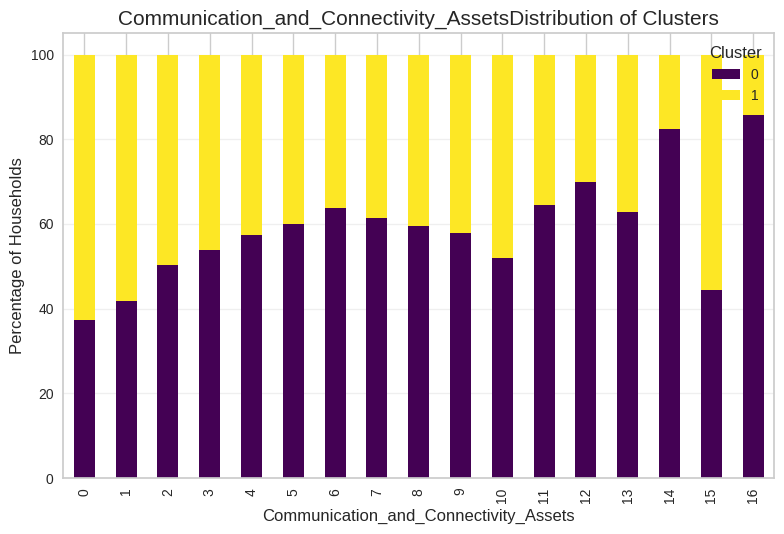

<Figure size 1400x800 with 0 Axes>

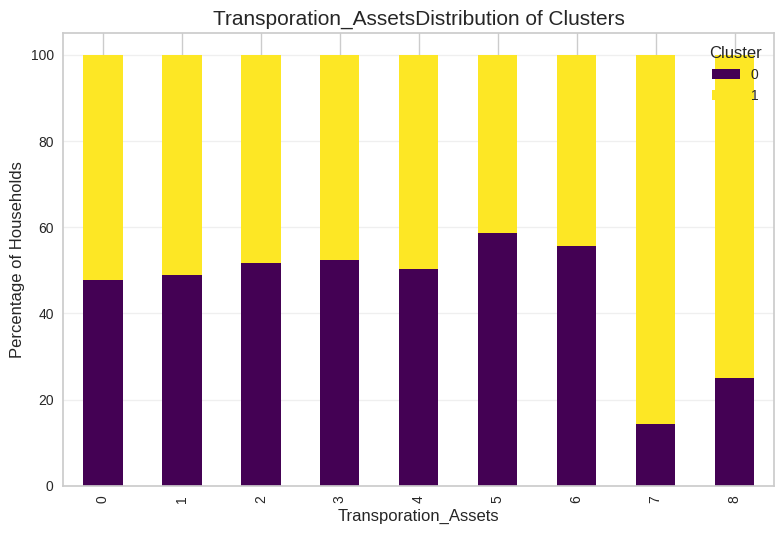

<Figure size 1400x800 with 0 Axes>

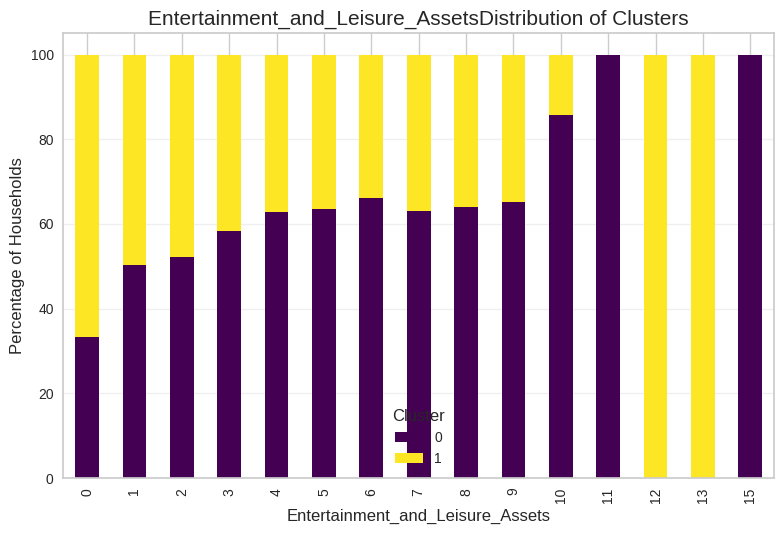

<Figure size 1400x800 with 0 Axes>

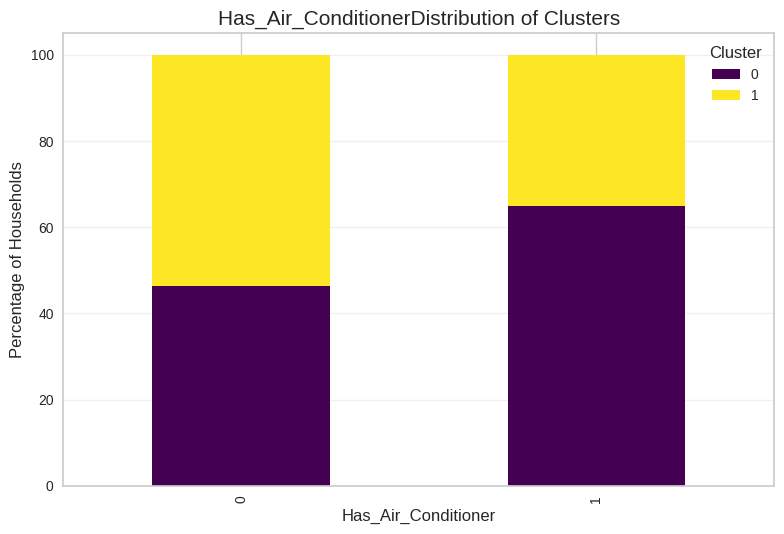

In [ ]:
# Show Distribution of columns per Household Assets per Cluster
for col in household_assets:
  region_cluster_distribution = pd.crosstab(
      df[col],
      df['Cluster'],
      normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col}Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel('Percentage of Households', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()


In [ ]:
# Display Counts per Region, group by cluster
df.groupby('Cluster')['Region'].value_counts()

Cluster  Region                   
0        NCR                          2867
         IVA - CALABARZON             2550
         III - Central Luzon          1968
         VI - Western Visayas         1317
         VII - Central Visayas        1266
         I - Ilocos Region            1213
         XI - Davao Region            1120
         V - Bicol Region             1059
         VIII - Eastern Visayas       1015
         XII - SOCCSKSARGEN            871
         X - Northern Mindanao         824
         Caraga                        779
         II - Cagayan Valley           774
         IX - Zasmboanga Peninsula     713
         CAR                           629
          ARMM                         603
         IVB - MIMAROPA                465
1         ARMM                        1643
         IVA - CALABARZON             1609
         VI - Western Visayas         1532
         II - Cagayan Valley          1445
         V - Bicol Region             1412
         XI - Davao Region            1324
         VIII - Eastern Visayas       1321
         VII - Central Visayas        1275
         III - Central Luzon          1268
         NCR                          1252
         XII - SOCCSKSARGEN           1248
         I - Ilocos Region            1133
         CAR                          1096
         IX - Zasmboanga Peninsula    1074
         X - Northern Mindanao        1063
         Caraga                       1003
         IVB - MIMAROPA                784
Name: count, dtype: int64

<Figure size 1400x800 with 0 Axes>

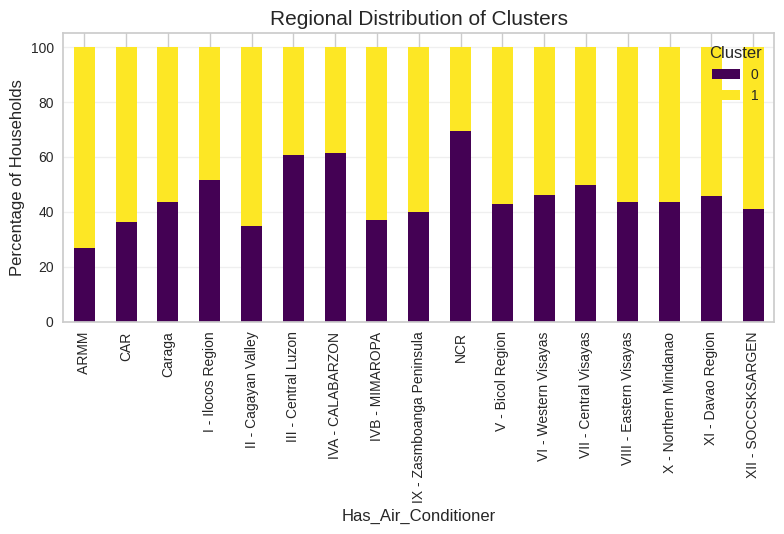

In [ ]:
region_cluster_distribution = pd.crosstab(
    df['Region'],
    df['Cluster'],
    normalize='index'
) * 100

plt.figure(figsize=(14, 8))
region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Regional Distribution of Clusters', fontsize=15)
plt.xlabel(col, fontsize=12)
plt.ylabel('Percentage of Households', fontsize=12)
plt.legend(title='Cluster')
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()


In [ ]:
df.groupby('Cluster')['Household Head Highest Grade Completed'].value_counts()

Cluster  Household Head Highest Grade Completed
0        5                                         5313
         3                                         3329
         2                                         3171
         7                                         3137
         4                                         2381
         6                                         2238
         0                                          369
         8                                           92
         1                                            3
1        2                                         5643
         5                                         4309
         3                                         4306
         4                                         2508
         7                                         2303
         6                                         1389
         0                                          857
         8                                          155
         1                                           12
Name: count, dtype: int64

<Figure size 1400x800 with 0 Axes>

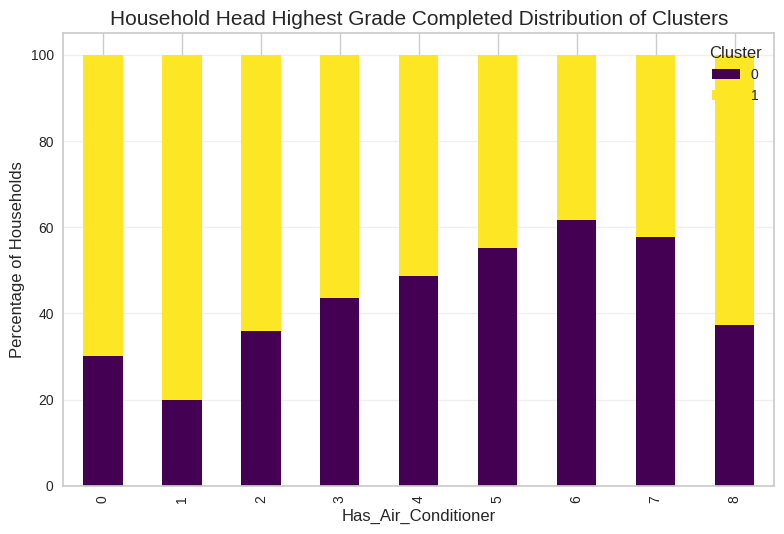

In [ ]:
region_cluster_distribution = pd.crosstab(
    df['Household Head Highest Grade Completed'],
    df['Cluster'],
    normalize='index'
) * 100

plt.figure(figsize=(14, 8))
region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Household Head Highest Grade Completed Distribution of Clusters', fontsize=15)
plt.xlabel(col, fontsize=12)
plt.ylabel('Percentage of Households', fontsize=12)
plt.legend(title='Cluster')
plt.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()


In [ ]:
df.groupby('Cluster')['Household Head Occupation'].value_counts()

Cluster  Household Head Occupation                                           
0        Uncategorized                                                            7536
         Wholesale and retail trade; repair of motor vehicles and motorcycles     4188
         Transportation and storage                                               4170
         Manufacturing                                                            2010
         Other service activities                                                 1227
         Professional, Scientific and Technical Activities                         279
         Human Health and Social Work Activities                                   276
         Mining and quarrying                                                      183
         Information and communication                                              92
         Real estate activities                                                     39
         Water supply, sewerage, waste management and remediation activities        33
1        Agriculture, forestry, and fishing                                      13543
         Construction                                                             2962
         Government and Public Service                                            1521
         Administrative and Support Service Activities                            1470
         Accommodation and food service activities                                 594
         Education                                                                 501
         Financial and insurance activities                                        300
         Electricity, gas, steam and air conditioning supply                       256
         Arts, Entertainment and Recreation                                        217
         Human Health and Social Work Activities                                    91
         Directors and chief executives of corporations                             27
Name: count, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41515 entries, 0 to 41543
Data columns (total 77 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Total Household Income                         41515 non-null  int64 
 1   Region                                         41515 non-null  object
 2   Total Food Expenditure                         41515 non-null  int64 
 3   Main Source of Income                          41515 non-null  object
 4   Agricultural Household indicator               41515 non-null  int64 
 5   Bread and Cereals Expenditure                  41515 non-null  int64 
 6   Total Rice Expenditure                         41515 non-null  int64 
 7   Meat Expenditure                               41515 non-null  int64 
 8   Total Fish and  marine products Expenditure    41515 non-null  int64 
 9   Fruit Expenditure                              41515 non-null  int

In [ ]:
# Family Columns
family_size_columns = ['Total Number of Family members', 'Members with age less than 5 year old',
                       'Members with age 5 - 17 years old', 'Total number of family members employed', 'Number of bedrooms',
                       'Number of Unemployed', 'Number of Kids', 'Number of Dependencies']

In [ ]:
# Facilities and House Desc
household_categorical_desc = ['Toilet Facilities', 'Tenure Status', 'Electricity', 'Main Source of Water Supply', 'Type of Walls',
                       'Type of Roof', 'Type of Building/House', 'Type of Household', 'Household Head Class of Worker',
                              'Household Head Highest Grade Completed', 'Household Head Occupation']

In [ ]:
house_numerical_columns = ['House Floor Area', 'House Age']

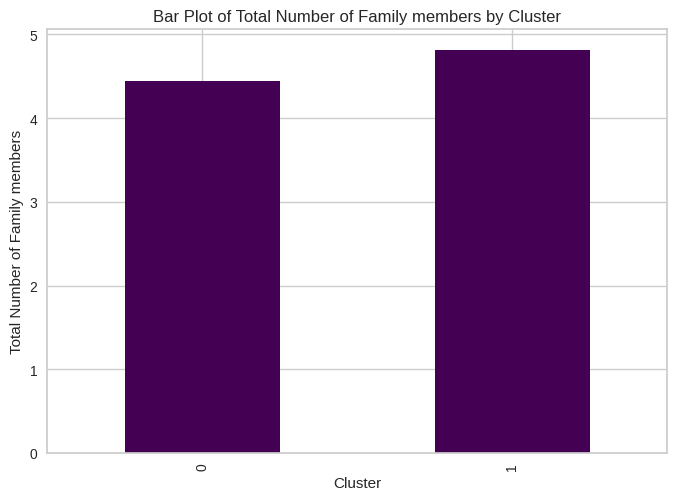

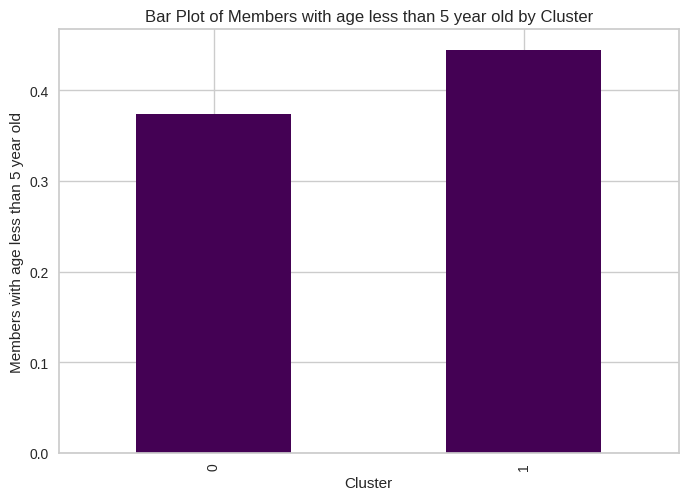

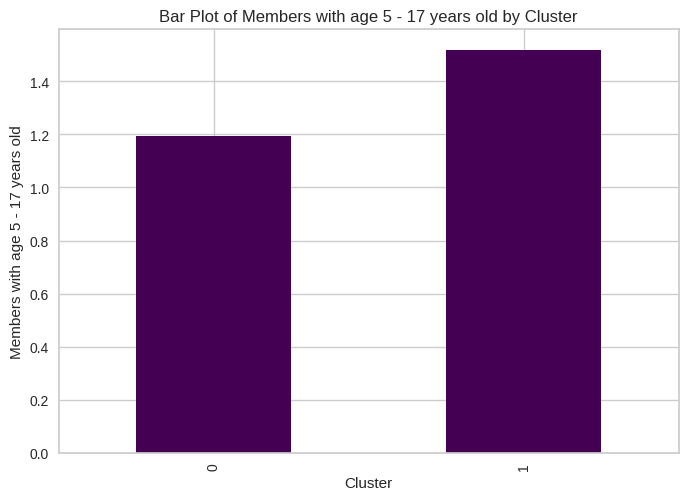

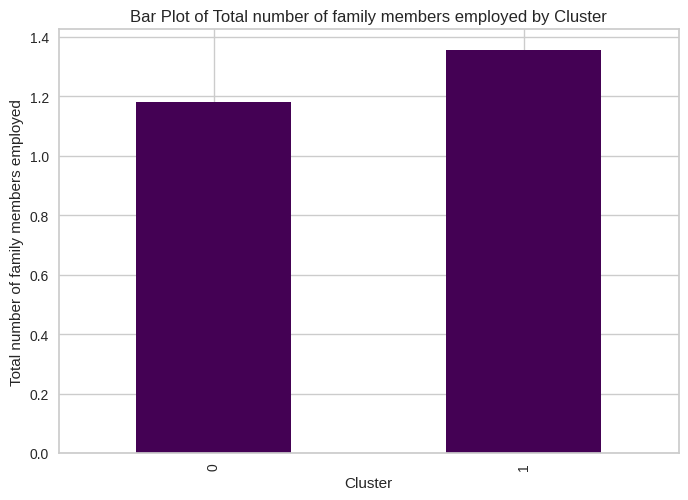

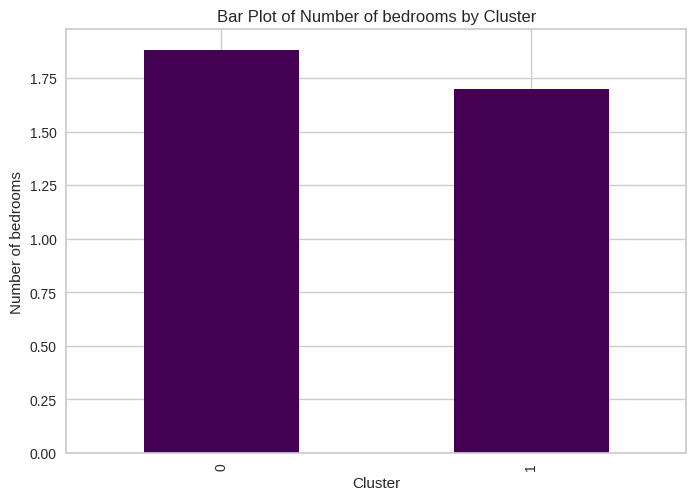

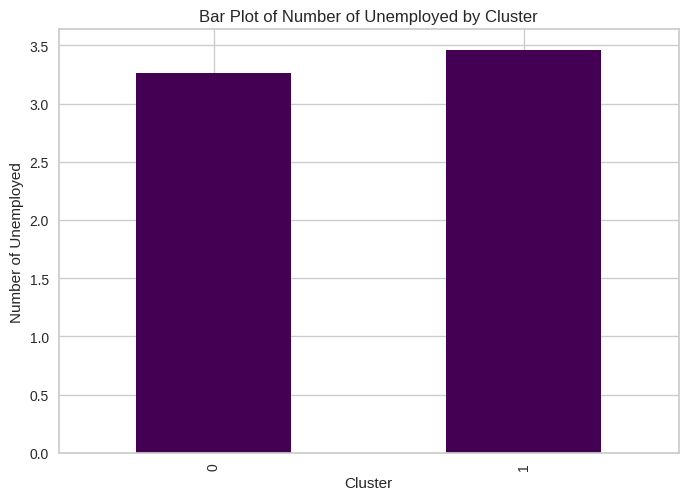

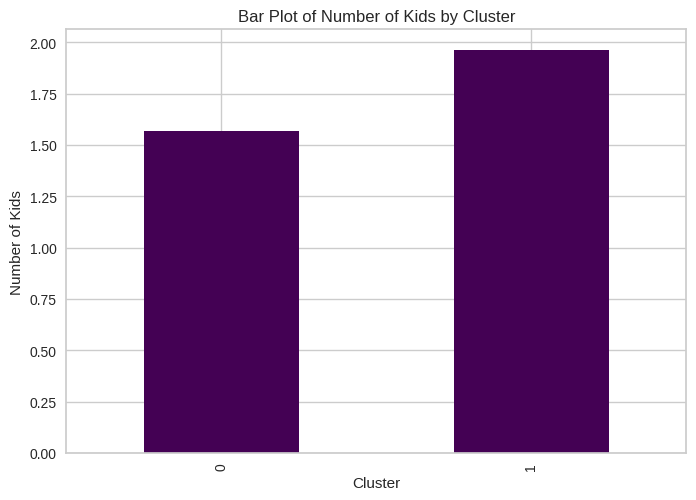

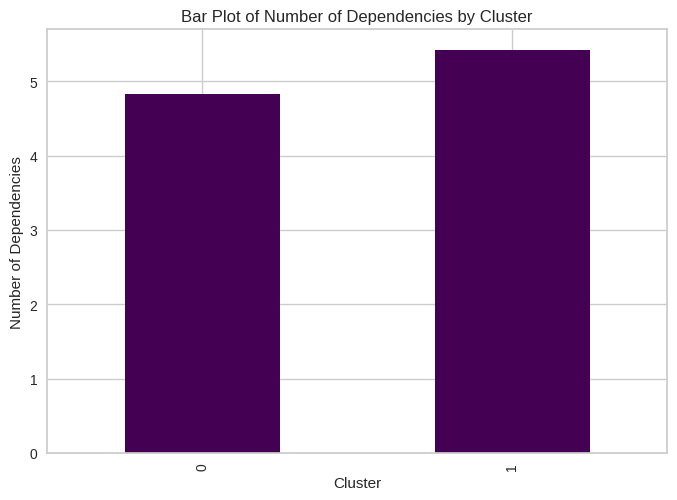

In [ ]:
# Bar Plot for family composition, based on Cluster and color coded
for column in family_size_columns:
    df.groupby('Cluster')[column].mean().plot(kind='bar', colormap='viridis')
    plt.xlabel('Cluster')
    plt.ylabel(column)
    plt.title(f'Bar Plot of {column} by Cluster')
    plt.show()

<Figure size 1400x800 with 0 Axes>

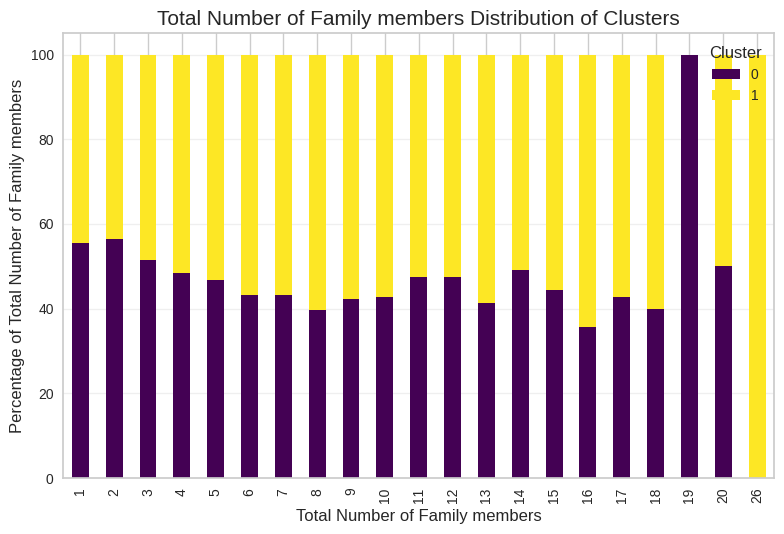

<Figure size 1400x800 with 0 Axes>

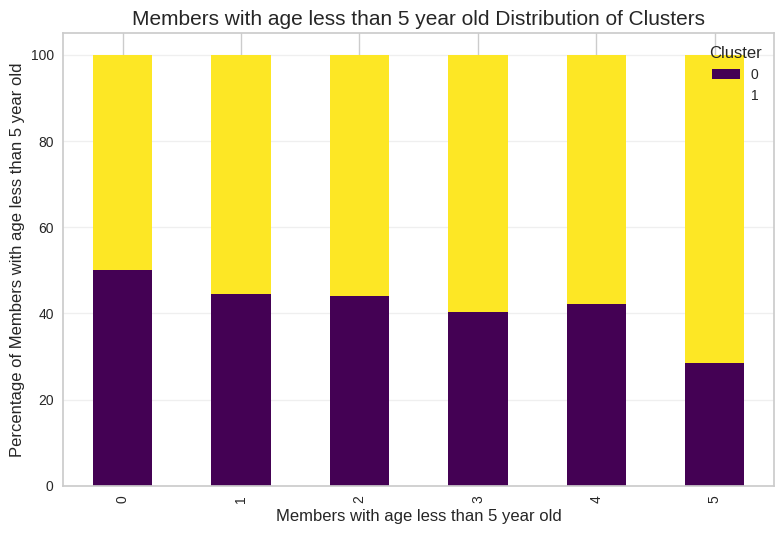

<Figure size 1400x800 with 0 Axes>

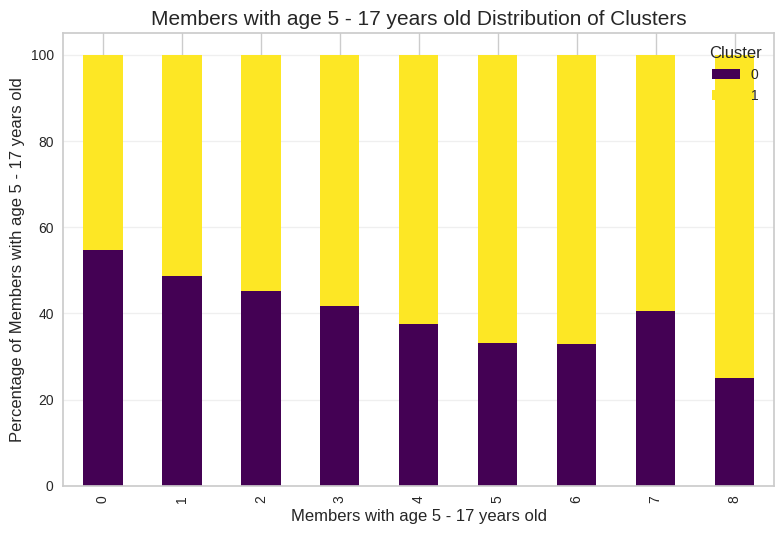

<Figure size 1400x800 with 0 Axes>

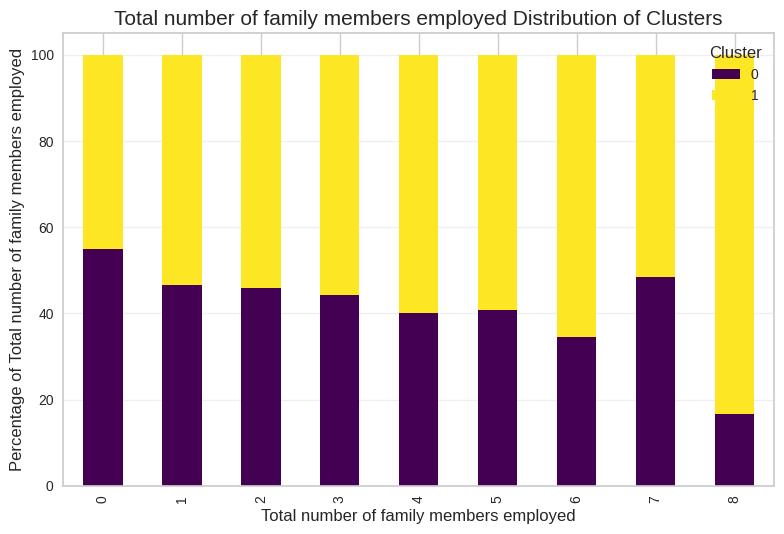

<Figure size 1400x800 with 0 Axes>

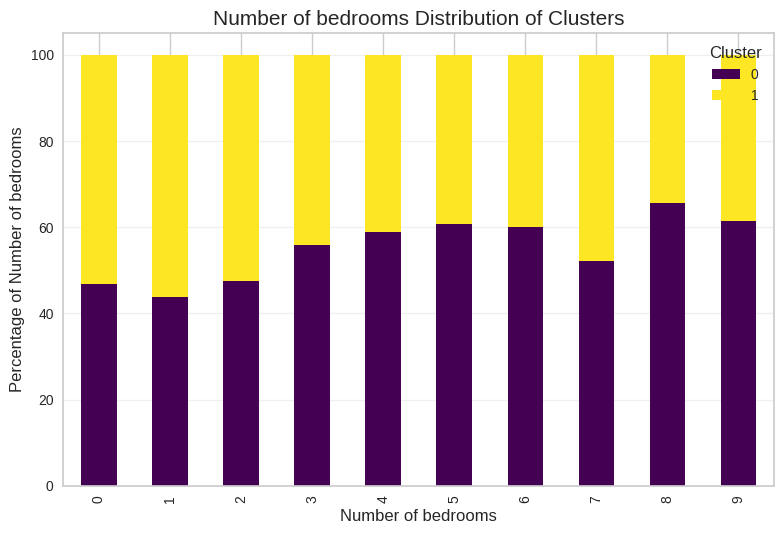

<Figure size 1400x800 with 0 Axes>

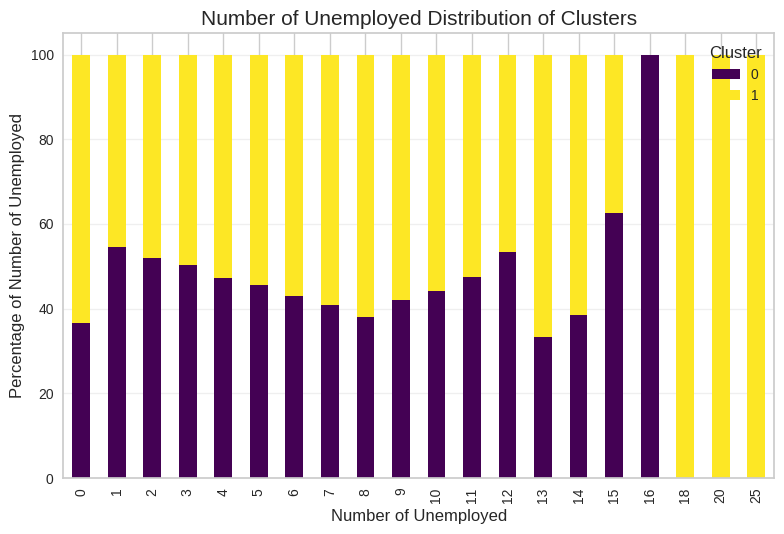

<Figure size 1400x800 with 0 Axes>

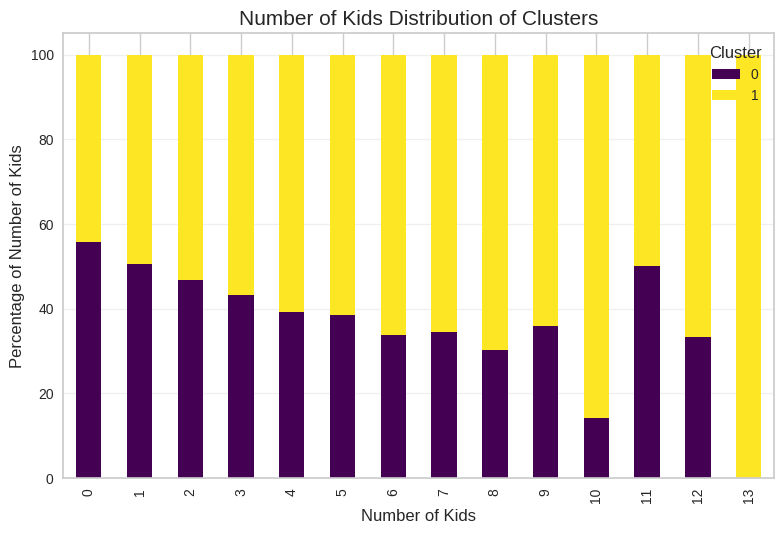

<Figure size 1400x800 with 0 Axes>

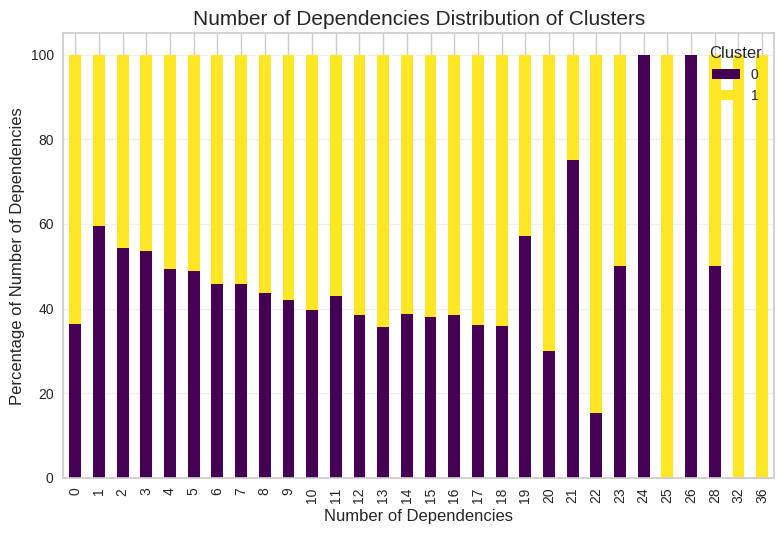

In [ ]:
for col in family_size_columns:
  region_cluster_distribution = pd.crosstab(
    df[col],
    df['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel(f'Percentage of {col}', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()

<Figure size 1400x800 with 0 Axes>

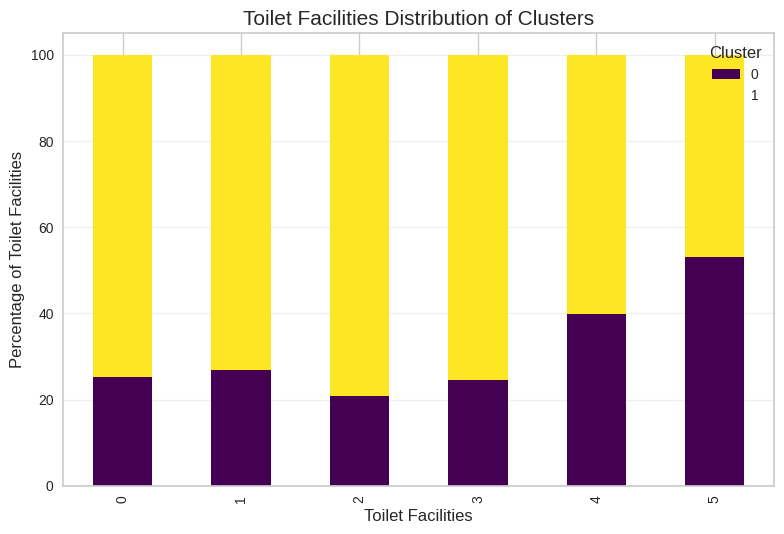

<Figure size 1400x800 with 0 Axes>

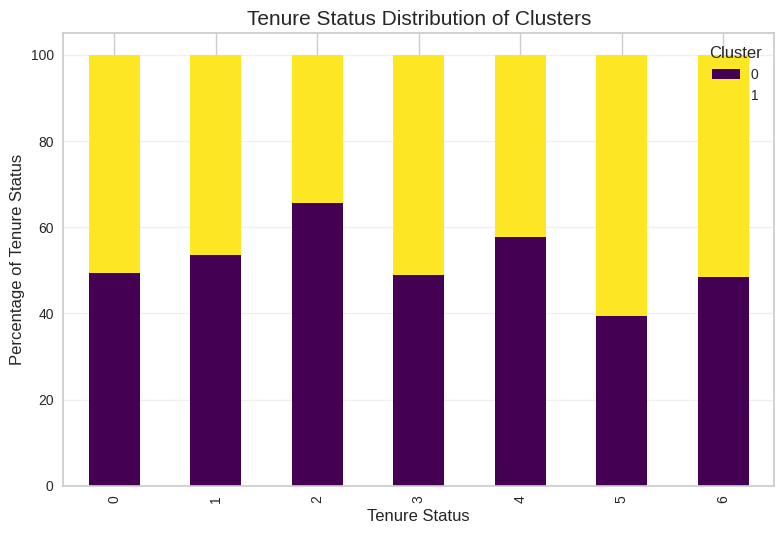

<Figure size 1400x800 with 0 Axes>

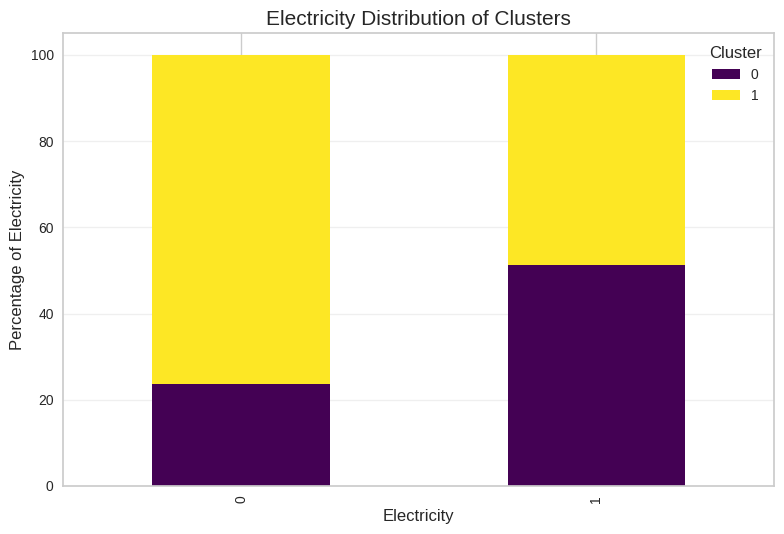

<Figure size 1400x800 with 0 Axes>

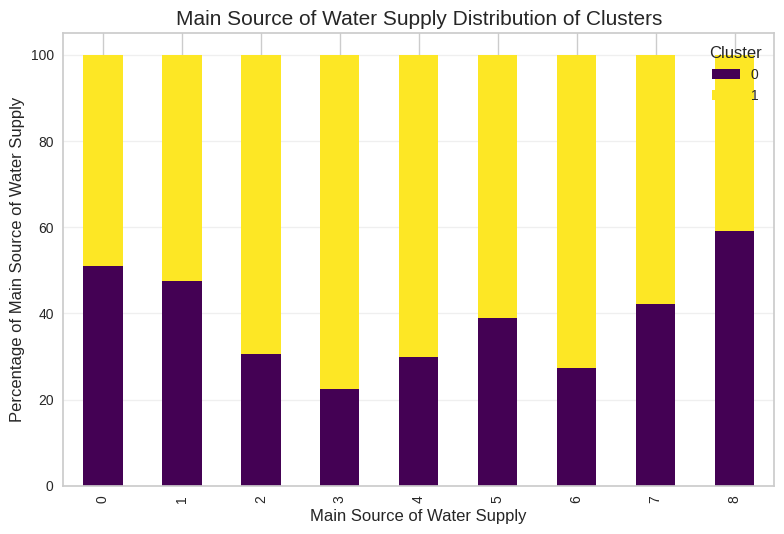

<Figure size 1400x800 with 0 Axes>

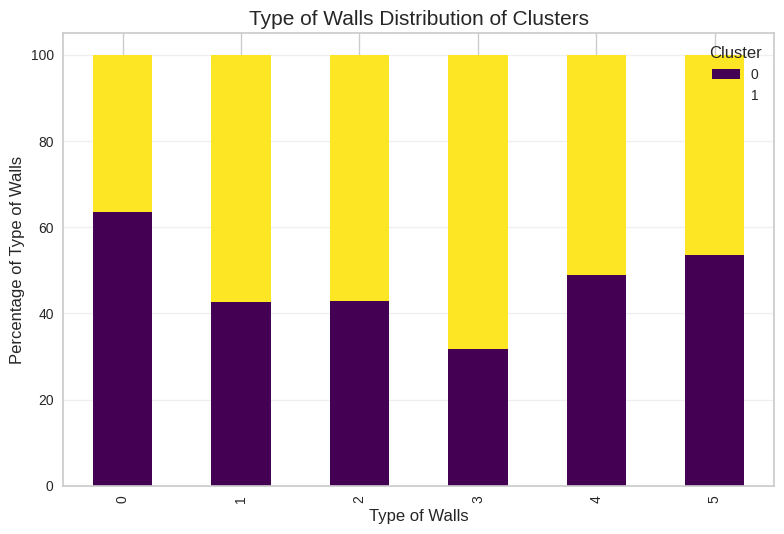

<Figure size 1400x800 with 0 Axes>

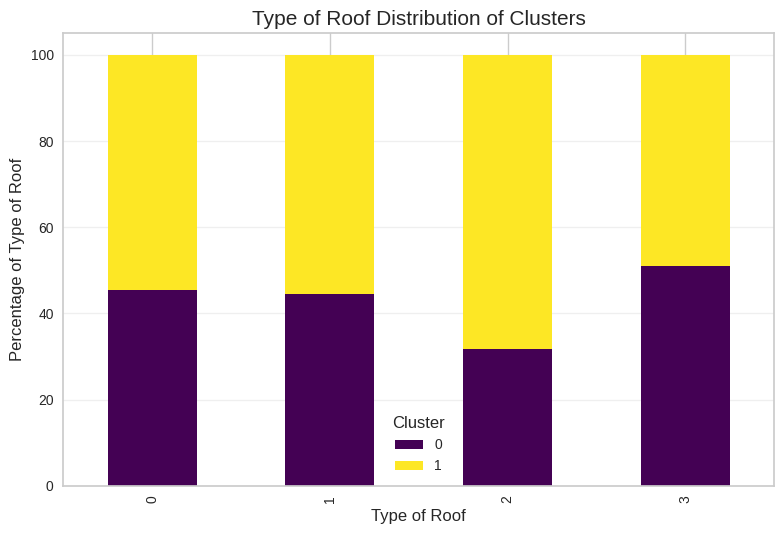

<Figure size 1400x800 with 0 Axes>

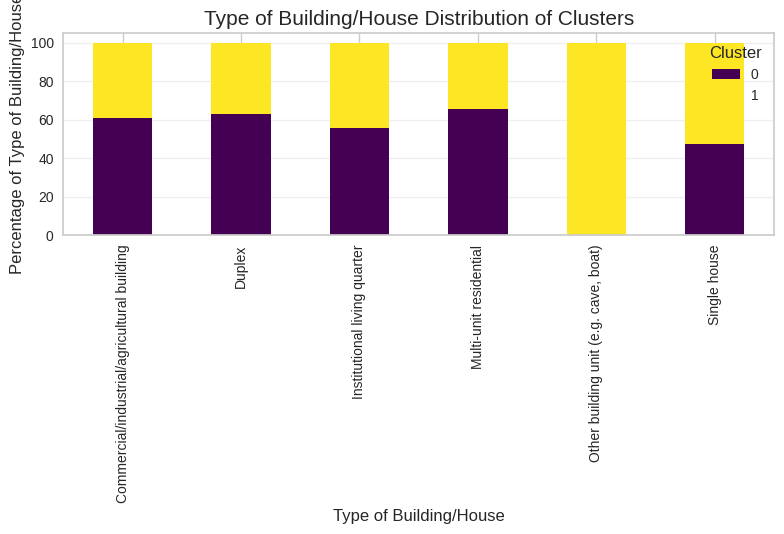

<Figure size 1400x800 with 0 Axes>

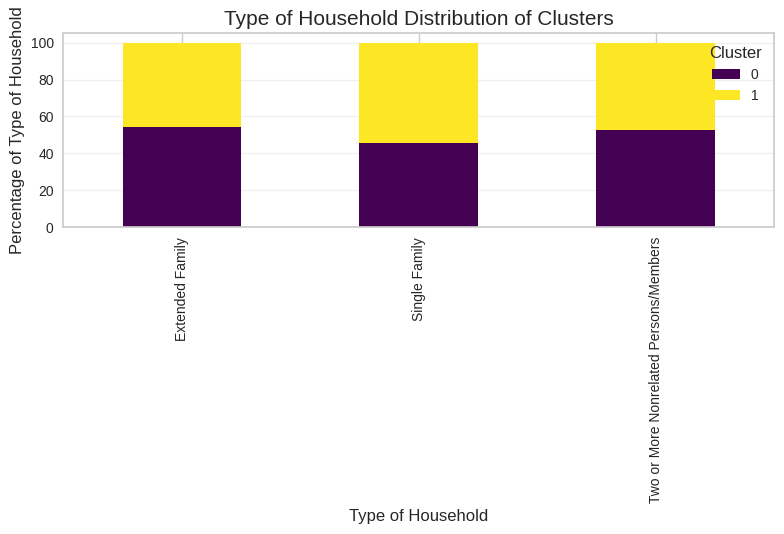

<Figure size 1400x800 with 0 Axes>

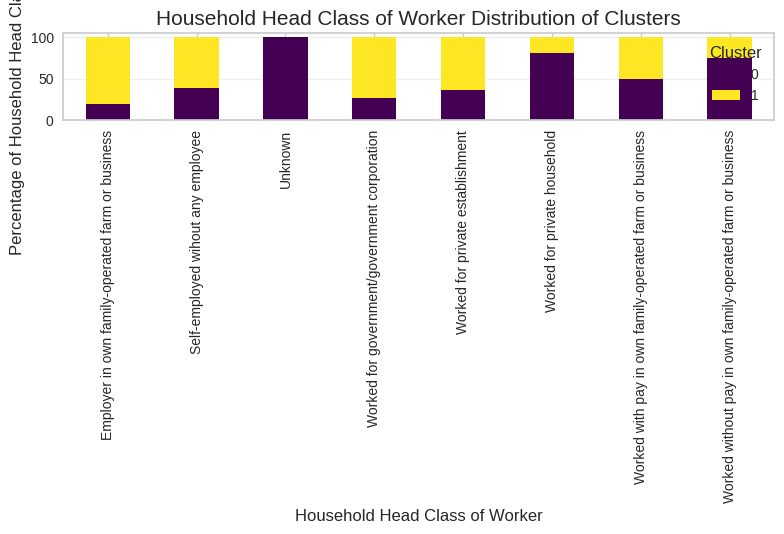

<Figure size 1400x800 with 0 Axes>

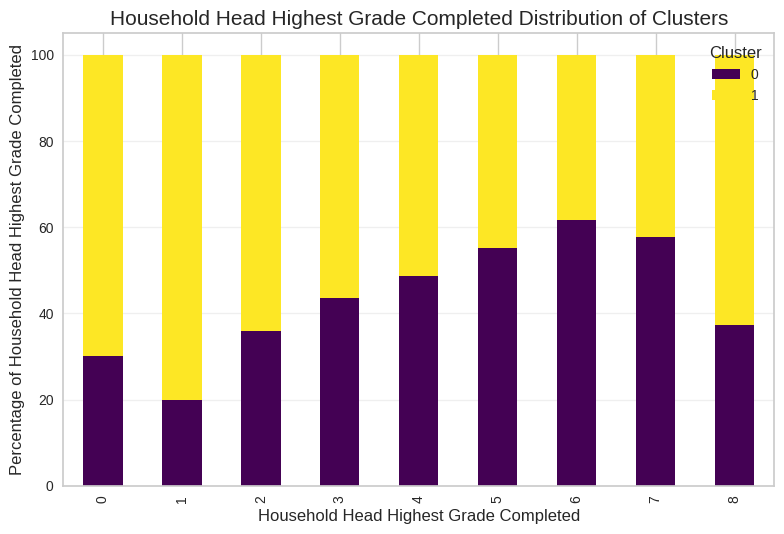

<Figure size 1400x800 with 0 Axes>

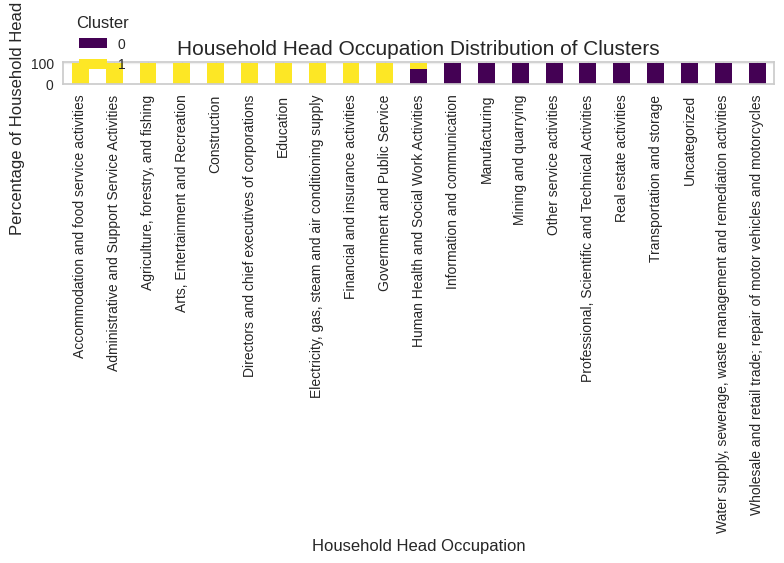

In [ ]:
for col in household_categorical_desc:
  region_cluster_distribution = pd.crosstab(
    df[col],
    df['Cluster'],
    normalize='index'
  ) * 100

  plt.figure(figsize=(14, 8))
  region_cluster_distribution.plot(kind='bar', stacked=True, colormap='viridis')
  plt.title(f'{col} Distribution of Clusters', fontsize=15)
  plt.xlabel(col, fontsize=12)
  plt.ylabel(f'Percentage of {col}', fontsize=12)
  plt.legend(title='Cluster')
  plt.grid(True, alpha=0.3, axis='y')
  plt.tight_layout()
  plt.show()